In [1]:
#grab dependencies
from scipy import stats
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import os
from functools import partial,reduce
import seaborn as sns
from datetime import datetime
import plotly.plotly as py
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [2]:
#pass in lending club file
lending_club = pd.read_csv("PMLendingClub.csv")

In [3]:
lending_club.head()

,Unnamed: 0,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_title,emp_length,home_ownership,annual_inc,issue_d,loan_status,zip_code,addr_state,dti,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,total_pymnt,total_pymnt_inv,total_rec_int,total_rec_late_fee,last_pymnt_amnt,application_type,tot_cur_bal,total_rev_hi_lim,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,pct_tl_nvr_dlq,percent_bc_gt_75,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,year
0,0,NaN,10000.0,10000.0,36 months,9.67%,321.13,B,Registered Nurse,7 years,MORTGAGE,102000.0,Dec-2013,Fully Paid,027xx,MA,15.55,0.0,11.0,NaN,9.0,0.0,9912.0,44.4%,22.0,f,11560.462185,11560.46,1560.46,0.0,320.91,Individual,39143.0,22300.0,3.0,4349.0,973.0,89.4,77.3,66.7,58486.0,39143.0,9200.0,2013
1,1,NaN,20800.0,20800.0,36 months,13.53%,706.16,B,Operations Manager,10+ years,RENT,81500.0,Dec-2013,Fully Paid,100xx,NY,16.73,2.0,64.0,NaN,29.0,0.0,23473.0,54.5%,41.0,f,23926.640008,23926.64,3126.64,0.0,13334.93,Individual,23473.0,43100.0,9.0,869.0,6811.0,54.6,90.2,50.0,43100.0,23473.0,15000.0,2013
2,2,NaN,8000.0,8000.0,36 months,10.99%,261.88,B,PARTS MANAGER,2 years,MORTGAGE,33000.0,Dec-2013,Charged Off,800xx,CO,15.75,1.0,NaN,104.0,9.0,1.0,7203.0,34.6%,16.0,f,5622.500000,5622.50,1120.22,15.0,276.88,Individual,15949.0,20800.0,2.0,1772.0,2255.0,72.5,100.0,75.0,33226.0,15949.0,8200.0,2013
3,3,NaN,28000.0,28000.0,36 months,7.62%,872.52,A,Area Sales Manager,5 years,MORTGAGE,325000.0,Dec-2013,Fully Paid,945xx,CA,18.55,1.0,NaN,NaN,15.0,0.0,29581.0,54.6%,31.0,w,29150.980000,29150.98,1150.98,0.0,23915.86,Individual,799592.0,54200.0,6.0,53306.0,13901.0,67.1,100.0,16.7,850886.0,199739.0,42200.0,2013
4,4,NaN,11500.0,11500.0,60 months,22.90%,323.54,E,Secretary,4 years,RENT,32760.0,Dec-2013,Fully Paid,937xx,CA,27.06,0.0,NaN,NaN,12.0,0.0,9996.0,70.9%,17.0,f,18786.250257,18786.25,7286.25,0.0,4874.03,Individual,24724.0,14100.0,9.0,2060.0,2689.0,70.1,100.0,50.0,30891.0,24724.0,9000.0,2013


In [4]:
#lending_club['loan_status'].value_counts()
pd.crosstab(lending_club['grade'],lending_club['year'])
#pd.crosstab(lending_club['loan_status'],lending_club['grade'],normalize='columns')

year,2012,2013,2014,2015,2016,2017
grade,,,,,,
A,10901,17679,36108,73336,70847,78796
B,18507,44116,61935,117606,134512,133127
C,11875,38134,66565,120567,132178,145144
D,7323,20569,42992,62654,59178,56646
E,3185,9059,20121,34948,25807,20167
F,1315,4393,6223,9817,9334,6242
G,261,864,1685,2167,2551,3457


In [4]:
#check null values across all columns for dataset
missing_values_column = sum(lending_club.isnull().values)
missing_values_df = pd.DataFrame(missing_values_column,columns=['missing_values'],index=lending_club.columns)
missing_values_df['col_names'] = lending_club.columns
missing_values_df = missing_values_df.sort_values(by = ["missing_values"],ascending=False)
missing_values_df.head(15)

,missing_values,col_names
id,1722891,id
mths_since_last_record,1430370,mths_since_last_record
mths_since_last_delinq,854924,mths_since_last_delinq
emp_title,109684,emp_title
emp_length,103808,emp_length
pct_tl_nvr_dlq,27894,pct_tl_nvr_dlq
avg_cur_bal,27771,avg_cur_bal
total_rev_hi_lim,27741,total_rev_hi_lim
tot_cur_bal,27741,tot_cur_bal
tot_hi_cred_lim,27741,tot_hi_cred_lim


<Figure size 1440x720 with 0 Axes>

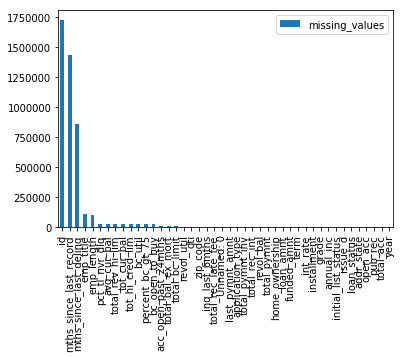

In [8]:
#plot of missing values
plt.figure(figsize=(20,10))
missing_values_df.plot(kind='bar')
stats.describe(missing_values_df['missing_values'])
#keep columns that have less than mean
mean = 101444

In [9]:
columns_to_keep = list(missing_values_df[missing_values_df["missing_values"] < mean]['col_names'])
#subset columns of lending club
columns_to_keep

['pct_tl_nvr_dlq',
 'avg_cur_bal',
 'total_rev_hi_lim',
 'tot_cur_bal',
 'tot_hi_cred_lim',
 'bc_util',
 'percent_bc_gt_75',
 'bc_open_to_buy',
 'acc_open_past_24mths',
 'total_bal_ex_mort',
 'total_bc_limit',
 'revol_util',
 'dti',
 'zip_code',
 'inq_last_6mths',
 'total_rec_late_fee',
 'Unnamed: 0',
 'last_pymnt_amnt',
 'application_type',
 'total_pymnt_inv',
 'total_rec_int',
 'revol_bal',
 'total_pymnt',
 'home_ownership',
 'loan_amnt',
 'funded_amnt',
 'term',
 'int_rate',
 'installment',
 'grade',
 'annual_inc',
 'initial_list_status',
 'issue_d',
 'loan_status',
 'addr_state',
 'open_acc',
 'pub_rec',
 'total_acc',
 'year']

In [10]:
columns_to_keep = list(missing_values_df[missing_values_df["missing_values"] < mean]['col_names'])
#subset columns of lending club
lending_club = lending_club[columns_to_keep]
lending_club.head(5)
#making list of columns that are not numeric
non_numeric_columns = ['zip_code','application_type','home_ownership','term','grade',
                       'initial_list_status','issue_d','loan_status','addr_state',
                      'Unnamed: 0']
lending_club_numeric = lending_club.drop(non_numeric_columns,axis=1)
numeric_columns = list(lending_club_numeric.columns)

In [12]:
lending_club_numeric.columns

Index(['pct_tl_nvr_dlq', 'avg_cur_bal', 'total_rev_hi_lim', 'tot_cur_bal', 'tot_hi_cred_lim', 'bc_util', 'percent_bc_gt_75', 'bc_open_to_buy', 'acc_open_past_24mths', 'total_bal_ex_mort', 'total_bc_limit', 'revol_util', 'dti', 'inq_last_6mths', 'total_rec_late_fee', 'last_pymnt_amnt', 'total_pymnt_inv', 'total_rec_int', 'revol_bal', 'total_pymnt', 'loan_amnt', 'funded_amnt', 'int_rate', 'installment', 'annual_inc', 'open_acc', 'pub_rec', 'total_acc', 'year'], dtype='object')

In [9]:
#there are three columns of type class object, lets examine
object_columns = ['revol_util','int_rate']
lending_club_numeric[object_columns].head(11)
#create function that removes percent sign and converts 
def change_percent(x):
    #x must be a string,remove percent
    if type(x) == str: 
        x = x.strip('%')
        #convert to float
        x = float(x)
        #covernt to percntage points
        x = x*.01
        #return x
        return(x)
    else:
        pass
#apply function to columns with percents
lending_club_numeric['revol_util'] = lending_club_numeric['revol_util'].apply(change_percent)
lending_club_numeric['int_rate'] = lending_club_numeric['int_rate'].apply(change_percent)
#data looks good, all columns type float

In [10]:
print('before dropping nas')
print(lending_club_numeric.shape)
lending_club_dropped = lending_club_numeric.dropna()
#check that there are no non null values
sum(lending_club_dropped.isnull().values)
print(lending_club_dropped.shape)

before dropping nas
(1722891, 29)
(1675043, 29)


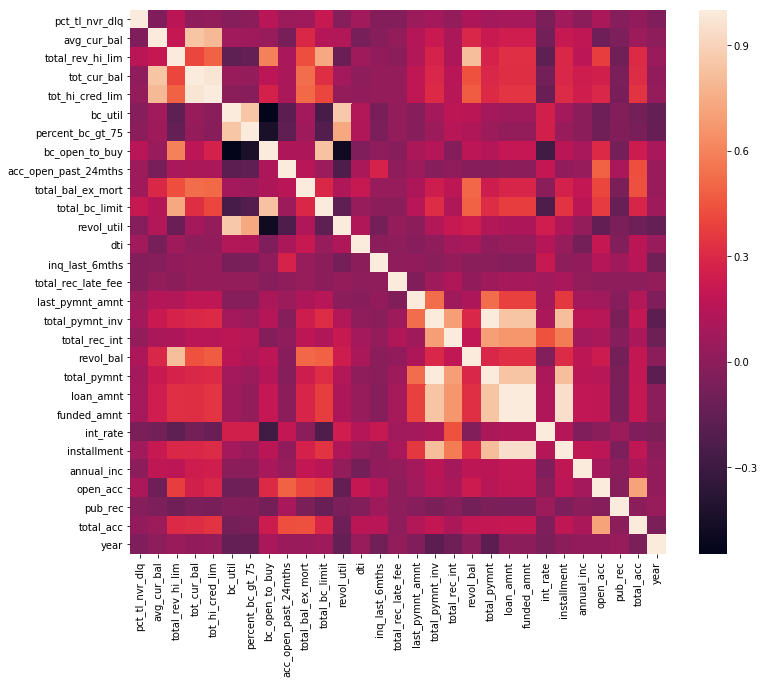

In [11]:
#get correlation matrix
corr_lending = lending_club_dropped.corr()
# plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_lending, 
        xticklabels=lending_club_dropped.columns,
        yticklabels=lending_club_dropped.columns)

/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



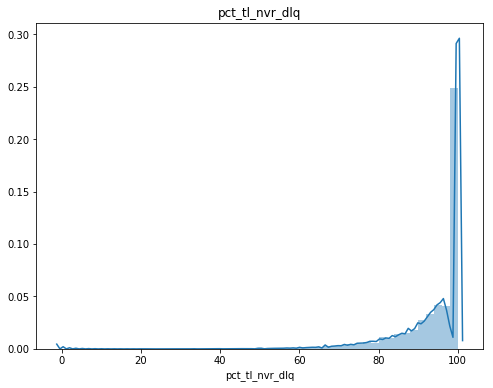

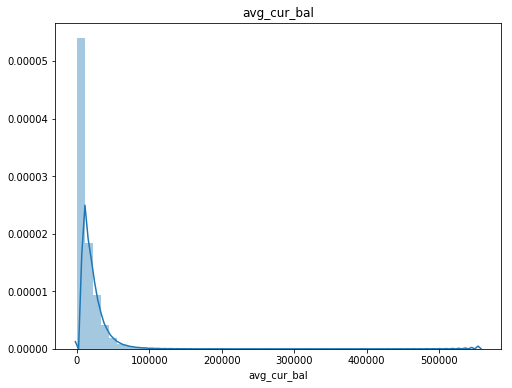

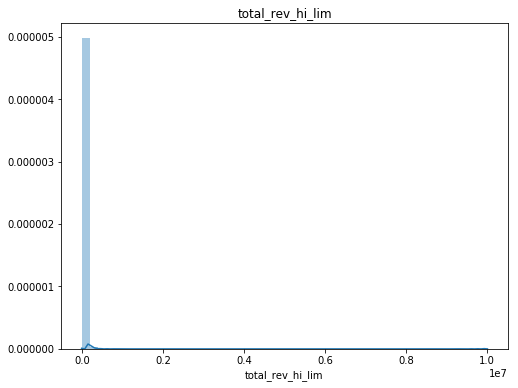

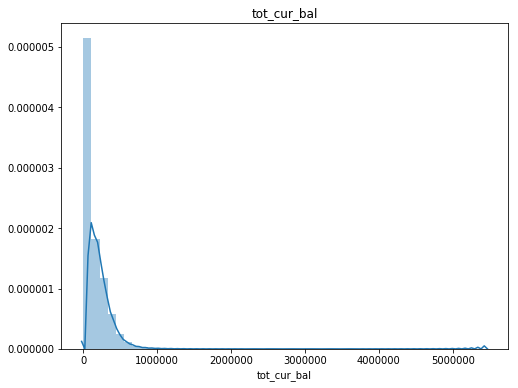

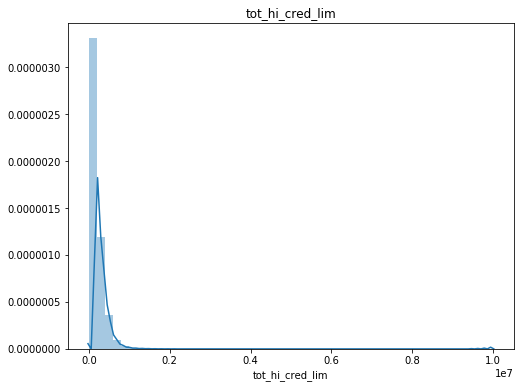

...

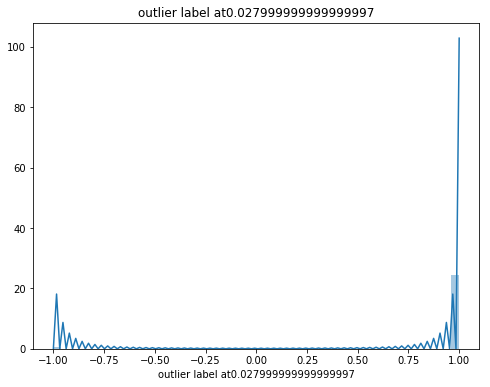

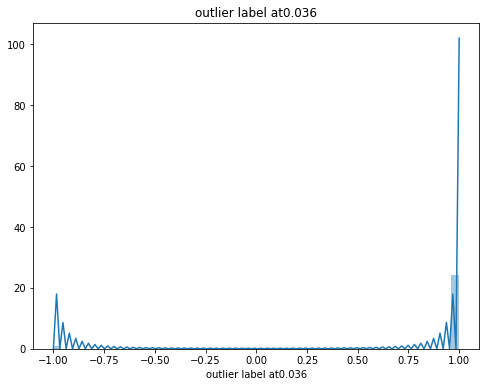

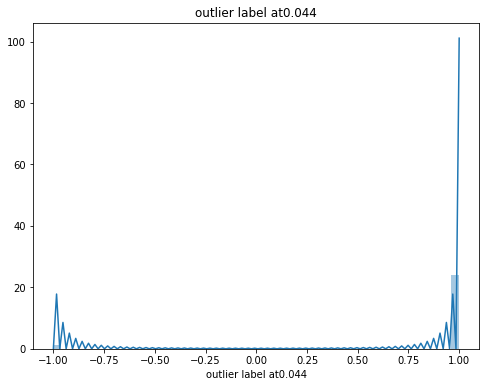

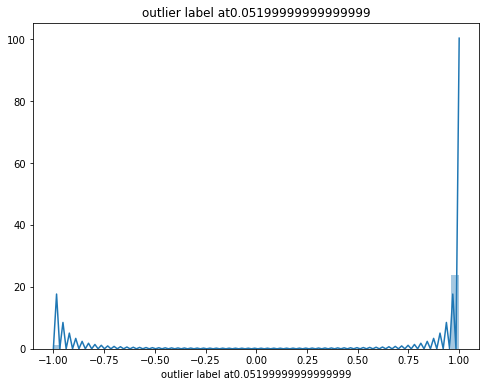

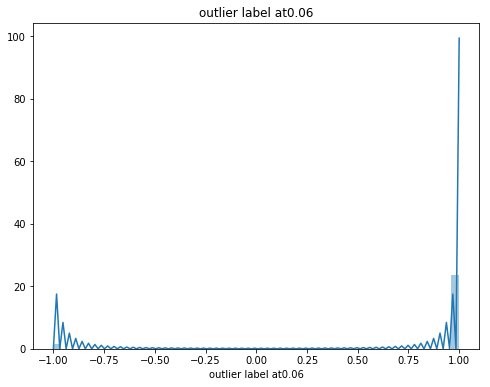

In [159]:
#lets look at the distributions for each of the variables
#get kdeplots for each continueos variable
for feature in list(lending_club_dropped.columns):
    #plot
    plt.figure(figsize=(8,6))
    sns.distplot(lending_club_dropped[feature])
    plt.title(feature)
    plt.show()
#clearly there are outliers
#the variables that appear to have more than one distributino in them are:
#['tot_cur_bal','tot_hi_cred_lim','percent_bc_gt_75','bc_open_to_buy','acc_open_past_24mths','dti',
#'inq_last_6mths','total_pymnt_inv','total_pymnt','loan_amount','funded_amnt','int_rate','installment',
#'open_acc','total_acc','year']

In [14]:
#get the covariance matrix, and compart
#cov_lending = np.cov(lending_club_dropped.values)
#np.cov takes to long, lets try
#standardize the data, turns into an array
from sklearn.preprocessing import StandardScaler
lending_club_std = StandardScaler().fit_transform(lending_club_dropped)
lending_club_std.shape

/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.

/anaconda3/lib/python3.7/site-packages/sklearn/base.py:462: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.



(1675043, 29)

In [15]:
#eigendecompose the covriance martrix
#get mean across the column
mean_vec = np.mean(lending_club_std, axis=0)
#covarmatrix is XdotX^t mean centered over n -1
cov_mat = (lending_club_std - mean_vec).T.dot((lending_club_std - mean_vec)) / (lending_club_std.shape[0]-1)
#sns.heatmap(cov_mat,
            #xticklabels=lending_club_dropped.columns,
            #yticklabels=lending_club_dropped.columns)

In [16]:
#eigendecompistion of
eig_vals, eig_vecs = np.linalg.eig(cov_mat)
#check everything that each eigen vector eqauls to 1
for ev in eig_vecs:
    np.testing.assert_array_almost_equal(1.0, np.linalg.norm(ev))
print('Everything ok! wohooo')

Everything ok! wohooo


In [17]:
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort()
eig_pairs.reverse()

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
#print('Eigenvalues in descending order:')
#for i in eig_pairs:
#    print(i[0])
    
eig_vals_sorted = [i[0] for i in eig_pairs]
eig_vec_sorted = [i[1] for i in eig_pairs]
loading_vectors = pd.DataFrame(data = eig_vec_sorted,index=lending_club_dropped.columns)
loading_vectors

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28
pct_tl_nvr_dlq,-5.129980e-02,-0.168463,-0.233538,-0.237497,-0.250075,-9.131537e-03,-2.796496e-03,-0.141076,-4.335056e-02,-0.204632,-0.226032,-0.034487,-3.234714e-02,-1.151572e-02,-2.915690e-02,-0.162710,-0.308482,-0.219933,-0.221797,-0.308474,-0.322325,-0.322325,-0.017507,-0.306448,-1.073416e-01,-0.150072,4.060228e-02,-0.158680,0.014793
avg_cur_bal,-5.361583e-02,-0.001590,-0.228430,-0.080456,-0.117856,3.897063e-01,3.544573e-01,-0.356383,-1.545787e-01,-0.065166,-0.254214,0.377274,3.234999e-02,-4.521374e-02,3.981557e-02,0.041483,0.156474,0.220512,-0.041995,0.156495,0.127081,0.127081,0.230301,0.134136,-2.870890e-02,-0.193918,2.582620e-04,-0.160510,-0.108050
total_rev_hi_lim,2.539798e-02,-0.308494,-0.125916,-0.347054,-0.323453,-2.764967e-01,-2.651789e-01,0.126442,6.763035e-03,-0.266072,0.004996,-0.268695,-9.346339e-02,1.635233e-02,1.683095e-02,0.132262,0.216202,0.168092,-0.254286,0.216197,0.201057,0.201057,0.058573,0.199474,-7.293921e-02,-0.062662,4.715924e-02,-0.093046,-0.008140
tot_cur_bal,3.170876e-02,-0.294008,-0.027302,-0.124828,-0.125867,8.665352e-02,8.685603e-02,-0.087702,4.512033e-01,0.154703,-0.069909,0.026284,2.832287e-01,2.736443e-01,3.073009e-02,-0.038660,-0.040820,0.105580,-0.026531,-0.040789,-0.037180,-0.037181,0.302675,-0.022724,-7.038685e-02,0.436414,8.539070e-02,0.388561,-0.056986
tot_hi_cred_lim,-2.838276e-01,0.353895,-0.304824,0.294236,0.250252,-1.680047e-01,-1.797111e-01,-0.197547,2.196451e-01,-0.011309,-0.318547,-0.179051,-1.908156e-01,2.364787e-01,6.141526e-02,0.115882,0.028619,0.032708,-0.290541,0.028609,0.007248,0.007250,0.133624,0.011049,1.007073e-01,-0.053223,1.933307e-01,0.073814,0.009702
bc_util,-1.938354e-01,-0.006011,0.038957,-0.010533,-0.003333,-6.124635e-02,-7.252624e-02,-0.006977,-1.486660e-02,0.094409,-0.003254,-0.037232,2.035299e-01,-1.572335e-01,4.539938e-01,-0.359371,-0.128504,0.188481,0.058402,-0.128541,0.099434,0.099434,0.178933,0.095194,2.221535e-02,-0.052932,8.264676e-02,-0.143579,0.613344
percent_bc_gt_75,-2.456539e-02,-0.003788,-0.230981,0.035965,0.021630,1.281837e-02,-8.109119e-03,-0.122399,3.434873e-03,0.116249,-0.150924,-0.018739,3.251440e-01,-5.180308e-01,-2.677695e-01,0.252842,0.052678,-0.177144,-0.230066,0.052659,0.060274,0.060275,-0.280611,0.049044,-1.448271e-01,0.162825,-9.209647e-02,0.206135,0.325524
bc_open_to_buy,1.508762e-01,-0.091972,0.085925,-0.080056,-0.074652,8.628785e-02,7.041952e-02,-0.039314,7.782654e-02,0.022085,0.014464,0.060374,-1.526503e-01,2.788724e-03,-2.995408e-01,0.157223,-0.020446,-0.127901,0.130385,-0.020473,0.021954,0.021955,-0.008382,0.040554,3.781176e-01,-0.036742,7.144420e-01,-0.072309,0.300759
acc_open_past_24mths,3.909107e-01,0.191865,0.053517,0.110982,0.102104,-8.854496e-02,-7.794046e-02,0.015574,4.767692e-02,-0.036881,0.004616,-0.060283,3.284661e-01,1.725250e-01,-2.872960e-01,0.117213,-0.026768,0.061853,0.063642,-0.026788,-0.012997,-0.012996,0.320916,-0.023430,-5.237924e-01,-0.204181,9.062717e-02,-0.274311,0.129225
total_bal_ex_mort,-5.792779e-01,-0.073331,0.118937,-0.076751,-0.061536,-1.019695e-02,-1.396850e-02,0.027783,-2.326941e-02,0.016497,0.047013,0.019560,-6.295556e-03,2.233188e-01,-5.399402e-01,0.090108,-0.030242,0.002433,0.137973,-0.030262,0.006469,0.006469,0.217446,0.014894,1.192481e-01,-0.055038,-3.621057e-01,-0.072423,0.243140


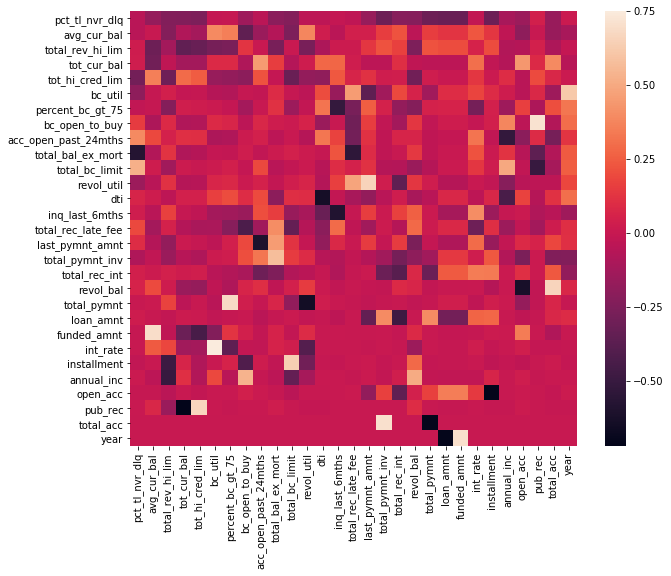

In [18]:
#show eigen vector matrix
plt.figure(figsize=(10,8))
sns.heatmap(loading_vectors.values,
            xticklabels=lending_club_dropped.columns,
            yticklabels=lending_club_dropped.columns)

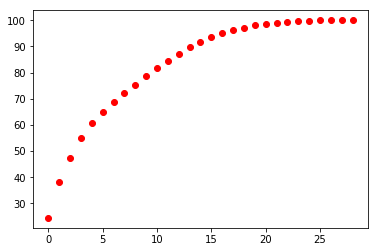

In [19]:
#scree plot of percent variance explained and PC
tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
plt.plot(cum_var_exp,'ro')
plt.show()
#14 PC's explain 90 percent of the variance
#need to identitfy outliers, and see if less a smaller amount of PC's can explain more variance
#but lets keep going with the 14 PC's first

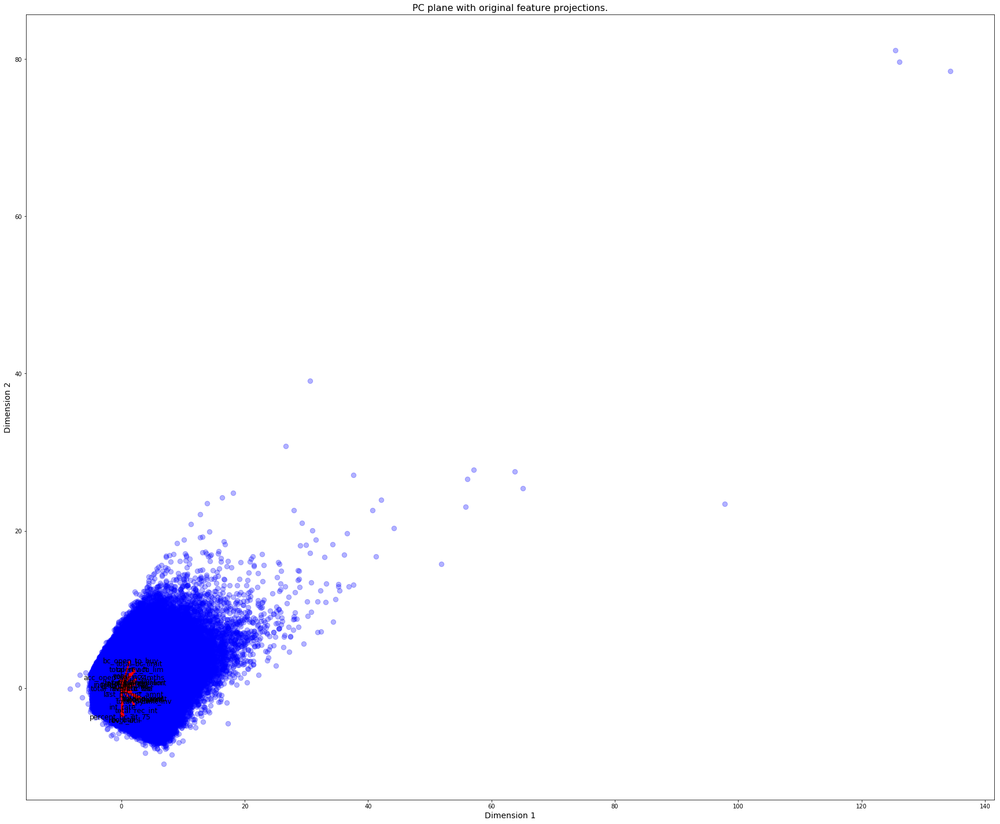

In [20]:
# creating a biplot
from sklearn.decomposition import PCA
pca = PCA(n_components=2).fit(lending_club_std)
reduced_data = pca.transform(lending_club_std)
pca_samples = pca.transform(lending_club_std)
reduced_data = pd.DataFrame(reduced_data, columns = ['Dimension 1', 'Dimension 2'])

def biplot(data, reduced_data, pca):
    fig, ax = plt.subplots(figsize = (30,25))
    # scatterplot of the reduced data 
    ax.scatter(x=reduced_data.loc[:, 'Dimension 1'], y=reduced_data.loc[:, 'Dimension 2'], facecolors='b', edgecolors='b', s=70, alpha=0.3)
    feature_vectors = pca.components_.T
    # using scaling factors to make the arrows
    arrow_size, text_pos = 9.0, 11.0,
    # projections of the original features
    for i, v in enumerate(feature_vectors):
        ax.arrow(0, 0, arrow_size*v[0], arrow_size*v[1], head_width=0.2, head_length=0.2, linewidth=2, color='red')
        ax.text(v[0]*text_pos-np.random.normal()*.3, v[1]*text_pos+np.random.normal()*.3, lending_club_dropped.columns[i], color='black', ha='center', va='center', fontsize=12)
        #ax.annotate(continous_variables[i], xy=(v[0]*text_pos, v[1]*text_pos), xytext=(v[0]+np.random.uniform(), v[1]+np.random.uniform()),
                    #arrowprops=dict(facecolor='black', shrink=0.05),)
    ax.set_xlabel("Dimension 1", fontsize=14)
    ax.set_ylabel("Dimension 2", fontsize=14)
    ax.set_title("PC plane with original feature projections.", fontsize=16);
    return ax
biplot(lending_club_std, reduced_data, pca)
#there are a shit ton of outliers!

In [21]:
#note this takes a while to run
#outlier determination
# EllipticEnvelope uses Mahalanobis distance 
from sklearn.covariance import EllipticEnvelope
#lets play with the outiers range from 2 to 5
outlier_fracs = np.linspace(.02,.06,6)
labels_for_contamination_thresholds = []
for i in np.arange(len(outlier_fracs)):
    #fit the model with the contimnation range
    ell = EllipticEnvelope(contamination=outlier_fracs[i])
    #train the estimator
    ell.fit(lending_club_std)
    #get the predictions
    pred = ell.predict(lending_club_std)
    #put labels into list
    labels_for_contamination_thresholds.append(pred)
    

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.516889023217786 > -175.388723913701853). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.105301472438015 > -191.279958167666820). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.341729842263703 > -193.440546580760071). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.258011994448424 > -190.837089244258777). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.477926918313557 > -177.520282276232706). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.901776884362803 > -173.881744755837730). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.257286616849143 > -177.525309199609495). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.314802320894572 > -174.400393818509031). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.688598800698927 > -171.155957620395839). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.091107265191638 > -174.419579862791977). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.606097313368537 > -173.269999485217085). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.068836622019347 > -174.723463743436980). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.630007185194629 > -175.602485182587401). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.389358768054763 > -173.254700872120281). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.213885884629008 > -173.443499744331035). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.321110943131700 > -173.524522456340549). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.871344334355399 > -175.660579923780972). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.388516408855224 > -179.458429000132867). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.293748647790494 > -176.955951731792595). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.505792920577633 > -177.908943050618888). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.451545764174966 > -176.936336499488050). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.067912800041825 > -176.034044625273737). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.985001201110506 > -176.246564271224798). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.623358636471153 > -173.581047254468473). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.313213179060241 > -176.706460123592848). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.886077599736808 > -177.271043944474314). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.599730389289562 > -125.166874851180395). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.983953130175465 > -171.339488925630661). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.007411136253566 > -169.632340627475173). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.008449431458828 > -173.444924006179463). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.272446510815527 > -191.899799997867717). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.643611421336885 > -174.510291861498587). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.926920083558144 > -173.379135455028035). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.932105291741493 > -175.681423078661794). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.451517102419146 > -176.254453264242812). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.898713381764495 > -172.374497162818614). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.836324730942096 > -173.646529854557997). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.655287019233711 > -176.523110538126133). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.159787619234990 > -174.284212815372967). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.258953420371597 > -173.803562240283640). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.923073179051713 > -172.930635573537842). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.505811163662884 > -174.105780476963332). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-127.983055054497186 > -176.578053730392355). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.012135718528540 > -173.508401931659677). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.418171434558914 > -173.013812844818688). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.604852334872092 > -175.004081519248103). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.871799370860217 > -177.704479999531458). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.600459662246223 > -169.947950117043575). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-100.699829519357962 > -186.444986875720161). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.023421177353072 > -177.079046815903439). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.381420061106468 > -175.131163010879192). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.357696378445254 > -173.687326169231454). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.190581918127094 > -183.443866200400379). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.480053941557856 > -173.215084352273976). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-127.628803510565120 > -176.960120177034781). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.679746497095081 > -170.848969969156684). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.277448829367614 > -172.766044262588935). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.145432913592870 > -172.620616681899435). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.431100662702804 > -108.622347496826819). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.662189656676802 > -108.075360271722047). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.424501163205264 > -112.018698888318639). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.515688811628223 > -176.675180497899845). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.012661379552782 > -174.580723001506669). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.367408745996229 > -178.319962136754782). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.398220039904430 > -110.020135841229106). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.449825562798267 > -175.396179891400095). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.974054892849111 > -192.992039272462279). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.496292106150648 > -171.994884624146181). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.514823566194579 > -174.142020484862485). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.882666985015277 > -175.723447742443966). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.530214693096880 > -177.143249151511128). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.025988857739250 > -191.955965502683000). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.584393559858398 > -174.476272623061476). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.036852989986585 > -177.394017282858954). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.173382086162917 > -177.738790753024659). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.568482729399534 > -108.360243103005985). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-118.411367940145880 > -169.055947286710534). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.610828875901518 > -174.217376586219302). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.436482820125335 > -178.020352505502046). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.255447481146319 > -174.304095155896704). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.879178669564396 > -171.837782520604406). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.493347308934730 > -171.628035316156598). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.904858445672346 > -177.995626548171543). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.678049483564862 > -176.132351403264408). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.509681798249119 > -174.721775966773407). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.530471950087886 > -173.227887643751416). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.626997652995300 > -174.544874759871249). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.205520083866901 > -107.496886053897569). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.681597545741496 > -112.162467659590178). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.930125295775795 > -173.093481993070441). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.234183449350610 > -190.231281734601282). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.265989667041538 > -173.072703965938018). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.162839435257325 > -178.203522022511464). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.093184816005575 > -122.307972340077612). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-127.565832915847196 > -180.938645610283544). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.269006061975389 > -176.362702843674583). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.108026897375524 > -170.336839219608095). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.199800275508494 > -106.688479926636575). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.633842831599537 > -120.720552391581450). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.457989683542493 > -176.072935791502942). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.415182843372364 > -172.100873054350615). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.552210315770537 > -176.195761741800055). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.803477502123101 > -179.080190800222738). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.978174687422253 > -178.260175590198713). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.982796243727691 > -173.099739578194345). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.150862193327654 > -172.389004033711615). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.337178605147088 > -174.797554682750047). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.865605059068031 > -180.872891695382521). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.530848294628626 > -172.765456302001610). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.516517572443348 > -173.442507773528803). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.298289443108374 > -172.549736721966582). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.055200529639947 > -168.465694412824860). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.876345882145515 > -179.374101786127852). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.725680696182735 > -171.784048770053175). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.641436117593628 > -173.521952518669394). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.034053275891367 > -172.015567440211441). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.545670607795060 > -174.549677077140757). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.628370439344621 > -114.444501842543104). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.313455483346004 > -172.853082089569796). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.600754145381202 > -169.607480560250167). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.828129427415661 > -112.911589321184309). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.866026370076511 > -173.897527141850816). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.236005879432170 > -173.974042588946190). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.487733189891841 > -170.100924939777400). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.596603205708846 > -170.621783437825030). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.413024080904734 > -178.598701798838590). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.128558806153521 > -175.161141850960632). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.561423658559534 > -178.299154745507082). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.073931190972118 > -179.211269479940512). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.118710960030739 > -170.998083142533943). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.808514476221745 > -179.383115479670835). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.297822505642543 > -180.677578811098385). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.627090963397862 > -114.641377715046715). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.775972324760687 > -170.022253275995894). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.842416375413961 > -173.773774576702749). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.993871108127507 > -166.004731575626437). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.886496650276214 > -170.683384442432896). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.863703988868693 > -175.078765381101476). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.503868265992423 > -166.665134623400292). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.911522352828911 > -173.928871226046454). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.074958243759667 > -169.050911323331036). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.061915111778859 > -181.547070195769578). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.205360889882400 > -172.627167305294307). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.691585211743529 > -171.744976021252086). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.347011529989686 > -116.010039428290810). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.075373929754974 > -116.703022558978148). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.357696010410763 > -171.631914881646651). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.029405004337008 > -170.689196187343299). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.336504859673155 > -113.924993719489549). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.183892365871856 > -169.176292263723894). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.472860220805771 > -115.684820345919547). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.218598823671513 > -171.661339758864273). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.416749555337788 > -167.231667651004557). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.947950348486131 > -174.273637019310740). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.148250775190974 > -173.690046535770364). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.090051144643212 > -169.978329796802740). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.274275418176074 > -178.925140589684162). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.453862603650521 > -178.760281581434299). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.729053297407546 > -179.105792418961897). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.230486972180671 > -169.913726986193922). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.563232866002437 > -178.892622876326868). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.067720088752552 > -172.763927569553658). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.848272762160235 > -175.131571557682292). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.215118519303530 > -172.782287278322542). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.367775824665870 > -167.316828791048465). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.774055384166928 > -166.682525791750663). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.859481159934759 > -171.271687387885351). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.872783786070485 > -173.580617170356277). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.766444160942513 > -113.907988491539228). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.183432789087547 > -174.043835738846269). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.930248528275854 > -174.031508041964969). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.690186423436472 > -167.902002774729084). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.160648056704005 > -172.480534385274581). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.174782949383001 > -171.906530907227165). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.994973917706758 > -179.327417323889591). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.189503865471025 > -174.571042126373186). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.442988580721774 > -113.268741945483697). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.096657102742370 > -169.163302055335720). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.882358095686939 > -168.395114948144737). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.646858937931313 > -113.311561630454889). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.149761632862251 > -174.768000685321852). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.251576144404609 > -172.027268720805552). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.178008838136861 > -175.377583789717306). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.114189058289696 > -172.754526037114488). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.460817831788631 > -170.742184112708003). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.051105347922217 > -172.946354695930154). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.562328273214931 > -173.401328121532913). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.011647027905582 > -172.848131227293806). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.078974541675834 > -178.303888171260581). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.768064593185301 > -172.591992763197879). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.549398423800739 > -173.950908266208955). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.577125837101079 > -117.163033665403091). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.802003479108677 > -170.688071978484885). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.697595160950101 > -170.342319888325648). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.010498065227580 > -112.653249798805135). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.693515886880178 > -178.461215811343351). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.534965336682561 > -173.774972815655786). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.805027673806009 > -176.918751399514235). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.974114618899435 > -172.889164568957568). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.321699013663462 > -116.752465264304703). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.635582169501006 > -170.965953743361155). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.106441625744736 > -109.621611142345841). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.739659002841648 > -170.512652171624808). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.789821596302289 > -178.533785384868821). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.337450237724738 > -172.439876656254000). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.730561371918469 > -179.552722076983514). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.267092222475327 > -173.121213863271890). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.558961648304560 > -113.726528123779033). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.336738028890395 > -171.541570181677542). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.178333782136065 > -173.406122825804545). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.125151987189568 > -172.762178689748964). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.792070408769945 > -169.159132970831507). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.188879085707327 > -169.655656956051331). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.554404057811681 > -172.753777516648796). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.640832529209305 > -172.761899329963768). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.126893389450174 > -170.149569938471700). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.779260255864088 > -114.722747363670464). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.143684221722708 > -169.273991897044567). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.231900810194432 > -171.078707120474178). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.664324063290678 > -175.350242870949330). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.461493855330389 > -171.680617272901571). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.249399908667229 > -169.979755830466871). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.024628170479588 > -174.986338554522519). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.671733269902418 > -181.028310270461816). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.154302800575522 > -167.583556405607510). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.451801392992138 > -173.001934754705047). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.237619092885595 > -171.084486468628484). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.702625947995926 > -178.798366228520337). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.221837469907612 > -171.208721874859521). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.002040236055848 > -172.031495442171092). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.650146989837623 > -172.869939345282887). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.367326295384970 > -179.789952360565394). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.132015691358035 > -173.341879417249544). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.507661416052812 > -170.160015351561128). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.427380982872364 > -113.169218875931819). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.420042477991259 > -178.409545211593638). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.729440412556926 > -173.616096887352853). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.721806783940806 > -112.401260002966723). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.526199333467190 > -114.398034512918201). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.343815415063460 > -109.986621719797341). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.369147816272488 > -113.399176684484786). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.120365099943569 > -170.046705586629059). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.013752265219466 > -179.032516905610464). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.109980099475052 > -172.282140025526417). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.304532178750335 > -174.049606043977604). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.823448132517200 > -171.746750250467500). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.056538312275620 > -115.563995065820876). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.798131411458243 > -170.141470219794599). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.178140475259468 > -172.894810605325830). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.106448179291988 > -171.738006018467900). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.940976874658077 > -180.134919701192217). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.799689454247982 > -114.670673092602215). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.215014758049506 > -178.552953882840853). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.433762654367499 > -171.344931739239286). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.632483495588687 > -113.292839195044337). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.666339651910562 > -167.168345370560786). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.972799173585415 > -169.916471585093120). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.084999569598224 > -173.826269862819458). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.484284056113680 > -179.369822099368037). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.403320145203040 > -179.597028839732133). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.963897566017707 > -177.769997209390738). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.808423380965834 > -112.719598219141261). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.729221479834621 > -175.610126030863768). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.203495915603952 > -167.847777035508784). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.157060909993987 > -172.152995326403470). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.773526046536134 > -179.270903811478121). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.541473817289699 > -180.391969182627804). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.957798898513573 > -172.507737105926140). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.039847286466340 > -169.041792545114646). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.492880175395811 > -174.989006484850563). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.645821105427544 > -173.055385057416061). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.288197904958636 > -117.532249583717359). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.175722013217836 > -112.291621513228833). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.373576557485308 > -179.632775883436182). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.959844856551868 > -178.625090036404146). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.486770500905322 > -178.019032464874641). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.530487981536339 > -172.451995193032332). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.161921006445496 > -177.793674826938428). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.431912123911829 > -171.183831923191974). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.467784921146020 > -170.555331440530438). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.719472803085552 > -171.500194975026830). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.664578581247611 > -179.237344238944956). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.431546000807273 > -173.629428508681656). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.142020587272981 > -180.523379852065545). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.335470764739640 > -113.125194513917577). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.546280440863811 > -107.203351668982179). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.250656945229395 > -173.819910458058303). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.658676262346773 > -169.828396931564697). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.866475490333244 > -171.863702324072278). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.663238099312437 > -172.643019328634267). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.458563051124457 > -174.361275081176387). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.223805904311789 > -169.077778136872894). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.983908590314329 > -171.425638046188908). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.852312402632222 > -179.969977370818299). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.596062751231869 > -174.527636429944181). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.477525177222304 > -174.185003883403311). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.612054139419968 > -172.404756914389935). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.250250384253320 > -180.100556251202050). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.583364611967880 > -173.027482765392477). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.022213955892468 > -171.593629293569762). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.902330369402748 > -170.938721359760422). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.452277594437390 > -170.507869636666300). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.865457354897899 > -172.867552783164825). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.193407568181186 > -179.301239756310935). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.522353866520049 > -172.231292176006178). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.089823645024623 > -170.089758830183570). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.759185431743674 > -171.995526210724222). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.657953061187243 > -115.203006849453402). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.378505161289169 > -168.282027342524003). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.905542222577225 > -173.032719168608452). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.577773968872719 > -171.315146034836062). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.190132279047830 > -178.784696181896692). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.482047408037658 > -168.790381829924229). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.036135049705109 > -168.896896780671142). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.293236834102160 > -169.908313016969828). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.786545323414799 > -169.496422562671000). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.087556373874321 > -169.430659537163081). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.007172950354644 > -171.937443620331521). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.482432294115995 > -173.147888096541436). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.351774802216852 > -169.729654956611824). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.568167962527468 > -113.881516648974880). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.626553801003524 > -116.418405662005569). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.745904226334019 > -174.341622693756051). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.145965680726988 > -179.932489924306509). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.115133533541865 > -114.041303907971340). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.349768540573919 > -176.116637060755295). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.107946934487046 > -174.687919820908377). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.231284259746090 > -115.245962081048063). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.681693958303796 > -174.071072705928742). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.929347247070467 > -172.590690777077583). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.135521416477133 > -172.150591845322253). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.099271981614720 > -171.569077782508742). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.189947482214393 > -115.354284032042344). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.640659789839731 > -175.666167023261835). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.729957059319020 > -170.526522533981989). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.969789005800195 > -173.329438442005596). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.168087072026808 > -171.301346398495781). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.467000254134931 > -176.282991667424909). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.888818264971505 > -179.759903096052597). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.758096125347507 > -115.001398662951260). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.404931177426235 > -174.179187111012283). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.113900582559708 > -177.648441804301939). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.420126709808173 > -174.119268416302248). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.974135689593624 > -178.607084205766910). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.530497307501946 > -112.691338321259764). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.805795686694481 > -170.479584485355844). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.442080467269463 > -173.158118674493778). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.384856552370991 > -173.621485714194591). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.021229361393935 > -169.200314747665914). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.597167163943638 > -169.296279006817116). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.913777910266148 > -169.866179803636868). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.898855486478396 > -170.065549415822886). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.164367144365841 > -166.396171522202991). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.356972417592814 > -173.145773843124431). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.316293457828721 > -168.386926144381761). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.838003380600640 > -172.038659540451647). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.237399709258256 > -169.421695040264325). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.730420985216242 > -170.158975256109500). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.977831037338248 > -178.620543220772561). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-117.135284121855307 > -171.949030788076726). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.275936418589623 > -178.998860352287352). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.691362899015473 > -177.869276267196483). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.724215026612399 > -172.584411143467435). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.405280960503205 > -172.709298261592636). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.949687972764679 > -180.868421070464251). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.509224120070485 > -169.674673855845981). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.343207897123321 > -176.433976464972204). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.354366454975661 > -172.960423137057973). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.021262024083029 > -170.386330830741827). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.004953465755790 > -170.404057187502531). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.999523192908853 > -173.746820521547306). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.235469418110696 > -170.388264430000334). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.902545815013440 > -113.317243086589770). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.078032241936143 > -171.769812117003909). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.095653170729065 > -174.679324250932808). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.357195965854515 > -169.876953627773929). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.812237091761375 > -171.798723659816517). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.970055043011072 > -177.904852726371615). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.019816965117172 > -169.056209219581120). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.859995243781555 > -170.783055359018647). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.610440140169032 > -170.862759097446883). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.297970982476983 > -168.996156764498863). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.030977932711593 > -172.359590575164304). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.710770312246794 > -170.378482518156630). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.469375604748592 > -170.723169034550068). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.058438893659442 > -117.609427302887795). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.966369343767866 > -179.608419180572128). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.294201475345275 > -170.874178529516257). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.155024481174408 > -172.514103019493263). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.215698049005496 > -172.428624991329855). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.667393733864827 > -173.476583696556219). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.399701602056297 > -169.435900265392263). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.355912885969090 > -178.552299935305257). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.433621068570659 > -173.059306666256759). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.214255445570103 > -171.237709180357513). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.249247641656098 > -178.860613542617841). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.619261631460432 > -171.574110804617334). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-117.346313610849862 > -172.190156983917035). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.367649337441179 > -172.679953668356575). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.925800327478228 > -178.936312031447841). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.100076789408305 > -177.886962594462489). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.883079191373071 > -172.447650534452634). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.002035160579311 > -170.409473421409928). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.339947821143085 > -172.893915191150938). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.302816641252520 > -170.675256655218163). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.475672244276723 > -169.012867352352032). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.361366338683140 > -180.194585112632268). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.528586595384994 > -169.202401346496629). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.282148384919168 > -170.831649490640473). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.244623769228298 > -174.426520427722295). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.799017603317523 > -175.387046783504132). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.348901377478740 > -173.362786910468941). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.518912283567445 > -178.726748441857779). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.294206264767695 > -174.853719528700424). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.563428120874619 > -179.632258343509477). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.909312530446911 > -178.801610100558349). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.456598003807585 > -174.991462101871690). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.416000495540970 > -172.029546301811962). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.412965691974691 > -113.047253517814767). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.091151766674898 > -171.851605562360334). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.736820318618769 > -178.853978148551533). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.709651682708284 > -171.400829984042673). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.798745338500225 > -170.539830251627080). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.824675928508938 > -167.471467815795705). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.795241922000258 > -173.034528547478885). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.906398602968352 > -170.234197840461860). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.382621551980932 > -178.430369782450072). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.532965481913905 > -172.238089349571226). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.589367759005938 > -171.579227209134984). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.008025534194530 > -174.067436284283673). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.527843684191609 > -171.783535887238600). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.436159329623067 > -173.189246678007919). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.578049973139315 > -109.544397763451983). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.024390374726863 > -172.123961222932678). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.274752783020091 > -171.480386025905347). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.059891426569607 > -168.303495638434413). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.796938119728736 > -169.915662906187094). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.231995796732321 > -168.091570114610334). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.355218743481387 > -170.920193503479936). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.543020448968903 > -171.475495938532163). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.684987963163167 > -169.370899422958132). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.530860372646316 > -171.433804613395978). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.614004715400839 > -179.812752939693098). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.432584096249528 > -114.091399863013677). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.973578227175892 > -167.237713268748223). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.425009845092973 > -174.978986496806954). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.593332684199154 > -169.033656489137513). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.048262162812478 > -177.334572633835108). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.925659369590036 > -168.621286805262628). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.181140064209700 > -178.609491908778267). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.986400950254179 > -179.898673642384182). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.130542006603847 > -171.191462351937872). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.301945981076528 > -171.057270246962048). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.343480678107696 > -167.815438909770165). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.696874123518967 > -173.320397091816062). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.938355944282790 > -166.603728761577031). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.140093146421734 > -173.185687433952523). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.901080628149813 > -173.637081957695017). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.428075938740122 > -169.502475330581007). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.118689308201752 > -169.920136233242346). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.272564519479616 > -167.466294072750287). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.855670862755517 > -173.004090804149257). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.702524055309681 > -167.175956994275936). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.189525288454973 > -171.662809059528115). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.266635687737832 > -175.189352532725906). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.903931146062803 > -171.628823078462773). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.321032543314942 > -172.302909587629330). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.245031338160004 > -170.875061463783112). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.059105840096322 > -174.477247897089654). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.566932679636309 > -178.745222470090226). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.207790563320714 > -174.245604078296708). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.248951770948821 > -170.328612365085860). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.437567629185750 > -169.972481432861628). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.223856715721254 > -178.953714879207752). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.872114743428654 > -170.071379750786463). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.201803350746218 > -167.326589502756264). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.071740630910043 > -115.440258008616951). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.591621227281308 > -179.289548383101817). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.546705796634484 > -166.730312427656997). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.807709022513066 > -175.389213385959778). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.126414744449377 > -176.611259294237925). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.114848883388461 > -117.169159190371232). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.578274817255348 > -167.685936490382062). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.949180117282438 > -169.590874120073721). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.803504361356218 > -175.784043492080571). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.621738827981744 > -171.217847536441639). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.020144530018982 > -173.322015751728259). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.467009881084394 > -174.113305707501553). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.367642597806608 > -182.802659583061910). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.848672815119713 > -170.356915350214763). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.010144709963754 > -114.869545717092237). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.805065929707041 > -173.389707844369809). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.135706750340631 > -171.562801146246585). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.851248481399082 > -172.237065177393276). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.089152321403148 > -167.980384311826015). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.933467492324183 > -171.800628339057454). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.906054875667081 > -172.660735118420206). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.974574087582283 > -173.718857387810516). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.595076582274032 > -179.548417343951769). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.340442927180533 > -173.271434446886389). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.334720204349225 > -174.407334376586277). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.298773159130462 > -167.047138215317119). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.662182977405450 > -168.909948851042401). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.933339915758054 > -170.893942564596671). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.071724549404777 > -168.993453751675588). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.394343136258399 > -170.190259074239663). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.558439910560239 > -170.732856323298051). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.692386619253526 > -111.738379229007748). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.900440616560218 > -169.799775376534029). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.848476186964660 > -179.402548338327932). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.074444593262044 > -170.299191204510663). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.870538379308243 > -166.423781578827459). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.644573497520071 > -179.175767051495626). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.375150440102558 > -172.902082034265220). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.233007769188234 > -179.249421625755645). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.832754953503368 > -173.509233350879526). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.787107231795190 > -173.944134996408593). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.231383133321756 > -170.395160472054243). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.578078749352599 > -167.914915568216969). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.940945255000443 > -171.380796850080543). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.940532418724970 > -171.366941612426274). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.745497397835280 > -115.201898452376383). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.570438665247039 > -171.945541617021121). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.941296294217622 > -174.920057067354008). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.944079228350589 > -171.539235744218558). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-117.250285931222237 > -171.987652799237907). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.727025068729645 > -175.141992155603504). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.615171400053740 > -172.451505932401972). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.624164883768501 > -168.628439707685317). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.353153237520033 > -171.537941252643293). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.651779940010755 > -179.200306902267528). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.322323862842694 > -114.111153374634796). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.366773114752576 > -172.419571137372373). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.503308092406613 > -173.010691550297935). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.358608219129465 > -167.724953230662635). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.820211123384766 > -171.935287474892647). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.122252900930746 > -167.957091802327596). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.375563803713305 > -171.739799419291160). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.736157496902308 > -170.632662347394444). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.325270025505645 > -178.974077824211179). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.655679537721511 > -173.246112530869794). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.259291179029972 > -166.875296834944521). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.626523569937476 > -171.150270736710013). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.431305744286533 > -173.674340408687897). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.168396679614631 > -178.977566110771249). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.636861660744131 > -172.429826270196941). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.392697745800021 > -171.347470201196472). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.143258664442854 > -167.973463007321783). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.801824418428609 > -178.430613876353277). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.784461662362233 > -170.490660369842146). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.300075914192547 > -110.834046143421872). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.696610541688258 > -171.336384019421331). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.234383943096319 > -174.430708875896414). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.620989234334928 > -181.538604781286466). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.023661207799208 > -169.994515165796372). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.965123782925261 > -178.575999602412111). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.813046538368127 > -178.488976031575930). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.613718306061415 > -173.929341464700428). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.778092835828161 > -179.825182199749520). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.707165854141195 > -173.007924408670135). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.088232466477265 > -171.249443518740918). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.177291888014580 > -172.195507819906993). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.722611400529587 > -171.070065832944664). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-118.118670324618250 > -172.647968477430055). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.208402845909049 > -115.020008262732063). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.094176956173229 > -174.493796164095130). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.524850605946142 > -173.437958673548394). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.543533626320581 > -171.959259815920490). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.691382984367507 > -173.180759957029835). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.052199322748734 > -166.652877969411463). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.387435970332476 > -180.239411629777209). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.017026143481033 > -170.847387439041825). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.677232968364720 > -167.797013496341492). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.520617640023247 > -178.292090139478887). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.686913113221095 > -170.794222324463448). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.066946970512248 > -170.476092660625369). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.627741711769588 > -169.746161218509883). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.942225203800376 > -166.883573117592164). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.065222974605859 > -168.550529256257391). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.865388876002527 > -174.293611093451602). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.507807380475626 > -171.786173987658287). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.374379600990508 > -171.664407824070366). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.022086542094158 > -171.694391046004796). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.259044366361152 > -172.709635715572432). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.268029848424518 > -174.556976499657566). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.473997337185423 > -170.362742910542096). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.693344799620405 > -115.658055778301019). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.786288650372597 > -114.756212416875371). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.725522254803153 > -166.792304843992184). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.848560775164955 > -178.338276099897342). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.716596005545981 > -169.414063058953730). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.326602908406159 > -171.720145963236178). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.815138514293110 > -172.843156094562431). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.051766813732186 > -170.178778521432378). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.293342841570706 > -178.546670731983767). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.292392954589076 > -175.008052939205271). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.748173266668175 > -179.941375225572102). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.824099343400221 > -167.440551228410271). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.970260510288242 > -178.521155097740348). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.270736997215309 > -174.758990614310676). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.815982198692808 > -170.660166091063360). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.904591215073964 > -171.811674142731107). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.386441257468789 > -116.199478746582074). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.947200106058432 > -180.473146940139060). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.042300395704217 > -172.893352596012534). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.864854316380274 > -173.884269324926606). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.400555970937731 > -172.257746537736978). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.904315097926812 > -173.717988027653462). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.980148184126207 > -180.420984020940381). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.323021719379796 > -172.583754120679060). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.204923974021696 > -173.141750930983022). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.984947699615063 > -171.333757839899505). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.025738107824139 > -169.319368590506031). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.702445150656089 > -179.603927061173181). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.952183392877956 > -177.908053181376999). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.625236050300401 > -170.286692130430339). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.131422576802848 > -168.096370126858773). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.496712880826976 > -180.875844302204428). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.109394941218042 > -112.336009326467334). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.588614820705033 > -112.999977736239558). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.965037983160613 > -173.521313694820378). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.810948817265086 > -178.362146878557667). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.356433726077313 > -166.533784542706258). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.392822635049768 > -172.502635992939702). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.634016362612996 > -172.395213352691030). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.520136431014748 > -176.422103588680500). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.208507117655515 > -173.225679545354978). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.831903227385766 > -172.212335569977796). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.098862366746999 > -172.587651199566835). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.848096280887830 > -173.101352509254667). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.901794255984981 > -174.708916136685218). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.747855789839761 > -174.170584162116171). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.019373410193509 > -179.746710887885740). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.726124890190803 > -179.372484190528496). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.243152996006401 > -172.547423433123811). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.294224954494553 > -173.641247876168393). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.879633872899305 > -166.960806350478919). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.690314902700820 > -178.442561900512118). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.153721732822220 > -169.712592659845228). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.974708228218987 > -171.384093856001044). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.419209030790483 > -173.809382988640380). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.399749754232730 > -170.696175078188418). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.800272093650548 > -175.158098626881639). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.654815556622381 > -172.228450496451131). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.185754408340088 > -171.962133809742113). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.809067688732384 > -172.739896652350893). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.168957146738194 > -169.595630767141415). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.546230507528946 > -171.019687281995886). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.973279218250070 > -172.732637842743230). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.758163853870045 > -171.647433114386189). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.177738232525485 > -167.507131465789598). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.439434924933920 > -170.249503274232040). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.245637519325314 > -175.022283153517094). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.208086638114963 > -173.492593931964137). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.539164878341680 > -169.956597796023289). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.608341837441316 > -171.493231031123798). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.634785523507929 > -114.757493856304777). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.280610166114556 > -171.333367984562045). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.890021344403550 > -170.218169093484875). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.806624250140715 > -172.021758784169009). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.052832246034711 > -169.734770009852895). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.454325845634727 > -168.180613775671816). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.480006392435541 > -169.100852339519605). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.076550859288844 > -173.155586467473228). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.047118512160282 > -170.163492153377433). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.529985850217926 > -114.351791858780715). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.173023518167000 > -178.865193282597346). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.497087663088593 > -174.617907175316418). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.407652250686382 > -180.697581203081739). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.061118520791069 > -172.381586819321768). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.114734835077925 > -112.791193501853655). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.084644826363430 > -171.860152899365858). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.109373904558097 > -175.786967008001881). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.008689250013646 > -167.890568932927295). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.095509298104119 > -175.816439675144181). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.040410793877882 > -171.413721590095861). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.579824802550050 > -168.928624983432570). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.179330855287731 > -174.647536645523900). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.908329083871365 > -168.143911860236301). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.298393915970934 > -174.504001236568939). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.792910249852071 > -115.285545011541572). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.081151989991923 > -174.355928252442283). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.809571468952939 > -173.009102743247666). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.059990086870201 > -172.269919138281580). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.768225429565277 > -177.911144020452525). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.756325405370745 > -170.267327570814984). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.677711507435390 > -174.118696108491747). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.836683806451504 > -172.896654389906985). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.699428578186371 > -171.065650508467655). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.034420574821979 > -116.422119266890746). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.830142749878576 > -172.190877899526100). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.062581630918061 > -169.887053859809754). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.791935924502155 > -173.074224755567087). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.223905912919079 > -173.061293360688097). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.244525954932953 > -179.265070205127074). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.017172209818995 > -181.797541604264296). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.955699405455022 > -172.864880155575634). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.076786593618948 > -170.227402099805801). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.318808556683720 > -176.960046861503940). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.835247871387551 > -114.249448830981194). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.633882675660487 > -171.568392618622994). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.063868660748767 > -115.378114218436323). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.124754573859335 > -170.209174867454550). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.210250309629515 > -180.858555731926259). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.399359974132636 > -174.908077055527912). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.057881739417866 > -174.109325024922356). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.364458078595362 > -171.971570301576975). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.516939120647180 > -167.360928167784067). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.268928329956083 > -174.149034448222011). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.604529774476106 > -170.227556153567832). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.313868998860769 > -115.068986883346554). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.966422281599847 > -169.419862178305635). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.681662332742235 > -174.014743888771022). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.365411596172848 > -173.416415590056317). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.561605954023534 > -173.269650489799858). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.517797025097920 > -172.614456884980683). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.404025509755201 > -172.332473451194090). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.989051030444273 > -173.435665403262760). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.548072797834166 > -178.328712853466556). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.390133432219301 > -178.780151286938491). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.379104037735146 > -171.607711353002315). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.236918816599172 > -170.248724830969252). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.453236311464522 > -114.407753324522616). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.588036821496658 > -175.279280224131270). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.242788690657491 > -170.438238261650014). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.887789922040241 > -171.596490920135551). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.865466023951711 > -172.742524813270308). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.676774131853463 > -115.040531392813890). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.398779702184427 > -178.506985012240932). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.953281389373956 > -171.879250699114493). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.392618042426079 > -167.168361077845987). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.396123937308417 > -170.171916560024300). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.746436478560099 > -171.670345426665534). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.486882383987080 > -175.444599026589401). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.846783291405956 > -171.709618093875491). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.235075144929866 > -183.987513694042008). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.473369504977796 > -180.808002969754909). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.569696115638621 > -171.548218715975850). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.612777487692256 > -114.252844064810915). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.519579064966109 > -170.825791110910103). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.402910995611990 > -175.856001703660269). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.835513203287320 > -179.086982382923594). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.758359302525861 > -178.215793125801724). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.089728592126733 > -171.157880327093807). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.901592054121551 > -113.185357883618934). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.473385906544223 > -168.864333461601774). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.353201276801528 > -172.523801201126076). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.983870686960628 > -173.486494456057983). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.279084694040193 > -178.447630130983470). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.242021899242033 > -167.188535084667024). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.310034294197294 > -172.657026480734231). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.742691862168101 > -176.117113029070225). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.068456885612818 > -113.869143995982853). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.095091605730062 > -168.688615667018382). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.428734221566884 > -173.045289260229396). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.816363540246755 > -170.407883683224696). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.490365357499996 > -167.019955504472648). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.278216087666110 > -108.940676284104967). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.675055120845954 > -171.628595355090482). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.698461690480897 > -169.024359028306350). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-117.512758461335949 > -174.227836189199621). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.003893165868178 > -172.378341878908856). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.181300291729954 > -167.588242937080508). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.974048472325492 > -178.123973479030099). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.584347747919381 > -113.647813020193510). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.909037729236147 > -173.776141156787787). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.202027348700597 > -111.320750926810277). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.699888711196451 > -175.584711997046242). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-127.734369547154529 > -181.528533157259147). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-129.763801638916618 > -176.524822584809243). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.246899838856109 > -177.239145432432423). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.556393126990812 > -175.468465918688793). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.589740566569759 > -173.988964026180895). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-127.559005196695907 > -175.048270268623639). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.881727741801086 > -179.203805228408555). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.454475282548870 > -108.484419424278769). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.535124610215703 > -173.207610534125450). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.239033168695428 > -172.725234833854984). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.849147200896482 > -173.613601740553008). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.515893528085741 > -175.085710815104761). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.163509753645329 > -177.409202897817522). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.924064340190696 > -172.421249485222603). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.281186061046043 > -174.430879599352693). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.133454863424745 > -124.926092678219462). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.577914398662045 > -176.077887129901796). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.474701926304562 > -172.904639352673144). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.423150333340331 > -121.195075847632410). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.230048343188457 > -190.250743459116137). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.312376938292232 > -175.630647587454575). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.104422163429831 > -195.711629794243834). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.273366652257849 > -120.761362390416735). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-178.021582231569710 > -178.128396337507894). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.013746689897346 > -175.101615787284345). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.317707326290332 > -177.084952952921327). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.353543931637219 > -173.325242248467248). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.321015676453300 > -174.398812967033933). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.157806116760113 > -175.905002268547406). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.420340873685419 > -121.978019380916578). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.174314898314734 > -178.974415133464845). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.086873746175897 > -120.645118564240022). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.316999142755463 > -174.543865328102100). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.330257664224831 > -173.016690454309440). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.458575148624575 > -124.579633806324608). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.496177289833682 > -109.817332917011015). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.209819747805071 > -172.495433444938158). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.151370677877779 > -172.164745422251769). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.619390253170792 > -109.778469798263558). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.198560415474958 > -173.512959404035797). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.558614766904554 > -174.797606719326978). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.340041489291565 > -174.491264228441537). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.495799590460834 > -172.258002188305454). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.128730179822455 > -173.761934507823042). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.714139553142545 > -119.324713884411452). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.463399185760849 > -173.041890271987569). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.526830339279002 > -172.126002051233996). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.332789408898492 > -173.053778446903976). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.895098377000423 > -105.543827272375097). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.944790450961946 > -174.723381090707846). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.686385056211620 > -173.675718667061830). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.131587375071604 > -174.235196629333132). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.456445362263921 > -171.667137719594422). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.877048079642663 > -176.772063831118004). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.192790081156303 > -173.238894737375887). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.914998551046722 > -111.611361572469590). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.432139225730850 > -175.677039255969760). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.179154834298345 > -175.982544015413424). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.362786153729374 > -173.113256230842893). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.936981327607086 > -171.583389840424246). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.948213888521195 > -174.111374412878718). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.969355494724283 > -170.900487548664216). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-128.140734923475463 > -178.074212962479010). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.340719818275986 > -175.773477720209314). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.171510361867234 > -172.739699472362815). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.159165035957969 > -174.409716077595448). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.575777167378675 > -175.664616698773301). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.710487601491096 > -175.013259163447231). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.098851360226718 > -175.677444055454032). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.928431606845066 > -173.865198833330425). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.832915758757309 > -158.021408811769362). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.552436354053540 > -173.197985093674504). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.863917967775521 > -176.591908052716519). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.784989621184479 > -175.435383339487487). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.955660198139100 > -171.748557984448553). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.210513622916281 > -176.432000051975507). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.868871305509984 > -172.408833475457016). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.866081266628413 > -169.853740413596938). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.439049233515846 > -176.760399139834391). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.351166806603416 > -107.005622509233646). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.203041255191494 > -176.345302659091999). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-127.157994055015237 > -180.526519794174902). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.162162010264950 > -173.781176637285341). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.264415520545867 > -173.264339055878509). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.547736549803844 > -174.781928190598535). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.553010688130996 > -174.881563853851048). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.142941155046515 > -172.677975097774549). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.704655305796507 > -177.857348704781970). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.550500017876658 > -177.689096267940727). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.352003383698303 > -108.775859873127288). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.865517918534636 > -176.620742400017804). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.180654934965560 > -172.967385145053498). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.519118635898892 > -171.227797171615066). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.365803891535379 > -179.305898246204407). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.573263015646660 > -190.446224856803980). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.907698291481097 > -190.826344776973286). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.257464091914912 > -174.302728201903676). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.138666480740696 > -121.617932131256211). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.216045098746449 > -172.189215928105000). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.382144621143411 > -173.428670143425109). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.138398431516563 > -121.447205765580890). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.127201352790152 > -119.419228118096427). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.793274376585487 > -171.580644222785338). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.326531939086834 > -172.596370642242931). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.765395343616248 > -179.428062941781008). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.310764584552871 > -167.098450639380559). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.990508653098459 > -168.879657676235411). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.748207279670936 > -170.132566087023946). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.470446353224460 > -185.825909382263291). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.454609790922589 > -169.412424795147189). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.057066712684261 > -172.286949633327254). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.802167305336070 > -171.933968160149107). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.933906622295851 > -167.306869316393517). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.298023536603921 > -167.312111577373400). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.544449046343459 > -168.569291569503292). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.045279260237990 > -168.900955913578656). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.694446255437697 > -168.159247638350905). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.411963021408098 > -170.596079932210728). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.860754589091059 > -187.159724664046593). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.411681814419225 > -121.601387708849458). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.914126463927573 > -173.644204380510644). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.537969534188349 > -185.499764769679444). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.297365113189585 > -186.479937279701630). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.474701288477902 > -170.059644144433975). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.070999174528311 > -171.234975641282006). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.749308973085448 > -120.944606030940349). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.977086951951136 > -119.510845033533101). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.241931439408432 > -171.627983518249067). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.637358416061943 > -169.478622608903834). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.617827695274997 > -120.454968342745929). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.531613977832194 > -169.933202064375251). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.403503769025050 > -170.298315808724254). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.088013733168253 > -173.347980667656515). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.143260242994813 > -171.304563727075418). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.364554604518645 > -185.120573187714371). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.499820208751430 > -112.381490848126958). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.618425427712111 > -167.666921202366808). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.854386157662148 > -169.462852690458021). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.776468575501013 > -171.380781370545179). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.224751338799010 > -170.591597354024714). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.505839272642632 > -168.536630998963204). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.580440232036892 > -120.152924205209743). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.208963343253600 > -186.455347060445604). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.343905066912384 > -170.478031210307307). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.725566613204393 > -174.816078049267901). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.183008354727335 > -169.453832606334174). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.331231209754080 > -185.926621706613446). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.329255226155567 > -169.682279868824708). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.642805399820460 > -189.780470225311007). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.384163193938321 > -169.608419262679803). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.764364431980042 > -188.080941363105552). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.345156263481897 > -167.728831120716677). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.398662058841765 > -170.388214340680264). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.993630399399706 > -121.856959167590631). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.765725397378702 > -119.812773002697838). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.488513352843142 > -171.830813757364780). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.184671672946251 > -186.671774165519906). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.857578951234757 > -121.906982139655483). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.554830500899669 > -173.121705637871145). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.490100481899844 > -171.707795814198647). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.544890994290995 > -173.065883126625465). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.601411922999716 > -171.574192329531570). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.248272812031132 > -186.060396901790796). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.271438240068335 > -186.998201153812090). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.819769355357565 > -171.434925065221762). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.789548924902689 > -119.609598286983555). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.975449682989918 > -171.478045013653428). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.946902516540518 > -168.901989928912258). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.809141360883544 > -169.364042642919287). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.257796317270760 > -120.274835438781366). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.345523746401213 > -170.167843774608599). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.033877024752115 > -171.103485861958603). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.282740721942574 > -170.772932981041976). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.596206005482486 > -168.849863416560908). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.429062310659290 > -168.049885557581433). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.545293269023801 > -172.917633588104962). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.922629261086911 > -172.040643091933987). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.837677189868799 > -169.096355745067797). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.866135135643987 > -171.844070920452452). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.871329103624049 > -167.713612224524468). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.773572701810139 > -173.748775343450149). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.078908801083969 > -185.869722667764421). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.343254294276974 > -121.047920466766953). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.996132101847124 > -169.835990904788076). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.944135550933240 > -170.206704531143913). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.662618921475925 > -185.938170129001122). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.728497997129963 > -185.989127905519666). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.443766335042341 > -121.620104942691995). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.086303230602979 > -122.123964905968705). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.361268380934092 > -172.405779592112054). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.811234242421193 > -170.335261036872708). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.435517817829933 > -184.626775163003401). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.295999422519344 > -187.397804809152319). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.401887861432158 > -174.575560928984459). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.550012009370889 > -186.336417081767678). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.500810336876583 > -169.583220927221930). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.038040103103285 > -167.543293765747393). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.036164930419801 > -172.595382171836206). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.036721625512740 > -186.093744549699863). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.599619133433606 > -186.393498263368542). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.969378780112820 > -167.604444731554111). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.340118418704009 > -170.622227030426899). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.806068465896246 > -187.162287922742507). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.263864835377191 > -174.559946093709414). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.766071918038250 > -186.439197664899154). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.029453350911425 > -187.995777637116504). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.621943434730198 > -170.587587769873409). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.257825241886010 > -170.890847455181756). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.502195382648495 > -171.282379971480196). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.933479472131921 > -185.197510226001441). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.370742414713291 > -168.357978068403099). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.345970370996454 > -167.835952215071529). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.147213122740439 > -167.517107498388185). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.070721414219406 > -173.081007609819750). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.785139398249271 > -168.427176194118005). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.602276044165222 > -171.324691561673689). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.563657349029256 > -171.675621196429120). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.584142317708213 > -121.302009885683930). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.021683909927290 > -121.475924415733246). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.472863180808588 > -170.099918662646445). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.808986694444371 > -170.516327079581316). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.310857481540125 > -170.766783256213785). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.598082417393030 > -122.216205102669662). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.199223499424150 > -120.135427276421936). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.877113378795059 > -170.504786543754108). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.083225533018734 > -186.072726032493904). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.698190003759578 > -172.880970709324771). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.762424929991738 > -169.563523713321899). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.580553340180501 > -185.455321310082098). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.373362831434548 > -169.891020225486443). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.349473635145898 > -173.173389937490413). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.074111206627222 > -168.502119439656326). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.782018686363770 > -168.107788399970531). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.039899655842433 > -175.698944766344283). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.586237146139950 > -122.938152570098495). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.995381174517362 > -166.390518680644561). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.988256279008439 > -185.320471291636750). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.539397544452626 > -171.615043120723527). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.178994708895615 > -170.811558882545057). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.966204477795927 > -169.428030239765235). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.536460462492286 > -185.655736039324353). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.019135959498300 > -171.583205861084082). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.817344024976862 > -170.991186261500985). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.027422952547710 > -170.642438542757418). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.258117494289067 > -172.471947671354940). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.195848337482630 > -171.895289523158482). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.067579988177457 > -172.565767152596749). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.949345054735048 > -170.814319739125949). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.624328781174569 > -167.447735864107415). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.145199758333291 > -185.263415876097923). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.382314488648035 > -167.842088191981048). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.172793209870974 > -185.466064190389233). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.864523205569938 > -171.306817268898300). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.002919656465309 > -121.886714059478976). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.825297265125997 > -119.549699421671747). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.173581248492070 > -168.640606754740844). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.286737918611138 > -185.528257262931476). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.886244756857536 > -172.505758327138977). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.510151543811034 > -167.396102579884030). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.399212044403981 > -171.113595361968635). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.617946085303018 > -171.247907422610410). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.924077449328081 > -186.602120145762257). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.145883147905778 > -119.216308295901797). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.816273116086720 > -187.352426211137725). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.874570988457663 > -172.229794366347363). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.052229958899659 > -171.960038571082805). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.265574943265918 > -169.374241687413104). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.820630722607902 > -122.688648200323399). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.347614502894459 > -170.519492056024603). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.832300394053249 > -122.172839470775315). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.823402603552438 > -167.097169865863606). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.883099938175548 > -119.750196217236734). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.168466261517906 > -185.738448160518089). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.488136431210023 > -170.513553765298980). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.080421233998123 > -171.923293683849977). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.818011488914053 > -171.596625151941282). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.194448736465318 > -171.896278495149460). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.811920201943494 > -170.559124659934895). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.205950142422353 > -168.680025805852836). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.054079388165420 > -122.808065316672526). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.464280371281603 > -167.628612112083403). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.994638074955162 > -171.889033981340475). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.811470469458868 > -170.284001392975853). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.508317162701331 > -167.866474032259646). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.036602819379482 > -120.534864429261532). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.380655891102592 > -185.414693225018596). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.096393328488674 > -123.792029887212379). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.044141722277558 > -170.815082324994876). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.647690717833243 > -170.953172379792761). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.870655947011642 > -168.039820128529243). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.275879096024397 > -121.453715798587581). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.791955438047196 > -120.888225040996275). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.278031432372188 > -121.866055091246778). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.034677265538846 > -170.202038381621861). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.062388014076092 > -168.440333094034031). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.485593268474176 > -173.505267790682637). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.826770470089841 > -185.467135490978592). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.858452364701179 > -173.312006381302496). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.872600620609660 > -170.373502061075413). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.530167294778650 > -170.487264018255331). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.331944321648422 > -171.607223715750024). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.154911695178171 > -170.415107779208057). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.497791221368502 > -172.119182697032784). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.390925719626594 > -169.607112592564960). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.457042953665209 > -170.476130662246362). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.607609458823759 > -121.900669454392244). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.126286690769177 > -170.693813026939807). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.772629511713077 > -186.752912528159612). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.678279031414348 > -172.524588129957152). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.007042451695185 > -186.576313097418648). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.025505592275664 > -169.793518969514139). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.608973415290720 > -173.092786553961304). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.440232277595868 > -122.857791242218852). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.904191784276335 > -174.860182500296247). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.948796816994673 > -124.354458851099892). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.861664645865432 > -119.565530317753172). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.692205924495426 > -173.178497837022803). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.315129261881992 > -121.639843217724106). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.677065039931875 > -169.927529814497262). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.633075239092264 > -171.550227840301744). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.211368419280944 > -167.080917543993337). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.334832583685156 > -169.309623185299159). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.831480748508994 > -171.403984141323235). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.997936281518705 > -171.811319524179311). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.355952167105528 > -169.374121607160305). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.833387717088456 > -186.367799736010284). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.552805769531076 > -170.365258335829822). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.281214693196702 > -168.278915964437289). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.164843600045728 > -185.901064352305042). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.750877273965443 > -185.285621657831115). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.594144337052285 > -171.191235991382086). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.284056673537506 > -170.586270816620356). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.082585913879853 > -187.202833649447086). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.537258407752191 > -185.902075341672798). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.887369672326841 > -171.586220266917081). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.588698945356768 > -170.070838568234990). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.487764781789096 > -171.272060653425115). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.414831518157399 > -120.975839995687551). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.212139878530522 > -171.578903070810526). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.236019351021923 > -121.386329346063164). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.750547221141986 > -170.627592423552613). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.824050938761033 > -171.738300593738273). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.571824605601535 > -171.240590838762841). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.153754017355311 > -120.247069133885901). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.231856505192553 > -171.387926393467723). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.899934010973766 > -167.878185641636037). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.427593853722243 > -170.449945367034246). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.049370791575399 > -185.862830075367413). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.099254413634881 > -124.604590021381966). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.181008557216501 > -187.021137323370624). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.752510178166091 > -120.869587042321044). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.202297642133075 > -121.408550313373283). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.733236924214410 > -187.601339058130890). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.579950830081856 > -186.931308895246360). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.963026105767810 > -167.929932483538295). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.250309721612638 > -185.026123434779123). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.882950409471405 > -170.657496734362894). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.864400719515700 > -169.836285305863328). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.880053837241576 > -170.695010012244154). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.364325492975865 > -120.678027456675039). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.133960955305767 > -172.374043193643132). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.552154967277318 > -170.211740029987709). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.735738301404140 > -122.530021636690449). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.099400322097026 > -166.688504145895564). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.785117391408164 > -166.820463559456385). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.664347220278387 > -119.598818261416312). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.227420570530043 > -171.764308116134600). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.992493300303167 > -169.117541981786331). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.483138362750921 > -119.399123238169821). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.336854351484547 > -170.747759801777448). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.196122169347888 > -171.513360053480113). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.887894870860976 > -167.837167701099133). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.802803312263137 > -171.065758259600130). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.549083097851891 > -190.649164328952310). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.473629935133445 > -171.322967535852314). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.235649593675589 > -185.441914602883884). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.658692865909785 > -121.104039973885421). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.529133508936695 > -172.174704589299864). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.129459883110783 > -167.964378824686520). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.543268724149073 > -108.673894599658240). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.811682103835636 > -120.565566119077232). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.438763223538700 > -170.722536396833959). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.450170957187467 > -171.150234306649935). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.075883894248093 > -186.496804319428719). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.403484630830775 > -172.563128538062728). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.035762874447087 > -172.279237001432222). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.251004370367724 > -169.274766782228824). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.832183907871325 > -185.608393894821802). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.976808123781581 > -185.720126405192701). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.366491314032160 > -168.258021603250370). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.436298153673960 > -186.876797840980117). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.136229055888904 > -173.847504501125144). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.120481002799750 > -171.833045044706466). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.075325679998812 > -170.667443401682533). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.473223375601322 > -185.296327031936443). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.538701252646234 > -185.244078906139151). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.957819554962214 > -172.109232879919432). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.945137588754108 > -121.445976372375299). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.488062753752260 > -123.846452272294755). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.880492325489755 > -172.951782907407164). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.017555271497230 > -186.357938785946516). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.589393279260946 > -119.527977059185787). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.331465136470342 > -166.675200527276559). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.534520441516975 > -187.067248208245246). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.691263079600589 > -185.306431920056809). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.749505858865888 > -188.554690866991592). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.219834968303445 > -174.411332892039809). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.502699315188636 > -170.163706826528113). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.404167090909596 > -173.402205245300394). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.159145226066656 > -176.485712539755895). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.497514120890003 > -172.090966088326923). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.888865333340632 > -167.091994548312670). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.480415662790207 > -172.116690238727273). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.541576548389827 > -119.937536558523917). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.635629335889533 > -185.349967170476702). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.706773273766089 > -173.905088649296005). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.420617829387695 > -122.862991717729727). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.430191986711478 > -173.819717949441952). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.370394061699741 > -168.387146016926664). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.226768069928411 > -122.236659605896563). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.129536234924700 > -123.906297594329857). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.739046450420929 > -169.802528321276384). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.124127523340121 > -170.659173353630877). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.089560755769611 > -171.050190897357794). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.650985828233786 > -171.903914213873321). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.044451348293592 > -171.489449946405188). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.592909241057384 > -171.431668073387300). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.615217079618304 > -168.407722730169695). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.863761019393294 > -170.870437877124374). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.799265471233753 > -170.602934926863696). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.785414994472916 > -171.795020888706773). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.615251859713680 > -169.135222991024563). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.752687752555715 > -167.352493986172107). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.852862611553107 > -167.573212085775594). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.890431314360214 > -118.628051142454296). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.370597639593356 > -185.625018096299186). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.119015055712879 > -185.182695944540768). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.796497941787024 > -172.434172837060316). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.413104635466738 > -186.594212198521177). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.909265498244295 > -167.976154193350965). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.172468005848728 > -120.223956952954524). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.416347110508326 > -168.564599350260892). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.020329598467441 > -167.580436602476084). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.031072524162170 > -167.265463654020124). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.776496556398826 > -171.250041153760833). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.135809494161279 > -120.848895303156212). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.772621206306468 > -122.191971610989768). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.008428131025781 > -172.314603630260251). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.116284041735383 > -171.617679117217364). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.761203467555930 > -171.330278276486041). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.280093686203671 > -170.047623366364917). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.976517710701557 > -170.054779738757361). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.500711511430268 > -186.732113246401212). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.639178130958712 > -169.882204365041247). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.828871803734899 > -185.864793364600359). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.877120304432054 > -171.330330072564607). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.513936055331357 > -171.867813568645659). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.648540465297629 > -173.943114894696976). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.030649320878553 > -174.448345674197185). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.834323996493325 > -169.651334907907142). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.169879940750775 > -168.035696775217389). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.055897512597085 > -187.448086767837651). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.271509205292219 > -170.680576450402469). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.725694849394756 > -170.473233910849160). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.665509512815532 > -170.517423839701564). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.069012763326057 > -171.974258475075260). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.769281618767110 > -170.005258990386778). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.134585225264516 > -185.877790536079914). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.126301976976364 > -167.256800631678317). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.319130862215047 > -168.110135170104201). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.709216561945539 > -171.570867041028322). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.557168876996357 > -169.837304312433503). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.998823969615927 > -185.532823653613775). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.831595821727504 > -173.818732705789103). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.179873850450974 > -169.893621211541131). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.801642330900250 > -166.883693517986984). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.005799415673863 > -168.155754564586744). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.064491317699321 > -167.922327278458454). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.785653050042640 > -121.845712178008426). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.740814428915925 > -172.561419226120421). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.501954291336872 > -172.407546747591482). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.339127744416288 > -170.046548892015835). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.153604207081813 > -167.904372646613666). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.231983741849092 > -166.289629722461598). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.246491592188647 > -169.502570126960677). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.806189355425261 > -105.970311963503306). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.593723049467812 > -185.375931046814742). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.629175590918607 > -185.510747576976144). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.874288757079825 > -187.192293556087805). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.474454288008175 > -121.695043208086858). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.715068441775941 > -122.113998719172713). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.584575321483726 > -170.844847028109712). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.813469273281967 > -121.984864146645933). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.599990380416600 > -169.519936746220452). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.641509333232278 > -121.522426224953819). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.673055658079832 > -168.714526516456971). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.809183178677955 > -171.917807727134260). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.356723775553391 > -171.556687969797935). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.922727756371586 > -185.439352518798586). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.038047047413755 > -184.876185013461765). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.057660317500776 > -186.189294342473715). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.611430262510012 > -171.433949508225822). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.116700960506989 > -186.686779682538628). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.326909378822961 > -120.555796426768893). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.217608657917722 > -172.295931592338093). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.320905245426346 > -185.132520316953247). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.498398463194860 > -170.763240748241202). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.373436281330640 > -171.747389186682170). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.225386082190127 > -169.567327644041796). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.251184817928362 > -186.097523612493291). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.095765014958602 > -173.085161295473398). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.365786161986136 > -122.326305190665650). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.710619206730485 > -170.465213410627200). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.559951207548565 > -173.342859874781539). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.078705221183256 > -173.568864460789882). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.746317269453698 > -171.112823688857389). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.518563408055897 > -120.827347900992990). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.773130259239210 > -170.669456554032365). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.828016866668335 > -186.306085955037219). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.216693445893824 > -121.389764867687205). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.032524087803893 > -119.793339695965940). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.804424788920429 > -171.686253838284870). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.130495841500974 > -174.325403885368019). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.515365689933958 > -171.626332826270016). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.439608720657091 > -169.176475538330180). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.371055715567223 > -168.705948021940941). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.836903449908647 > -168.369722404078459). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.619876572875341 > -171.623069802833243). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.662375482163483 > -185.271691627051240). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.825788261655561 > -172.064614159458415). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.122834463207752 > -121.749895235755702). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.929515785854093 > -120.075245112878932). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.317043945791340 > -184.933494255140374). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.575069556131112 > -171.900301870181636). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.117068840063936 > -185.478166090298743). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.889108528783353 > -121.687602998386168). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.945379109304966 > -172.863721606493243). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.235727151006571 > -119.730690926884179). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.037469266743955 > -168.082673316194985). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.656111581130062 > -170.425082249731361). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.324728000716334 > -122.595187664114192). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.076869874120234 > -184.856383785232822). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.215873862554176 > -184.938535486985330). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.443044144210276 > -119.947009446236407). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.339846083834118 > -171.935178467166907). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.750799557390309 > -185.294457229595025). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.869379187301405 > -122.199652917066032). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.431905408266275 > -170.343512155478976). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.344695300789184 > -167.002042468793832). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.279884983706225 > -170.622527692970493). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.913505522318175 > -169.697937343980186). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.272107711071556 > -119.542351994916459). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.417235647006763 > -169.833708407827430). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.769108992010786 > -172.057822404937980). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.398453597627181 > -167.253679390150211). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.618790252480153 > -168.160271907918116). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.773684490345289 > -122.232181195504822). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.579663830948604 > -188.339796946538428). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.548503885104267 > -185.573210263423817). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.633278559668327 > -185.402163454059377). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.834910216158463 > -171.110600245734304). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.988646698687035 > -168.813859170361411). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.426927639780558 > -186.214393858675493). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.175023326459694 > -186.812359182944050). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.006570062015911 > -168.262062058411118). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.083321880373560 > -171.391714636045464). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.641726290839784 > -170.914377965810303). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.739214210698051 > -167.714993264914312). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.334267398183343 > -170.730669793925216). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.510912041985435 > -171.777885687433070). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.137956364117187 > -185.623528314339410). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.830185788370372 > -171.193448890694725). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.675106581726823 > -121.037408819890217). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.775860672062805 > -186.060942029851958). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.990204374412016 > -166.857408526904038). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.885744776220747 > -186.431141878685565). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.280345994100600 > -168.317894181874806). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.140817600845480 > -170.531254574304057). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.548742344066710 > -174.126598727642374). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.528065969991630 > -169.742365653382421). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.572348632281873 > -185.735772789936618). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.664899454092662 > -122.516730654338630). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.931690452258366 > -119.375446496664267). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.081236150357881 > -170.835089557405496). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.934608770701658 > -187.989474466131298). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.036734009884142 > -172.567971071260445). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.075436358539406 > -187.016342750816534). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.459043346315823 > -120.346957265489166). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.285144643221088 > -168.831549397846942). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.267605033263408 > -185.325012980097625). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.481991233632442 > -171.893376307736162). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.116045068039668 > -185.905214735468917). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.036142020685631 > -185.668345994003658). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.048492491866668 > -170.294395546789644). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.910369174442764 > -119.956983262041575). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.017618741225263 > -170.926139804808685). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.673039863097856 > -171.728353604667348). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.183757853462424 > -186.254067856297013). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.027927390497027 > -171.087431234784361). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.445852935251963 > -170.565136359476014). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.713840952885050 > -168.697213021827054). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.550236142747181 > -185.328193222179181). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.692643908525767 > -185.800943529382266). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.963255663466924 > -167.328801929426675). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.594074827583597 > -170.457665324934396). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.003956052937752 > -171.566569907505823). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.657611390921346 > -171.828498273229371). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.311361604586835 > -168.632087268685410). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.174194950098354 > -185.498234258759680). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.540041870265426 > -172.754753093291157). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.925977679170302 > -185.167766783003259). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.704627830875168 > -171.689302111660538). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.827519838505353 > -186.062028536098182). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.003247235900929 > -169.028459855675976). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.451221358682318 > -121.288897471978274). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.706812262504556 > -170.836092779780216). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.851158612687925 > -168.417987337525517). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.433391645077236 > -123.189497409046396). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.748550184440646 > -185.329217189357621). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.531648592804103 > -185.380118680125861). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.422231593241889 > -186.091738097021448). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.701640625554035 > -168.915656328354459). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.048669434528975 > -170.534466269434375). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.664628905666945 > -171.710035898974041). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.202183776838879 > -172.171433872460710). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.111824882098105 > -122.304068972803279). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.419979966454576 > -171.786348112891176). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.125293488746905 > -169.429415826603389). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.703906991193890 > -184.947054889224944). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.548475101201362 > -170.358494047311495). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.837749650396532 > -171.669521703061264). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.530339626178360 > -184.488088002756996). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.089555445531374 > -186.696473124972044). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.707467159002931 > -169.936937988657718). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.923262710147370 > -168.468934786079728). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.740508299193479 > -171.667754315748397). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.010292844305383 > -122.441452279089063). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.915432464715138 > -167.857691280808211). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.904412331017710 > -170.351025640888651). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.231708583111754 > -171.525899659456513). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.557838452856501 > -169.252891827072631). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.966988023664214 > -122.868280862905621). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.308968420065469 > -184.712576454391581). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.618656220189365 > -170.791348421380576). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.983385592169938 > -188.443182685921556). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.576618574982419 > -172.404143785626786). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.437602231381533 > -173.326238006906721). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.860956563762571 > -171.775126298701196). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.250024111888806 > -167.806024038858538). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.060229786271336 > -187.623369820687685). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.889367185525288 > -186.032644112908258). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.608556373608707 > -173.789588297585368). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.123452607276306 > -172.583291646119335). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.039968562922610 > -170.290862185319128). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.567597878436160 > -171.826187731028767). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.581156996870646 > -185.806027019961164). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.947761196779922 > -120.968605925368792). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.307103905424029 > -186.684566622312332). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.264976515122200 > -167.928837015937404). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.194856849421001 > -172.171109965784609). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.159792266757222 > -123.077520292530124). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.706439884276108 > -123.608987330767050). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.057455190706193 > -172.251122845448094). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.733222997667340 > -188.913228823964289). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.385401571512404 > -185.165876236601605). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.756522905841919 > -171.082195406216186). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.473213409257511 > -171.101510433513994). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.300663899998298 > -119.968437021235744). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.148981870682078 > -120.814852366617501). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.303243377610158 > -171.312263602524354). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.949863234258416 > -185.985589373775895). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.774588023611557 > -185.558678485194690). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.619991412782184 > -170.789679171536790). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.993344685965837 > -172.650740638432154). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.138279450552034 > -169.814564552314607). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.753826382043499 > -168.424122251377838). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.941726333459030 > -121.756342978075025). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.478127454902420 > -170.519458243793281). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.812074692495258 > -171.093577146602513). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.306211327354660 > -171.607220266812078). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.490689320100785 > -170.578919510750353). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.586119162273107 > -169.022145529628801). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.372439983053283 > -171.220294891861386). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.564031065798858 > -171.781571615426287). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.177543944843009 > -171.023950334504633). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.320354975494965 > -170.529060414311772). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.474907402153718 > -119.342343234499396). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.801377195926577 > -172.881196531771337). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.103125868646643 > -119.192378603261218). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.168940248290426 > -171.343078366112081). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.962148275662230 > -123.645215878800258). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.021283493947777 > -170.970922814074328). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.983532353279131 > -121.248383615100309). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.422933810751232 > -110.756266784808645). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.447226794821361 > -170.906904036121261). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.599312162677705 > -168.337642125070914). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.289627229713915 > -171.134334977807072). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.922133680173616 > -122.221239892222485). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.302100984597857 > -170.034761887552719). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.782295839217454 > -185.878501677188609). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.072722937750584 > -121.665304399699437). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.547318033358451 > -185.922227640770103). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.334930809532722 > -172.026979615212582). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.670479390010087 > -171.982216642081312). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.646557084814646 > -121.690641945968849). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.628330358488967 > -123.612705882588230). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.769823683363555 > -172.212118476075375). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.940378653633175 > -122.133719075830186). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.695534916928153 > -185.769491290650222). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.723255416344870 > -167.648093880711826). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.066234188468997 > -171.003664949980049). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.551407289841180 > -122.214235914043726). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.420492417433238 > -187.293503118575501). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.033681717035435 > -171.935685297897635). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.529338772473992 > -185.685738356114257). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.242545788900998 > -121.010929695422035). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.068202230795748 > -173.914485946962316). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.863984903462494 > -172.640835652484355). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.313198161401743 > -184.935854817282717). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.506286956522985 > -179.745527220008029). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.485384716150890 > -167.777195808464626). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.812957499420477 > -184.832016574591989). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.600669749207725 > -171.341730263835444). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.485874504871646 > -166.909340043925567). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.040624476777708 > -185.225699681112076). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.768893123468629 > -170.338712119585239). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.125651032129497 > -170.569293084215133). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.236524597967801 > -171.528814886364700). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.227787000268378 > -121.617793087869615). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.005470004198159 > -120.152090366546247). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.984850002040218 > -169.876806625544447). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.895433657918488 > -172.431525769806370). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.731693275152352 > -172.484892251756321). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.679074724582250 > -189.147426609871587). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.823921980777357 > -168.801659822948267). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.840082564261095 > -171.596510627667698). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.828172941096824 > -120.826042769807543). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.781262458715076 > -184.917632437946651). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.459678077315601 > -171.127045870145480). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.905651960757410 > -119.634034202964372). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.626481628772240 > -171.444078500068684). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.268050569253774 > -171.801343070571448). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.375372423302792 > -171.844257827718167). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.796148651671089 > -121.380936348631053). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.036498431350282 > -122.130864694451034). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.716270681794683 > -119.739685640048535). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.586841799813527 > -172.540026881742278). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.686675603664554 > -121.591466572085380). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.534079556346384 > -169.126364664380390). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.330292032432524 > -170.866189461017825). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.250213741984282 > -168.470892610562402). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.425300610249792 > -172.155722304817147). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.469982037375686 > -173.791766523001172). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.869235251253713 > -169.043195554417196). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.875231051811880 > -121.784504058411130). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.518615456886607 > -173.536227093936276). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.347449817674175 > -121.316910003120924). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.928600236523110 > -170.160665694130273). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.763075214008694 > -168.867394386773384). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.010903002938107 > -172.523617472547443). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.207057127492192 > -171.138622069660869). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.796245483942556 > -171.068882381098092). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.940212308211869 > -120.934203278993962). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.804114663358106 > -188.548058974344883). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.217055388733058 > -171.412332010103881). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.251121265370358 > -171.380968410006886). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.390657537575123 > -171.877625272821746). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.005124892010542 > -186.861288398755079). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.964519998717350 > -171.236448627974454). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.224703982383915 > -121.416631577233233). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.567282684136813 > -167.892310141923133). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-86.405649394405017 > -95.749636636185571). You may want to try with a higher value of support_fraction (current value: 0.500).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.531046461408835 > -173.689085271240600). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.056856821566470 > -176.812701965728820). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robus

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.730864138121490 > -173.045890613980305). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.832064820800568 > -172.584947744021832). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.244097741561816 > -174.963379499697766). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.146474371599695 > -174.634108467589385). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.742243476807033 > -122.487426079844994). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.649883610333376 > -173.691725615731400). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.927372795475520 > -176.335994393418105). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.636419439315844 > -121.922745893381602). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.143888756893318 > -176.509654759574261). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.587096776970967 > -174.984318510282833). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.053608977366096 > -176.282548726011100). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.074569391408886 > -173.016065008272903). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.490672559564885 > -172.040226407287520). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.181295203027602 > -174.510938375166688). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.389000549227731 > -127.911255933361872). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.145412352202783 > -174.991139282962166). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.848306236588655 > -177.912456444130953). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.815656713034102 > -173.451356375160998). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.261440052401994 > -174.683943240063940). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.236102342443871 > -171.709590387238023). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.577993734457152 > -172.592013549443180). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.613529341490434 > -172.396801861487859). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.719135724590870 > -182.074360240530126). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.240565234216405 > -175.162901772905144). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.480082203343727 > -173.178194610738103). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.993247196140132 > -174.389378228810841). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.113123540398533 > -175.998156041770699). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.171579846085280 > -176.627844274016724). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.269157187493505 > -174.760178819552550). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.846074239701920 > -175.127334461478085). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.425503605896111 > -173.769765645646288). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.988716902886125 > -173.593704866795036). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.451461637613832 > -174.325472087791411). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.903382971819312 > -176.287912069646637). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.411255340740439 > -172.156144662695567). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.677766148338662 > -122.634049927628993). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.296896868149844 > -172.542745601857746). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.219257008322444 > -108.147361954771554). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.336677916059159 > -174.291720091334014). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.805990646498344 > -173.046950348515509). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.722489435744919 > -177.947647827876636). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.447662593577405 > -173.352549853757097). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.735796932133482 > -175.196830373736759). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.345803442898074 > -173.700589226053978). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.335762796046083 > -174.149025894371789). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.631935685226409 > -123.354727882274560). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.427986991119198 > -174.026179719392417). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.886151663818794 > -171.664241344337739). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.939503463166048 > -176.982492962620569). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.974674471133866 > -176.663009305377216). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.193699084519196 > -175.994580988475434). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.657524838987584 > -171.824985145542001). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.945735262761815 > -173.258333518054656). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.745260153127333 > -174.884213296099716). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.515683901739777 > -172.654163338220144). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.272449378654983 > -177.521655269155389). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.503915413348849 > -121.534795709859935). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.177987195636987 > -176.288856005141668). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.706359650312848 > -174.504117082788810). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.190209247702299 > -174.460096608489351). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.195923031181579 > -177.963469796272051). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.262668202369269 > -173.609427836304661). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.621555149336615 > -191.405668115592022). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.155066764733192 > -177.459130312662495). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.995985408844291 > -124.360822195083031). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.469594496029657 > -125.065753588286498). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.639604318955193 > -174.486550310776579). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.520999379351323 > -191.890068181548173). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.500746672522610 > -193.733748670426479). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.274850918087822 > -176.792080183065991). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.137894690693969 > -177.568268445568918). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.404711752876665 > -179.396145440163252). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.579586149596693 > -171.894227897828330). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.221273238370131 > -176.495683874509410). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.734667419140052 > -176.775219620139865). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.713816721988167 > -176.921034382563619). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.168247417933983 > -172.806418080597496). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.091128031635535 > -173.348302306199088). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.291452466456775 > -177.240719244230888). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.832093602538137 > -172.451290217636284). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.605849618252051 > -173.825801328981470). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.664702631990821 > -179.415189678974059). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.932402500751152 > -175.972448633301866). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.912261096512651 > -173.569250309867073). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.102560903844861 > -173.478304658306058). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.264075784236255 > -179.185880473166463). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.539198512205331 > -171.874744239649971). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.218605737854148 > -178.744760621430913). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.861387718969709 > -174.600018346867273). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-115.053772021523059 > -173.007135448774306). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.193864719927973 > -112.000640843463046). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.947156721395416 > -174.036379667304544). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.233285613767180 > -177.870194121634057). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.997326794630297 > -174.950091217689447). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.248855564282991 > -110.803629304182152). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.278707047695704 > -176.346325335786929). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-129.553523298519991 > -176.945998361522328). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.624055048231384 > -187.333743718575420). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.811921255063368 > -172.153835125316107). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.320545257643744 > -173.153705850137300). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.469694092174251 > -112.025703341711761). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.744359477924164 > -124.964402108268018). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.820448157044027 > -174.244018737231499). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.845850419969778 > -168.477060409171571). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.855709239347476 > -186.836761126991149). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.955422025067321 > -173.112122891704530). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.951529914002379 > -120.778721218100060). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.055861662745770 > -175.323041665855811). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.373828389956572 > -176.520028276763952). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.452783041102720 > -174.446021987130223). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.143514912018148 > -172.643777639628240). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.490271750257406 > -174.545417156687961). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.013807280873166 > -170.827136058962367). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.693940912529683 > -173.173561262495696). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.593510607965058 > -170.721075886930180). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.730492906842201 > -178.009869032146440). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.883871406660944 > -177.431390019624558). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.565974310449462 > -172.828115904960072). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.218843152600499 > -174.143011033440871). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.565461931267009 > -121.995548623132208). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.106439294997656 > -123.107544038730452). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.629223343804696 > -169.133236487242897). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.430302098960070 > -176.258762706618398). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.592973119066087 > -123.042044983448363). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.417954298647487 > -185.684077655898392). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.796854092172595 > -174.539907950547814). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.373920336100895 > -184.904299731475078). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.443971179763565 > -168.410818033760791). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.008513678094502 > -168.689087330655553). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.942978541126593 > -173.539969873970648). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.959684717845846 > -176.554704719027484). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.685019682727244 > -166.777973328565878). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.823275874686843 > -112.685869040631800). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.524572864275228 > -171.120776978375659). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.504116600349306 > -110.120877148683945). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.547249089034267 > -175.881465920809489). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.613882561158576 > -186.864840927102591). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.567090220092709 > -185.554958517364781). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.001993985796489 > -186.516215825886917). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.331596459597208 > -172.158468633136067). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.282761476102777 > -120.673618304628874). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.277780764661969 > -168.023153523165604). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.382110288237769 > -121.984860490978235). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.187828457182505 > -172.566859652883011). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.129911897512244 > -171.562974752979898). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.307017012961126 > -122.081084920491705). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.149409288526613 > -119.951185100724473). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.213428942769866 > -169.194036812192536). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.104497706702148 > -167.522579124482434). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.584064455895913 > -168.003506780215304). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.171623491988598 > -111.679219096922438). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.665709071651918 > -187.489294098010788). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.284710469127191 > -170.975341003620173). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.989063018561311 > -175.306208212630111). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.984501126718456 > -168.633775733535828). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.181840177985762 > -173.563071368844902). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.287125554717022 > -120.158729350609462). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.762253888915566 > -185.678357535571450). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.256656567863956 > -170.579722599772538). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.523356967859925 > -172.241260088992249). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.354488194912392 > -172.875985462800458). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.351829018399187 > -173.934693252970106). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.150684453688967 > -168.054086832205769). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.148525059721678 > -171.575178150549760). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.375165171090075 > -172.540587407078135). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.347103348564048 > -122.660553718821916). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.631424311072408 > -176.966556788752030). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.965678022462129 > -121.233177287836895). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.658342831515711 > -173.975686315979146). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.863057874844316 > -107.219123394112970). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.129782571104371 > -121.254646738006855). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.976951612928332 > -169.386705943861728). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.193025744292115 > -173.003761231824825). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.839966107230936 > -172.371843433178213). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.192409437956115 > -173.103247535372248). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.167674189523282 > -184.883773824221294). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.783298792302304 > -170.183688638065689). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.711075896452769 > -172.656148984613822). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.221766970294951 > -172.861384908950612). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.111346300244435 > -174.275621669466574). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.044691318659801 > -186.494922281264564). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.103476890248402 > -168.327569162755793). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.714817700819964 > -177.353065095359057). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.527415259715994 > -173.642318138254865). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.163678747145923 > -185.517832873007364). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.197451750198553 > -122.148589219653033). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.429422783861597 > -109.758409432915457). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.538605044317706 > -186.217167837523021). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.804391287482702 > -173.363494136196408). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.444920609787445 > -122.123180195060101). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.479433447129921 > -124.314569619179835). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.463840078404147 > -184.028921298560249). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.931943179459878 > -121.423292656390046). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.114350603216224 > -173.645007483048715). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.938944954691493 > -170.839455770918818). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.225264921921990 > -169.493746874383959). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.740240400483273 > -167.949465614228103). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.452071981835445 > -174.267999066498930). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.219116493303531 > -184.868617088536752). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.598781579864166 > -172.143371061720103). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.018590283963647 > -186.851824426202796). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.574172709786495 > -172.393917097087410). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.347827624048136 > -109.073953820123080). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.248071448766069 > -170.908474728104665). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.747300297745298 > -174.305053665807009). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.570685430592505 > -110.893446695754434). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.148752943220302 > -175.153905993467873). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.683113484131880 > -123.631742806533254). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.865739978673503 > -168.925007445453815). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.044310000143284 > -175.627661312758590). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.094533214243910 > -167.497705254233352). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.445871550727134 > -122.437649185687292). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.674585687446253 > -169.041055261996632). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.365033624856650 > -186.325569772585453). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.604224287371665 > -119.413168294386480). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.692947253030297 > -169.039398025998196). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.284671716372102 > -168.353971211976187). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.059286110118933 > -108.882458848208401). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.062042484094007 > -185.366233790259059). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.062125159284548 > -171.515135103878862). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.952590791697347 > -170.004970331107018). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.598414221764173 > -173.334075021199055). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.992331721531016 > -170.115878864315277). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.017652362588279 > -171.104050819808208). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.650587127854635 > -170.106066571259731). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.401780904024761 > -174.259730361173155). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.461928215023150 > -185.503974701576226). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.822429289485399 > -187.505278720398195). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.436702683657558 > -174.587789419244729). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.139864760419442 > -121.875905556658836). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.846859714902493 > -168.007677218267673). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.053174994868186 > -169.767871757892067). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.460989404303959 > -168.279372800037663). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.773819189810126 > -173.577160177630759). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.871524948028750 > -186.007833340184504). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.643050905851069 > -175.989493059569782). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.835853747059417 > -112.152512649416053). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.007371986209762 > -170.647533442727280). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.107040431486169 > -171.397608135639871). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.235645682803238 > -185.793524532456104). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.364439324748034 > -121.481851257681882). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.346448978390072 > -169.105054696108425). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.089781999177575 > -186.322365127384018). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.710379349192806 > -121.552979218919063). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.598967565080613 > -173.393500145490123). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.511129798196578 > -177.623564547617434). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.780736131527860 > -118.903517373149100). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.563730143501019 > -172.278491595746033). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.698334756610677 > -175.695248771995267). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.069424966418836 > -184.993969869453423). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.863833672327786 > -168.880945575571104). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.356006685088488 > -185.351929464378912). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.279997287934734 > -177.768976170231838). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.575097968814958 > -169.180786950300728). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.420786341302119 > -171.932786162447087). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.374539191157396 > -170.592243872098095). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.777045558457644 > -173.243038605004159). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-118.921088323850583 > -170.084256527859679). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.475988819411256 > -175.168417413224660). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.102261038421076 > -112.417540675855918). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.116770662587271 > -174.623020864015160). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.173181579544803 > -170.207028004330994). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.030425601616912 > -187.573888484893530). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.100359817873425 > -173.296881528508976). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.552750141883649 > -170.918112240345920). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.765350248404204 > -169.602197416412821). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.939166785334407 > -121.283330016311965). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.093864857080433 > -186.421058406545598). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.823053063304243 > -169.556052099269550). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.349678008201707 > -172.110697648701262). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.174291645941409 > -169.913514000943564). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.215479745148144 > -185.476001624988697). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.068081966503840 > -167.863383836140144). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.045422632773949 > -114.649696150499182). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.853547835712618 > -169.686523022480088). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.239359887388488 > -176.563720593028279). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.710328346495402 > -175.246088346956782). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.163002815277054 > -185.241465669095049). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.662556706025015 > -122.569498585750054). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.068124706097606 > -170.254307439168059). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.002627442878577 > -178.052991358667299). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.011043151215347 > -169.634260254396111). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.263656061566394 > -169.532198998263965). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.197412652575849 > -175.365623504564752). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.071874239106734 > -174.903724095029560). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.876972538614865 > -128.585590539274023). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.900361280329136 > -171.829531533296546). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.824188623111382 > -120.114562420525516). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.672043666582567 > -111.699929238489247). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.395086861002056 > -170.849572434909760). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.865683872463322 > -121.174715294604383). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.420524980437918 > -121.788539017629418). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.787493544265033 > -176.915497811329715). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.557643136075995 > -171.562869516938321). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.803656659102330 > -110.760951142021426). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.722655493773487 > -167.561258840581928). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.012578512643671 > -185.374198605104709). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.118965857911491 > -176.112147874476108). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.971061522809109 > -120.066001354768730). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.054051960705678 > -121.916241042429846). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.810756140802454 > -175.466053791944006). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.616333440142796 > -169.456245085353515). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.447038772235231 > -167.564947565243386). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.305797141903113 > -169.942525745370347). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.039309109748316 > -168.421325553668538). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.913314957787946 > -170.837510414430909). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.033672040948119 > -172.692483876778454). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.504686646695376 > -171.795362496234702). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.485244479509845 > -171.505731681049411). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.415260510600632 > -171.188733346199939). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.047243817775040 > -174.183677617926691). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.843995918487593 > -168.991037330136891). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.635230134646392 > -175.350190362731041). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.192119032206918 > -166.174906571220163). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.792065869023730 > -168.442446936231164). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.749518705526015 > -169.449644391411312). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.738642902032737 > -185.938151088519191). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.187069075422869 > -109.039988647000101). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.360589924510975 > -120.912308429985799). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.503846240404471 > -120.216810556654451). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.670115696631328 > -112.310212954830320). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.966640127603483 > -172.949030028885119). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.968148245060576 > -172.665462229347241). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.800778318695421 > -122.176348974686476). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.041910913913171 > -173.471558833664233). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.496963321482511 > -185.530165973368810). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.605385106468731 > -186.006117672018945). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.077030954341936 > -185.290113449228500). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.476619186619487 > -110.569450904960092). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.354712015938631 > -110.660173256598199). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.073688794579297 > -123.809982285284633). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.667265238551963 > -172.176489439309620). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.099582023895309 > -174.711317667588787). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.954334876913677 > -175.439312678974972). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.803242756940378 > -172.320111271330575). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.526051743614175 > -167.885382172989353). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.380636455413082 > -173.427742813477693). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.831505169268425 > -122.502781369408510). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.487326132102140 > -169.850567916952514). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.491270765128689 > -168.152017820802712). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.588564076965355 > -167.633312581908626). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.970396688952675 > -168.714995268036574). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.701171224999456 > -168.283565325438133). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.705146563288992 > -169.098136545840930). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.164869181355428 > -167.965908246650230). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.521434738381643 > -185.178985442308033). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.466600785824994 > -122.700790035021654). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.356789759730475 > -107.753851275624413). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.703705026275557 > -168.414516902363516). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.416182955858645 > -168.038680295623976). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.327262932095280 > -169.801174018855249). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.389690257410933 > -168.689724702577138). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.321533905851098 > -118.541068176351985). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.802502479824895 > -172.432472146794709). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.939888458415439 > -111.163536574376451). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.048791489530288 > -121.504755472580158). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.995281703401815 > -175.368981832853819). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.415928037889898 > -173.618168116624361). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.637466450861794 > -174.333653948461318). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.099190236803011 > -121.728471364171313). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.157972279054988 > -118.516219642808409). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.929600825438513 > -121.463341472444455). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.983143132984665 > -172.337221185013306). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.822725998100026 > -188.293765259744930). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.338444445308667 > -173.048160736110304). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.676391115237024 > -122.583351910792743). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.090126153508606 > -172.214455677304187). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.243132453175733 > -176.863663566417529). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.565924162924802 > -107.730237527382556). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.180756097854456 > -168.398877366555666). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.817881165744197 > -169.682605587447398). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.761889584974199 > -122.428684422951548). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.299214497126613 > -170.209028856441591). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.801871391418203 > -170.253609285851951). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.274778253512636 > -170.708380640761817). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.438054936349218 > -174.843786814668164). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.108948763869961 > -168.307330874046983). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.597982427728297 > -172.757873849721648). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.817974501371353 > -170.316111447485298). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.649423460204261 > -110.731695549433795). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.400045948279256 > -188.165363395777632). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.887506552023538 > -112.478877755104975). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.351033783316510 > -114.222518861890521). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.124254408299507 > -122.110817257457938). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.517255938786860 > -122.403810647468930). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.789716570411386 > -171.185997549160874). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.197738826939371 > -168.032419316958595). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.062941141354273 > -175.469844694928355). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-118.994818158632057 > -173.572618456004960). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.629296272907325 > -168.907404964057719). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.992267965501838 > -169.709219821327025). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.552022995198868 > -168.743710571520353). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.485209391493783 > -171.700866974931927). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.529274734868153 > -173.109633898519576). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.859200888236742 > -173.687511873445459). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.566632890996786 > -174.051324362890512). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.778982276884506 > -168.332466591109011). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.702788707806903 > -167.947273164550438). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.339778745977057 > -169.651185165077891). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.986582029063442 > -109.028490896252080). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.452747393153743 > -167.897172222624135). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.635251078166561 > -121.431318156038984). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.383013729719693 > -172.352349982474863). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.511754978216047 > -110.826844533160212). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.164320235958343 > -176.388663224295470). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.587021653160420 > -173.228278627694948). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.344269878722045 > -173.061054037510331). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.438090578418283 > -168.365301116961632). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.110258532859461 > -172.761148131362205). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.012706862698025 > -173.347151941382606). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.490802452316174 > -121.485391433831126). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.332430430978292 > -186.544961694212247). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.958277749820510 > -185.834565527053741). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.556091934175328 > -171.582797772241150). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.607051615939241 > -171.870937637733704). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.832775744117683 > -120.936045324514552). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.567728410089572 > -174.286959860776420). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.578114972014575 > -184.625001485621397). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.653981783459528 > -120.676704951268931). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.121878928458273 > -167.681209987611368). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.936810550930232 > -108.906665576052745). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.284731508850328 > -167.504250394514884). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.545407720320341 > -185.783072497014984). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.224082645329929 > -184.812270640154537). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.050419713488424 > -171.262140837935220). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.000673018497409 > -111.133322423364220). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.848276813269109 > -170.324522411500567). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.601396009096021 > -169.693337166340626). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.298050556199300 > -172.406581792362914). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.493326511600117 > -108.320001348942313). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.299695940687897 > -173.751858491087376). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.505343872637852 > -175.847078361383950). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.160367779016823 > -177.799069903579294). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.751863753936107 > -170.981039485856741). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.304454783743964 > -167.234453137321907). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.295089579867408 > -173.493529950584247). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.046960043078855 > -169.001685296695285). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.274144085167649 > -167.032054138272485). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.847651032524780 > -168.315738828576713). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.044406365542883 > -113.343105233213791). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.383048604120745 > -172.466441591122930). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.070615292005485 > -173.444692214078543). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.783796389403619 > -168.423875304157207). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.039935690928004 > -174.550784226313084). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.923914864506685 > -169.649113077587430). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.345980950344440 > -171.454667103725427). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.964864376607679 > -166.800388743029941). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.089675442910263 > -172.217919022839766). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.649941410972545 > -168.296621869942101). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.417187928017967 > -108.929257577609448). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.339107878104102 > -123.369088361349895). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.830639464146060 > -122.385780140485110). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.093488448034336 > -188.277926864019065). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.982513501092285 > -175.970356577214943). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.612259162768311 > -112.322303918002532). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.042936236637559 > -175.760830934349400). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.196586292173322 > -168.220186773577552). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.945428178915108 > -169.654449337763992). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.660101314531673 > -173.836193985341765). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.049691824090658 > -172.607569026315616). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.880831679872045 > -188.534912644323811). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.801084216147103 > -185.429598090785589). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.241973563869536 > -106.409174075515367). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.732704971586614 > -121.550056199029740). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.530094582156366 > -179.132824830679795). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.312457646570778 > -172.032947905180805). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.878946167278229 > -119.466888961773606). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.944176714603500 > -109.570907772383265). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.214429678716243 > -173.146018397230193). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.481541107246514 > -123.214082261652791). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.426274088815987 > -174.345400127247899). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.411788704716841 > -120.491969198568455). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.426538072627736 > -121.756158875456919). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.409821250829367 > -120.691908234497447). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.029181740002272 > -171.569879902155577). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.814094743669571 > -167.539566579018754). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.610492052075870 > -169.161677904474573). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.726244273810110 > -187.472271435897056). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.671256227456837 > -168.136677002599413). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.847684204852328 > -111.700094964961252). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.094854242821356 > -172.691107119424828). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.156263722199810 > -170.351624439730131). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.512810819718311 > -121.709991876058268). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.835855463860383 > -185.596633535291915). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.679095315953148 > -170.972267631028672). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.269255594764346 > -111.688090700234213). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.571925088502937 > -111.946348778665708). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.287091467139007 > -122.285593837968747). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.912864422847193 > -168.174978251671490). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.516570323715399 > -171.774572357146525). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.107135661122143 > -119.703532721163583). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.163425396998804 > -170.842134466803856). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.242125348192261 > -176.285037946302282). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.416996406298537 > -112.918680803743356). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.722337132946549 > -173.678832492209864). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.844628585799569 > -171.602081892945932). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.768351441725329 > -173.828601475636361). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.512774552885560 > -170.152535108216313). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.520522050652289 > -173.615799042649058). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.410507146196082 > -170.156131260032112). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.130715429166443 > -172.543583316254512). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.473882071058981 > -172.330775441954103). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.016826819807150 > -120.916321711947262). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.703451115337700 > -122.650209792109479). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.432509949823739 > -175.533853345480310). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.443030151233103 > -186.590366348409475). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.094790310736997 > -112.009290849664282). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.064558549239237 > -187.121462419308330). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.819950676093825 > -168.168163559009230). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.691120253179548 > -167.771331711158126). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.826586435903323 > -184.566325860947615). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.438227698205338 > -171.068650926376932). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.615775980502349 > -119.364212613221795). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.512158727766817 > -170.425345613066696). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.365961615271516 > -171.981338179367583). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.478367466921739 > -169.185656876829768). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.498324053233091 > -170.895863103002085). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.386033310476037 > -172.609176801418016). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.835396654249507 > -171.911227034758014). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.635332779166106 > -173.839281152054440). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.890259134208208 > -173.136479241794376). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.941713428138911 > -108.566666371445621). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.581134976136809 > -173.047342576787742). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.834794465514989 > -172.690966689781590). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.384508685993140 > -121.889360291403477). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.967135830796593 > -121.354171407948158). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.391153894504285 > -168.951918104436572). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.290222624824651 > -184.560453712594608). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.355082744109353 > -170.452452301062692). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.918638050956844 > -171.490631820486328). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.121390146267458 > -171.700103387078627). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.567676529668233 > -172.283818618248034). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.437893292016611 > -171.336321179354030). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.593510568154073 > -170.336014100194660). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.959014804771328 > -123.274421293018420). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.911555142329533 > -168.963170684537744). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.977851431856763 > -175.912549374018312). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.673489723909526 > -171.384417541426984). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.901515710081242 > -111.743016302349915). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.883034864284738 > -171.675042489334828). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.740738633228588 > -109.449857039254084). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.494942164485508 > -185.664559649326407). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.114548654416652 > -176.198540313454941). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.489589912410295 > -188.901274812300045). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.940158316401039 > -166.594652472571312). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.900200468671741 > -169.290994467152331). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.099524526952095 > -119.108605866423446). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.338192980498931 > -174.052149639192208). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.058056525189500 > -185.323560733224070). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.713244573442893 > -121.767922178050611). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.191589126404068 > -172.171207802903012). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.544216270773632 > -169.398303691478702). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.264128355753684 > -174.111259086007379). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.555703814578095 > -121.927801972500887). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.191873792226076 > -168.076341059667499). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.846315272712005 > -121.421711297700924). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.338316949805872 > -121.796421708219228). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.752057651938557 > -170.591786248564460). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.439782280831423 > -186.245528654723842). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.213327420991050 > -175.015530586816169). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.612118666216759 > -172.786507826159635). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.672413776750801 > -122.027993938323490). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.248704438012794 > -107.356239740100335). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.507117008664054 > -119.215068487389473). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.823007236448305 > -112.225180077709339). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.587647968885307 > -110.673408144277076). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.559700573954402 > -176.616649369229123). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.249148518803779 > -185.634510734652167). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.717207158001486 > -170.364961256304639). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.777415121770332 > -169.487398890855786). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.678696599758737 > -186.310861520336232). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.060590719832106 > -168.662228670281053). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.960045862493700 > -168.355930182437277). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.397929999117736 > -186.716669536468743). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.618671635656668 > -122.447210617892196). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.402279791516293 > -171.171124319178517). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.669828176965268 > -174.675321822272622). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.256478439758851 > -120.238214735275420). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.669223382070015 > -125.879467297723437). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.891308254596524 > -112.302979985894211). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.406939889216545 > -108.775654003345892). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.446105751853082 > -186.675039951890341). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.199925477368083 > -173.007894752900739). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.996862349552998 > -167.282350960125683). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.772385543878841 > -174.528736994687250). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.319104119565182 > -172.332817571825132). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.367641278977842 > -185.269336093556461). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.138756061335215 > -173.856680537095087). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.863970621571966 > -170.574672725818573). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.503175029105748 > -168.005987522113656). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.058744902126648 > -168.683502765266581). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.592994810550891 > -188.097934188266606). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.212997208953510 > -169.129211469381460). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.060907952544625 > -167.599161733844369). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.788495623225046 > -119.334901677767277). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.779220613427839 > -169.803504138334148). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.943219471214206 > -170.248935080278102). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.593031062115514 > -169.560189049302494). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.616524101465018 > -168.531122870997251). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.216401624130228 > -111.744979847837286). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.459161127551894 > -123.888190864195209). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.170845962574020 > -170.008895829834330). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.362103026839463 > -185.702839533304797). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.426966353256404 > -170.417906391825738). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.839238045321437 > -122.216848802404868). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.140519309204961 > -186.861329822907180). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.816143079789811 > -169.054695138223707). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.695656264564505 > -169.806337924314903). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.258714704000312 > -171.060365174095068). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.874614231111821 > -171.911639313157934). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.934410527439383 > -121.399943142679817). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.144237668253410 > -172.415386875130622). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.158425647868427 > -172.368843610795778). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.617321220879262 > -119.735948727965919). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.952975817064399 > -121.640194353534298). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.111177068042181 > -169.926218399316610). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.991397712518136 > -168.424929652481040). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.389773910777080 > -172.883744177033719). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.710675855122091 > -170.199968228071498). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.912193827020999 > -168.882592514888984). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.921053442351152 > -119.448021078198266). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.640455991530004 > -170.641678857442230). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.495700595671067 > -167.795342726531317). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.531360543275454 > -172.703633838997717). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.361014116579810 > -168.082413798736013). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.113251771339847 > -170.724562205422188). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.810545812095896 > -167.523980551660117). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.119291708591859 > -121.427652664329997). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.989240848942202 > -184.902401333795439). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.374691711475251 > -173.277881442484897). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.033793276976795 > -114.379582939911387). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.503995109308391 > -123.376786796858056). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.784179281529561 > -173.090681681711459). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.073358372583215 > -171.120066696167186). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.491552854729548 > -169.787722702771873). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.032280289092725 > -177.276408618593365). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.512170741409193 > -172.429201847165075). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.232414676998928 > -191.144415411339821). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.599332687507228 > -174.216662922699271). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.030278472452522 > -173.539180932275059). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.419149159343135 > -172.080105379390289). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.405594380252907 > -121.686148751892290). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.102038507303817 > -121.407552774455866). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.279107958854794 > -173.826682262909458). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.515278360844803 > -124.772778308402835). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.574392627984167 > -175.281176462035859). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.280658469559881 > -171.612729152491966). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.946724043618119 > -173.917217443126077). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.357475280171471 > -119.492832446995436). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.241293546619303 > -171.734771784592681). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-128.754140162641846 > -178.022867960386151). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.651796027866084 > -171.318211364930505). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.414549137859353 > -175.634809532121977). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.279016002553192 > -175.052484307262489). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.302153357221371 > -175.514671615261818). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.845698709691192 > -176.830855600064467). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.483507108179325 > -110.568111927140578). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.940083584811461 > -171.192642366900515). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.507876702043916 > -173.415234048046813). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.999284543268672 > -175.426623057492520). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.436829924881437 > -178.612284316961109). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.703853853154840 > -176.055387988707366). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.895215522699644 > -108.813769063928930). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.729895499925931 > -174.258482836874492). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.628812732647347 > -174.175330497269812). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.682220045148597 > -178.606180104909811). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.031150812125929 > -171.760397262603902). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.168671389654989 > -171.408756756650376). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.921781567471740 > -174.701794827924118). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.921248850008084 > -173.786722758905285). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.030735907814559 > -178.078750701528378). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.871183030355567 > -172.728539818843899). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.438102998078705 > -122.792066096111881). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.924513172289451 > -122.164230898378264). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.622769772702938 > -173.043891352020154). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.597162105915203 > -189.833625244344290). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.808054406209266 > -172.489724582111990). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.434453709141110 > -170.946403772675069). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.287278183718726 > -175.304263611471185). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.648535927597578 > -171.633801832584453). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.574044357201032 > -174.552338895916051). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.515333733497428 > -173.737821267968542). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.357280703672672 > -175.165188160803439). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.666429260112409 > -172.993884070053070). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.550422402184282 > -171.423976699857747). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.703666848487330 > -111.388116504362301). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.097343670815121 > -176.929211401094847). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-127.152952344633349 > -177.889052236807032). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.820151556387003 > -171.687662219853507). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.269909492433214 > -173.993780472233993). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.236362318956139 > -108.567251262222143). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.033576223572283 > -170.807985151009689). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.108938681923377 > -171.646198491733116). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.809386930658789 > -174.703555828276080). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.853289169276067 > -177.437000951890781). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.842214438877818 > -110.908753779645593). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.520431868724842 > -173.986743692612350). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.874007693920504 > -173.661404017981653). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.677216661332452 > -174.720221539331249). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.522868380792673 > -175.264287178167848). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.994498186739676 > -178.418255336096735). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.518583145122790 > -174.832111776172866). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.071607265380521 > -174.563651879676826). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.822305077579571 > -174.025009749710648). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.805258665316757 > -172.224169792540920). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.765328126064261 > -174.666529498101625). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.096563851677288 > -114.157755362281364). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.942432262677968 > -151.188730990562505). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.216448627789930 > -121.249549151494818). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.721307449724222 > -108.159150977941351). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.038008949722311 > -174.706865918222320). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.070047419451299 > -172.700971485854041). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.154253240733283 > -173.531331544074419). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.991821744164227 > -175.012459827231197). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.647516907742144 > -171.869407278390298). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.503747828395305 > -175.925756755371282). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.107323223943965 > -173.390002342354336). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.752144094219545 > -123.951288792167958). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.944623943498655 > -177.972946331148876). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.194149484145427 > -172.869002934259214). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.051708787520056 > -111.377730454482560). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.642324788934118 > -174.316476686168357). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.885375611049568 > -177.185677196190426). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.635506672950370 > -121.652049426248169). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.313037371126214 > -123.944208142578859). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.879332985329327 > -175.161969725477064). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.114861832613386 > -173.800039255511024). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.629942753985816 > -176.768239061670386). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.208042622431734 > -173.894660252741119). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.001426522189718 > -172.655879954872631). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.872630662651048 > -172.409777818904985). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.428944989008897 > -175.523272084754723). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.135328180264864 > -172.606522914193761). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.127821563894742 > -171.920191741685329). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.417846587731020 > -175.215097284104104). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.837438365278160 > -174.509425350322090). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-127.949882278660397 > -173.773746427444394). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.046479595902170 > -172.927838223124638). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.229706503215226 > -120.838345124736279). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.211036277082343 > -180.242914119552239). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.298180883244811 > -174.311648758633652). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.514334736685981 > -170.894774433622700). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-127.759494988308774 > -177.753241858154837). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.019045822684433 > -172.624293287666433). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.280685052952094 > -113.470857830145633). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.841961953039061 > -171.513682715719028). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.863962754307721 > -173.871610981535639). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.498074460542043 > -176.390597020628093). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.413303667974461 > -171.005986022123636). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.519333956756981 > -177.035942064658229). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.095580632897381 > -172.179278064645217). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.369029441061201 > -166.681122663659153). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.329407047246704 > -171.175606576307729). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.276896478463314 > -173.941682373357395). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.869675699612003 > -170.360170437661111). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.064844815329053 > -168.475019748413530). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.784152096467125 > -171.438161177079877). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.630710764382869 > -171.127454282624029). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.451505361829078 > -174.859345661777411). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.032112146233047 > -169.366222551822659). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.919017363448376 > -175.182625318023213). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.178190113616878 > -177.330990569352736). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.660756065005103 > -172.744660987231413). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.482800010076943 > -170.590024671875113). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.072223715359144 > -123.229636048417078). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.014141534278323 > -186.322999158871340). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.128444760413075 > -113.160254600625279). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.198846310691977 > -174.522132221910653). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.409528932053405 > -121.861678197967095). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.960191742055542 > -186.807924486344604). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.469953451845143 > -171.854796732387001). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.287297466875231 > -172.237488291255630). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.172980756154104 > -171.328537067030140). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.916208234163605 > -188.145602453091101). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.336407705143117 > -177.784427445713845). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.823600512580484 > -170.960651513193795). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.971946597404397 > -178.262157098564984). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.304473567189945 > -176.572727359346317). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.731091498740639 > -187.183331259896448). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.825295523939360 > -170.846425863069555). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.969983572840334 > -170.427194843687545). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.425901333820065 > -168.308852610424964). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.996761852491488 > -171.082736286598106). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.362673461190013 > -173.277970855956966). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.579423199416652 > -171.399617446775551). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.806406262729297 > -173.123763872674090). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.201237644729503 > -168.111577614060934). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.835816607904547 > -185.453155031841249). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.723029012454120 > -173.208180979922275). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.276271080849540 > -170.126642938430393). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.158566842099944 > -171.588238165891710). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.275429716870335 > -171.438346093141035). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.726208831972400 > -175.123533544688286). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.022729744682778 > -178.694805765112335). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.145016333167845 > -168.145308615161099). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.366999093957077 > -176.864351649338431). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.150266656257699 > -174.304744095220883). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.945771851931013 > -121.583548201412839). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.450665954595621 > -172.468965413046533). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.256797734514109 > -172.570590125507010). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.978596053491358 > -168.236377832180978). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.960734709483432 > -121.971283061028657). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.946814299984851 > -120.170891058162212). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.722410950096474 > -186.736588775364595). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.302990809301093 > -172.483192778833626). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.027568859006394 > -173.716410410948384). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.906551690260756 > -170.498432021867501). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.073837781606443 > -172.411433708916661). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.701336308288859 > -170.222595445153416). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.014334048680084 > -171.175328468257419). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.275862164622467 > -171.963924420302476). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.535832837070913 > -169.509671014068516). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.470679350598800 > -175.004055589503110). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.206067310833149 > -177.087756062069673). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.406573361059600 > -178.850413990888001). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.694130084874246 > -172.322724618770422). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.941239764731165 > -169.275719574051806). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.182528781559640 > -169.246377215257468). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.850323394768282 > -180.941304608726853). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.232676920174242 > -175.538195424781094). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.385158745504384 > -170.836321295070121). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.901465433350751 > -113.666902242753409). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.287890932761812 > -170.603708913325477). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.168425141587676 > -177.631546004569543). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.455501766283703 > -174.077778007671043). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.282994212326926 > -170.095745842607414). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.673986417086766 > -167.592105994690257). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.286516570047198 > -110.495702146093066). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.963320583639188 > -167.455728885239921). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.707440670207276 > -176.269047845696974). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.342597950688145 > -187.584255321619111). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.808813892744865 > -123.712469362837453). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.424872236141624 > -172.108577575522531). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.583260032416817 > -167.347291178682354). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.369658525985074 > -176.677540953564431). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.467270260950571 > -174.936709088557876). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.552806580102256 > -171.241273457952616). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.432132851412788 > -173.094203680237342). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.578105066925431 > -170.350000340827421). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.920561167585078 > -189.521621852687275). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.193156162355791 > -186.794717806576102). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.891501902804052 > -187.253733201857131). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.377556205078776 > -187.810903986831164). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.967540402546689 > -177.100603412541687). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.299648040349439 > -187.364406669437130). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.313726423402471 > -175.340941997469969). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.551064281495982 > -119.103064936361250). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.341922494996950 > -170.890777210990677). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.824426329455335 > -173.790240944522679). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.148689070868471 > -168.572614804469254). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.524446512004531 > -170.974571354302554). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.567545926898049 > -167.276202283471633). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.946856871022931 > -174.243250019312200). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.027110646946241 > -173.603765975996481). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.460382230809557 > -170.984155384229496). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.375451795492424 > -169.982245215862150). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.062124872346402 > -172.392144220518418). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.967521476382117 > -170.638573150584335). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.503752772831888 > -170.460989651663397). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.878937251152081 > -170.521661147624712). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.812763610199383 > -186.839944120592662). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.843583902310669 > -174.631810247271204). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.060007593239561 > -186.719962487869708). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.281065106717179 > -171.940082474889522). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.389748201440980 > -110.750348757576049). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.837754381797438 > -173.920132319398306). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.975745933615372 > -177.846213405952710). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.857055904300708 > -169.069584231744926). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.730503825405066 > -173.102845317527255). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.522213030351807 > -185.980064605057152). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.317758035041990 > -173.155739565511794). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.548428374506088 > -166.714513340393609). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.562728799094259 > -177.976992871489102). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.677897127774358 > -168.064508995613323). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.676856096072427 > -111.141968985434943). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.828485681352944 > -174.609869478369546). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.702971486069401 > -172.235562551980962). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.519683098075561 > -174.167370797528548). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.360812872010996 > -121.736317285936920). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.337133309195565 > -175.759337782971926). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.338023603093760 > -121.607224650472631). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.280029208962887 > -173.947282686685526). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.808565634626802 > -173.191075377364996). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.985467415723321 > -174.938715145018705). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.977968889721666 > -181.805308233025812). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.679461123220094 > -174.309416919066166). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.270858064011634 > -187.427094630597509). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.962007637193835 > -110.279916045533128). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.431003123915758 > -168.268007785884095). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.106772962801330 > -187.381661077752256). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.837796361618672 > -172.768118927123197). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.064989977239392 > -186.078128132168473). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.893389037794790 > -177.663518145994857). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.837740091167674 > -173.865942696905051). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.903192733052890 > -173.261037287574425). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.048269553157766 > -171.966173182962450). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.738170338853777 > -172.203551013004954). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.008730128489432 > -175.104428538121397). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.817030530839958 > -166.361497250291166). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.063150005841109 > -187.655698568697602). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.279363464376800 > -174.839890703571399). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.225181346360657 > -171.816676686470686). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.846264342035283 > -176.083681546460269). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.085969032466807 > -113.460244624673294). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.671853796423008 > -171.366514895277021). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.338037973161107 > -171.122249938334562). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.184601176284076 > -169.088189320479017). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.339399351569710 > -173.163685563361781). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.967603648392327 > -122.595899239479209). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.463869139258563 > -188.425111175101193). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.701642311767785 > -174.532265463507997). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.704419205517070 > -173.269460429413499). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.132623013258993 > -112.973799116675409). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.234345684895999 > -175.784587712375128). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.803644419523948 > -169.238284463955807). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.537229749388416 > -172.970461073233338). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.704337530392621 > -170.121063189370091). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.154272572300613 > -175.754210139200353). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.815377797454389 > -170.882747729764077). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.400718904239739 > -120.319044984224021). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.885312797378631 > -180.845239586078918). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.281771663338759 > -186.794275092000504). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.291589893440417 > -170.762363724887535). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.799280446316004 > -120.649610006639051). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.840180214589665 > -174.127643574989207). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.099184378910252 > -171.388918317163643). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.651214144112430 > -173.721083128948095). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.178861604906658 > -172.331654283918738). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.398049961877490 > -173.885133863533383). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.121999538960281 > -186.583150174593470). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.873032883620525 > -172.155181541687966). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.874821930731130 > -186.865726460888851). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.731953146041775 > -178.725861883560668). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.142372289445959 > -174.245095796648002). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.504591852439333 > -173.022308265122263). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.682158836516038 > -174.965120956268464). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.066365772169775 > -176.470684411934826). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.918249011664344 > -173.425880136133173). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.413427156012474 > -190.556867337937234). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.573490694106269 > -177.916551202720541). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.989477561575441 > -122.903551578691179). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.722631290763843 > -172.484492699499526). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.725754934389101 > -167.667588938405430). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.684549478186767 > -170.108468763313994). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.484174582146863 > -171.469930757658517). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.341025761510494 > -172.916359783401333). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.292574836948916 > -171.186826095547730). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.839395898300126 > -115.183693352473213). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.068744286894542 > -168.858589717447472). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.801049868633996 > -187.639600971405656). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.631588472058979 > -173.991561987808780). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.944718445811773 > -187.212305603119233). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.342223217678466 > -176.859760222678091). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.135462208734509 > -168.865073599180533). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.483777720022672 > -172.068869997137625). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.474050800215608 > -170.392150890985306). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.066861187588927 > -170.617484388686847). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.052857669991454 > -172.650363472720954). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.431827017558774 > -171.198403855155448). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.976230095929495 > -185.455103829049733). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.967665877573225 > -170.239550294736574). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.420749759298531 > -170.148249901687763). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.342524849916600 > -123.826196801549955). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.450384614519180 > -172.124023418991953). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.581497345292135 > -179.060422325588803). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.008002113176587 > -170.847268367276683). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.397259656582932 > -186.322624780399735). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.321311427091743 > -170.502707719303629). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.185589611666671 > -188.338894413048422). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.549443594927155 > -170.390563183536983). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.657387390332502 > -121.114914923884754). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.996716843967164 > -176.935659686861186). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.635177226419330 > -187.586315815377759). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.991804447977955 > -174.709888758912228). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.970906147647781 > -167.216326529100058). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.462186957837289 > -173.869803079026497). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.158455884184178 > -174.467653922648338). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.937863409185724 > -172.722133433783910). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.250219966258626 > -175.866579944022789). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.200954599934278 > -170.785061931030384). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.529370617024838 > -173.365327971888632). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.072785265099128 > -176.324420967564294). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.606483485738408 > -169.208088832082325). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.375667599709203 > -171.183349326435490). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.741079166464814 > -170.201054994802405). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.124134616672137 > -169.474972962090760). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.662446916631524 > -169.093002113601727). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.370252669362173 > -172.212067346478847). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.896222091676364 > -169.940282676039686). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.554377232399858 > -114.447287772553210). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.935274083270869 > -114.388192475380890). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.567121552691461 > -173.996174481052009). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.157872853421239 > -171.606684248037823). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.607760088786549 > -176.414950961318283). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.599164618663835 > -121.750819724273896). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.089471908664422 > -111.856638201510918). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.205261602042086 > -176.498266083417178). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.901098780797170 > -122.567892534952719). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.174758378552767 > -115.453803766109900). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.972793302370704 > -177.541493336504885). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.696046803603494 > -172.948274928036653). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.689304687823210 > -170.443311195305682). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.194685206649424 > -172.420946386929586). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.807134432118644 > -175.031168288125940). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.034112776605753 > -176.804110996702832). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.970632103332235 > -177.945450081612961). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.676679638035196 > -176.948123648199072). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.050132507336372 > -172.148125654089256). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.143504240501812 > -168.728198234624159). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.235907137249100 > -176.994008497354088). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.331631986665087 > -175.051127147920909). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.423831304432781 > -171.449643165721767). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.128634760830209 > -168.622201766718717). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.634702189871305 > -170.973446039319612). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.590749993563279 > -171.883568868307179). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.268148484750796 > -170.092785695021121). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.156168733385925 > -174.197752591396323). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.151563971267649 > -112.628713992102476). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.234342871105881 > -171.841119062333746). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.074282285638319 > -178.586638838955793). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.973984117299594 > -178.802350476953592). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.802503431208450 > -173.591700923722982). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.167033025308982 > -170.178556381530512). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.922974344348745 > -171.318880974083328). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.628418507233775 > -170.814766298959427). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.056890631605569 > -169.837470242597419). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.022399405887853 > -120.604215289173794). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.194562589902887 > -171.338807589217311). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.790066177362718 > -174.496364601998494). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.039740051609797 > -125.339674891890169). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.691182730434662 > -172.789878698463156). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.783114226031998 > -179.166367366672489). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.759633492704779 > -171.067270515183679). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.669346879475100 > -170.464774249880492). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.209716681926466 > -187.023739258609396). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.170707304986422 > -169.428447542993837). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.072007297482727 > -174.582154997149786). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.837440767568708 > -177.010430164286134). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.826851019249219 > -125.034845147156261). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.718855388621208 > -175.002695654286043). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.979916388168590 > -168.045990385076294). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.238656849238737 > -121.898280855902811). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.927631020596579 > -173.837728458414773). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.231167304604455 > -177.805722372811999). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.779111164336811 > -112.357363816955782). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.111239146833370 > -125.279619222310089). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.851843812908314 > -177.619854052061555). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.662740221963460 > -169.758006076097274). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.364605946562463 > -172.267251864602656). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.849108333166143 > -174.567208199209176). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.277223258948140 > -111.248922067990861). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.116341652866737 > -177.904371813868977). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.885190180311739 > -172.602785881520731). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.215803909566574 > -174.617948001416437). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.794063609423176 > -122.003684441065658). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.823950251949881 > -170.176432805733697). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.896897628746402 > -120.099829927195159). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.303371270645229 > -116.862562201506961). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.504172118822694 > -175.352453057008745). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.579710287506472 > -171.311120357057433). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.693175453421247 > -170.682642980854581). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.824441791041536 > -175.180312771532670). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.751073599295296 > -170.485560801731424). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.249164766558991 > -171.003153649111425). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.179627641109718 > -172.982022198692874). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.158805558043866 > -173.668909531508490). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.972094468729495 > -175.595092246794394). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.114279385051333 > -168.360561606525181). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.838281167809370 > -170.684612381528723). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.318629849135718 > -171.365490699393632). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.215758191509309 > -170.231486923687413). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.906208809692856 > -112.219723131334916). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.638846558335374 > -174.875691395407074). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.755049690092065 > -173.033800321415754). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.969876709260035 > -172.364632633056345). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.606687561832970 > -188.752791410446832). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.114110197585887 > -185.678875182931620). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.995030493998385 > -171.877592732827566). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.482741126641713 > -172.544495747913288). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.699562282641594 > -172.267345121496817). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.102068286392367 > -173.339282429609341). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.225129137233054 > -180.409923997880156). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.502172598898611 > -170.745160139143110). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.737721899194426 > -174.719173988653409). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.170932284423145 > -122.869454809766324). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.871227967412239 > -187.648927421461224). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.206335607799247 > -169.364543207080970). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.353205234339313 > -173.682789596671199). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.239505473150004 > -172.384253375241855). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.678727176362472 > -172.811022691337115). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.210887110697982 > -171.092240659444229). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.103277194144837 > -176.332321884105596). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.004167891521817 > -171.485544909956644). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.958825018687705 > -169.888468643783057). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.007737412195553 > -174.761596074777088). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.983049240875403 > -172.718444255093743). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.760266909293549 > -173.219834918111616). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.959987141448735 > -172.743794801179973). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.731479430129752 > -170.096038344893117). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.772160036042933 > -174.522451682658414). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.036455709822945 > -123.667261314682534). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.285430528243694 > -176.048797348668302). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.115574744255568 > -171.532177684250769). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.266822717451589 > -177.143896636563227). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.857996512371002 > -112.098748202097440). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.405261744134265 > -186.159952859329110). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.806266622355849 > -169.995970106452575). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.228157336047190 > -121.498093451762074). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.916428498880705 > -171.865297902833248). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.452960137852514 > -170.521416364689344). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.568712836490477 > -168.667388030047249). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.962973466561635 > -178.135134286437278). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.944710233361675 > -173.421890134592701). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.384617939889509 > -174.277980723412838). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.000701231344635 > -178.234444428168928). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.784319910945840 > -187.951592059461973). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.141512673568272 > -176.445174340539666). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.615807521059878 > -112.214052630003820). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.052679343916395 > -123.675672475702868). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.732272656169144 > -120.271232464552853). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.255674473088746 > -185.347528237570742). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.836359991994314 > -171.858460870325843). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.483698467787974 > -175.601591077268722). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.656211132310375 > -167.767097225426852). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.633510047511720 > -177.554620031192712). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.595113154904439 > -177.051230059389241). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.728906338634076 > -172.298130682362398). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.361863616275286 > -186.360450970281903). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.374735528637075 > -170.634266285647726). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.614078616202320 > -179.779549746508565). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.269751241133051 > -174.777741444300887). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.317599178500089 > -174.766863822466121). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.418580888608560 > -114.293574651517417). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.269636905448493 > -112.784879724049631). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.064775668315448 > -115.184981175573824). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.356360754961742 > -169.655597506142072). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.406688903241260 > -172.825608761020135). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.078446858187249 > -177.874968022992050). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.481218822789032 > -172.905314245490104). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.861703798416613 > -175.133647712506928). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.450680679151233 > -170.189835863439214). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.035683651081001 > -172.201553249220922). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.443059524546769 > -187.330079172499154). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.278908102991991 > -173.019406205457670). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.133820760824761 > -173.629119529185488). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.349912323120648 > -171.478955130017312). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.410314731780204 > -168.253765145698850). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.420127022200361 > -174.347223530248613). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.381532588542512 > -172.286377994691549). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.449378315407486 > -169.377881844403873). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.320469683796318 > -119.343394133163457). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.936846699151033 > -172.060198525342742). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.336738237204329 > -174.039997476975458). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.886880084202801 > -187.973821642320161). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.829541172958727 > -187.124082689331743). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.090944925983095 > -176.251366802694236). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.515564122789556 > -169.788575003199611). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.924306983077187 > -120.209003079343404). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.491828167751308 > -175.747682372184101). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.144069144776367 > -177.114177338764591). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.996198429783078 > -171.143363481471340). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.451462887767406 > -174.141778756631425). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.332034395521063 > -171.717444206249240). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.272467504748718 > -173.494904524831924). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.996091405238204 > -173.261109211920484). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.540082801659651 > -169.086636098656584). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.916732005532921 > -190.708742196614793). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.378966041751966 > -187.258592021120847). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.110803215155656 > -173.206435430314144). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.835113679531517 > -112.396227219096048). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.133966174075724 > -186.066409316759120). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.463144118386268 > -175.882467114940425). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.572819605046419 > -171.741909613074142). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.889193355353825 > -177.049625167671820). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.893516868446596 > -172.342343250226691). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.774094957547192 > -115.301740366311776). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.861932917672505 > -171.465248842608332). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.249078261711190 > -173.079999233386872). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.399342461198131 > -166.937002824313083). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.083601647964969 > -171.058305718648626). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.935653862710723 > -176.940462638322430). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.894513079341934 > -186.283057678382420). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.630869981209358 > -171.029687818864261). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.916210733482345 > -171.468438821911832). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.657726690423701 > -167.337428745475393). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.612166180989732 > -169.799993922643353). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.078115129178983 > -175.142554129138489). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.004538360514587 > -176.829106466959757). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.770427336209480 > -115.111280557703623). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.879515691229230 > -168.877622196730897). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.574556471826625 > -170.720629709872640). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.786543588564740 > -172.738515601369727). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.425167897926457 > -171.157427777839786). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.549122316097296 > -172.354272241828568). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.501363114893195 > -172.381512246833978). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.560772290587124 > -170.954247269239346). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.306251184722313 > -167.670488801409022). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.800144408148512 > -172.601506400716033). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.993735922628915 > -172.757106738171814). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.152241286374164 > -170.844490943152692). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.472406886578213 > -111.951003702397685). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.915636716776703 > -109.317911796688293). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.565317329621593 > -172.983945378096195). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.683828332857132 > -171.631579312921247). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.995321447891072 > -171.445400118114776). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.633446986939873 > -170.502158487711455). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.051230976813642 > -168.285691898855305). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.779041688426787 > -188.073953682175159). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.821428376876042 > -170.281198007571277). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.459238959044058 > -170.340835663188045). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.486745604778577 > -174.070231156823866). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.141246813521775 > -177.637758063457028). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.576786790350198 > -175.451866407065694). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.445819788714033 > -175.267675438857481). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.934099700310611 > -172.985033786839807). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.327078035337735 > -175.936492735351749). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.225239104848868 > -113.134461157896354). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.027419265851037 > -174.379485853090955). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.089719994976093 > -171.814253639307992). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.620691259802626 > -174.542961532481769). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.128635680712335 > -178.266045854296777). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.746170146698219 > -187.022917022045931). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.179878032772208 > -178.162144898652485). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.671724418017646 > -168.657426797611379). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.476136809606217 > -122.741376091068943). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.206785523554103 > -167.937656414463504). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.009591097448606 > -188.019444939094257). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.389450640841972 > -187.000690611455042). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.703878176151193 > -176.394564359712462). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.837904837308344 > -174.141271803609953). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.673081784875066 > -112.148173633510908). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.353578904238731 > -186.060451040641965). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.292826807673066 > -118.975520995190465). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.953961645487723 > -173.418694899844297). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.269886419506250 > -171.858921115015647). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.185804271014220 > -170.196603591426822). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.808739364366133 > -169.806936987517531). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.709982185567199 > -167.003067237387938). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.972742776185441 > -174.059000402960265). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.662299624514787 > -185.525998930968399). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.096151881478349 > -173.888905353357160). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.544490490955624 > -169.925285402129816). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.809855602976057 > -173.054686255700261). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.032273012371959 > -170.565746563848478). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.678213596481370 > -112.969257585298365). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.688898081242257 > -169.796145936678442). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.962875663868772 > -169.499822654069192). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.789715927864052 > -108.804919282885081). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.684673052613633 > -176.825830572824685). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.390520274551676 > -178.024252208226017). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.369522775812314 > -171.600005668506356). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.960613374778461 > -187.082098529818921). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.305322303103850 > -172.464055458581782). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.486689393509437 > -175.745644950551878). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.876737141393590 > -174.339816656015387). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.323270352417012 > -121.123372489056564). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.422635293271128 > -172.451951357711266). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.811095380642172 > -168.934731408482804). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.763389149329797 > -176.179991329019487). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.850176416008821 > -177.681296662464661). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.940991958826686 > -179.876745260824919). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.858691935010015 > -171.493033253805521). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.562075105447306 > -173.982152259254661). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.274315926721528 > -171.366166659706892). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.003276716608298 > -171.814568956628960). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.323866777257876 > -168.959346157348875). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.039358346332847 > -171.696634385784023). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.917632967416480 > -170.955773544658740). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.035176413046045 > -113.388100395840610). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.305272036825031 > -175.133030283688356). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.764101179093146 > -121.954829453794531). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.688086647817428 > -177.645042833498991). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.656694440445079 > -186.069555792587721). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.661747864366262 > -171.586371238752832). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.234001889765153 > -172.225968126871066). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.470256256176683 > -171.607920013314896). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.443227992941800 > -178.297151948229839). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.655881132694390 > -186.873937474820764). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.873514087096396 > -171.008668074352130). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.622575293014378 > -177.648850720052252). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.084783099081946 > -114.015715247462722). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.209209037533668 > -171.212049622658100). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.835014558595560 > -122.844187285431900). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.695129692281810 > -170.600142701633757). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.300498869526280 > -177.178380160544435). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.947803636358756 > -170.589364926641053). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.233831299398631 > -121.248292291999334). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.284184114921189 > -120.107109875621560). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.723487354563801 > -173.549636423205072). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.088241962089569 > -172.611249820047988). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.147339958460350 > -186.310749617868339). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.082929122137315 > -168.744306020506485). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.077573123809017 > -171.112212965130198). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.709483964210406 > -169.168947549624988). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.966117936888338 > -170.671824812675993). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.600456422559517 > -170.898214068015307). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.479444082983122 > -189.291414788507694). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.061843761549397 > -170.309006349147865). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.255582725526153 > -174.816932314219571). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.445696022209162 > -173.964823415667183). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.173786107510907 > -168.729389142463816). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.609851228690601 > -177.724593780998390). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.884699441058132 > -123.917668049231395). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.850731654155879 > -166.792071158672400). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.623333310798003 > -110.888030695530304). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.517880430096142 > -173.266502889084762). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.723648193606408 > -170.418333677389342). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.582976345491417 > -176.966677780645341). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.024182455881061 > -172.406538620797392). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.336791559206958 > -171.001996707766267). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.532879893872675 > -179.861855095221898). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.937255523659459 > -172.182914309868920). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.778120485444873 > -118.815388000715458). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.570017826045202 > -125.654460903502411). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.604902707592402 > -172.873494154553327). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.735047486126987 > -171.874106900418553). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.402073527841452 > -186.080035211488251). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.490830614919560 > -114.081081687853768). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.122669648198567 > -171.030813328808449). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.772735612910694 > -119.502159904901447). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.183027302265430 > -177.034575063443839). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.872614387332248 > -175.022408615615745). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.682844326109688 > -170.409885892245910). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.706558427419267 > -170.544612244243183). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.768393561481957 > -169.988456780078366). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.772262897859136 > -170.458423349381633). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.491133042333217 > -119.632576834009939). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.433453582568475 > -176.030926189957512). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.436107986589789 > -174.330084185571110). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.021357435662651 > -186.147189532531939). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.979707092131790 > -171.522691790418776). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.929611285308468 > -173.995484655934234). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.354166850657649 > -169.470887335568676). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.650580866563956 > -167.756586369272043). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.429758687673981 > -170.519595241120669). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.295330879370113 > -175.742844724104600). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.594383606442875 > -170.317202591524847). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.711726842318313 > -169.965394428377664). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.524509849427801 > -178.074163025204314). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.623044710548754 > -172.905945572419768). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.751956970752360 > -170.116570498910846). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.218323314292633 > -172.966638526366751). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.525902730981585 > -173.961007708926985). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.774248343954554 > -177.050199292655719). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.748286731587939 > -170.571013389736947). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.411193437586050 > -171.088008099962423). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.950667285730873 > -186.553776671707567). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.114478825429032 > -178.219892564528692). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.458861600667106 > -174.365105946091006). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.384676216341475 > -175.217695923363777). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-84.244981151864195 > -93.317658652778547). You may want to try with a higher value of support_fraction (current value: 0.500).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.688001590888192 > -112.590317449782077). You may want to try with a higher value of support_fraction (current value: 0.500).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-91.830887948857438 > -114.104921066478937). You may want to try with a higher value of support_fraction (current value: 0.500).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.999418102561634 > -111.243560276592675). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.532994136578353 > -173.462382054791902). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.820437688266722 > -175.135873446077596). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.655781461279574 > -174.618836619630684). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.291148875206190 > -171.394159411661434). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.014319013997337 > -176.450192984034715). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.685440062591539 > -176.024959026382987). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.960534578449057 > -172.034725483316720). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.204577930588641 > -175.837086318191353). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.883049121562848 > -179.153159453590774). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.385832880541230 > -175.603947238688534). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.606014013279548 > -175.156216022420836). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.066582884243545 > -175.355723704408774). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.967261173230881 > -109.366493162593230). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.864859154931224 > -122.701463425151900). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-116.106329229854950 > -176.332384513176891). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.247707206165927 > -172.334825461644556). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.039448428865313 > -123.872521639224757). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.965515878707734 > -177.078443027527356). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.784566182224864 > -174.800732512321218). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.090981708199394 > -174.507181029576799). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.405427593095126 > -177.842272465279649). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.008691861725467 > -177.207915254316674). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.048875242054336 > -171.743753354469078). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.044798509438451 > -173.450368207301864). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.815688821841633 > -174.310593980506496). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.102716803639623 > -109.696105661389367). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.377637858632369 > -172.699256913542854). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.975185714309930 > -172.674467776579746). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.597089848537067 > -174.662148674521632). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.157141780632685 > -174.679889680752638). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.970134573538743 > -174.145712008174854). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.452467321350667 > -175.591165123028730). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-127.881527261565765 > -177.028403421581828). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.978842913666753 > -174.900809838665396). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.107401646902233 > -172.491734604402467). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.414543873757140 > -175.618087950683133). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.012755856826971 > -175.287713740119528). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-91.624160929946299 > -108.102017979160493). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robu

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.145192526802404 > -177.487707901545292). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.916483847266576 > -170.118410100275185). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.406425839066856 > -179.151004481777704). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.217951337309685 > -192.507343593060995). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.807022883520247 > -174.620959541695527). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.736802299340368 > -170.721589803581850). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.511726859829892 > -176.301662351950881). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.168304402391854 > -177.586577023863327). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.810393448145760 > -192.333531876459915). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.002124883422155 > -177.653923881976880). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.781466256195472 > -121.180722381558965). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.955133792247864 > -174.093340895058645). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.621823839323071 > -174.098247789103851). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.736400255359086 > -173.226318030118847). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.306165507139397 > -122.490645332209255). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.600624058733928 > -173.375929909691820). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.150112082993331 > -174.639649885667296). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.591088514714272 > -174.251641674998893). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.095034743800227 > -172.875098216605181). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.773384233373349 > -174.942103738558046). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.280767058493851 > -172.531476135364073). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.507791922427202 > -172.716252488821738). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.699796657648335 > -111.959167247933323). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.454401641316878 > -173.818780400794310). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.305603043355816 > -174.693144859372325). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.838238201057450 > -171.333406849205602). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.560829304736799 > -152.877485494364407). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.527289561900389 > -173.654164601814415). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.652929720549821 > -175.125949930981847). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.432923294702462 > -173.456401638805829). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.039490408234514 > -172.457715057182611). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.819296389928070 > -171.502042722279128). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.280886399332033 > -187.852044002858065). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.698298536308727 > -119.276947484505996). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.753804843396296 > -174.551460791140187). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.814800859525718 > -173.992974524846602). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.834364481252123 > -171.205548641934229). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.684449115805577 > -176.311601914224838). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.443448003895469 > -174.074995108960962). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.788716535606014 > -151.089222443639301). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.401666157886098 > -176.048868025855057). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.174516677569585 > -123.448236424152768). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.325466624427236 > -179.915980676891678). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.466398372252286 > -176.640197892418399). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.667271014790856 > -170.750373708578252). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.159487359850985 > -173.231525785723250). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.957874881568216 > -175.662332936037416). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.543689540486042 > -175.481030695958140). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.195891012888524 > -169.097150799031539). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.251849727801726 > -172.758168256488005). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.509455585002627 > -172.542119215012377). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.531657415600336 > -122.419789517539385). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.448077683677354 > -173.932132741863171). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.148544345006414 > -171.436917790660743). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.350287307664303 > -173.725120540140438). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.016741452561561 > -172.382730460343680). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.573965259982742 > -174.740785864971940). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.603050150832914 > -172.469752223642075). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.630197543753184 > -122.848787963515733). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.964548162285453 > -174.490335263556972). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.294854067704506 > -175.174794965425377). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.741573322486872 > -172.342060288425074). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.423828923441746 > -173.794128844495333). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.557590008563068 > -169.441686105899976). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.103726803276516 > -171.105303601515374). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.701233236393904 > -169.860836748350835). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.962274730959578 > -169.963267912156141). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.799583047982424 > -171.706499719576556). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.113647558502336 > -171.237044970907192). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.211858089602515 > -172.120208793784940). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.081848405929719 > -168.259459974176622). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.163463887626804 > -169.831533887113721). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.668818959878550 > -172.425786982184519). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.645093878975729 > -170.817786991382206). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.508953648983749 > -190.975195709013178). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.632254014758530 > -174.220991715012673). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.804809601867362 > -172.328406047956747). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.716725722811049 > -169.734127142392452). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.247988627144778 > -171.182504145719321). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.808304191618248 > -174.950832677959227). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.835070376627826 > -187.636468287213432). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.335599650813293 > -171.461665186177299). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.511468129993688 > -174.323011999191579). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.419405370734381 > -171.088112570942002). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.212375497580311 > -167.171821345825947). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.364395204176077 > -123.611799892999201). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.230848700174121 > -171.893035186128429). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.072681195906014 > -169.610796033911242). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.825642418473194 > -186.677685330537543). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.211587739631526 > -172.980218689559393). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.438400238578581 > -167.614135507075900). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.579475408979476 > -112.932943493332886). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.696623934069564 > -110.165373653250981). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.258374067728752 > -186.425505200189463). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.122655485004472 > -123.411429170400069). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.699499965767998 > -119.910273760275103). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.390714256751266 > -172.859210698350466). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.832833889371500 > -176.841397159035495). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.053382452068803 > -167.662558994067723). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.080213945919198 > -119.063592576052457). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.301233524406712 > -186.061386836651508). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.971911849365966 > -187.349423019219870). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.806425089523373 > -167.562981550610857). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.491747732350419 > -169.959116367632646). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.996811452095130 > -167.525969420531055). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.264824025378488 > -122.731070570103398). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.328029167735352 > -173.112890780732300). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.018192896164337 > -170.887989742319718). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.538587567062052 > -170.481721729234948). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.545721656237788 > -174.008731215808922). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.453431720693871 > -119.919289218302197). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.632589796147244 > -174.061525982956738). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.724600735806263 > -170.697379777519245). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.788828500075198 > -171.862760938042243). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.418097318572279 > -185.319027446417238). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.985679112190809 > -185.898996435432338). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.602637124348504 > -175.930041624845984). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.345178764757080 > -170.321094274166285). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.295173429769903 > -120.059352573760407). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.462548778905656 > -171.835101270731059). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.293615101959105 > -119.673627218368438). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.247854130456929 > -121.793635923386049). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.094084020967500 > -120.383129161323865). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.676878001862860 > -171.412591576994032). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.371535897231027 > -171.490911392244811). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.226442329859239 > -172.560951679748229). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.315503734333888 > -167.387635675045345). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.872729463511661 > -167.460534108231627). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.142759799337199 > -167.986748586584127). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.006182725463105 > -185.837750960880442). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.726321492522288 > -171.520805140905594). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.560416548177201 > -172.223047854422958). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.977984356746248 > -122.431260542939555). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.191837397301271 > -173.349768567429720). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.081987691182832 > -121.991689295466571). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.119836843342071 > -168.533318935001574). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.087556724585156 > -120.128994984734192). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.333920180085642 > -172.475152113486899). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.726652801436103 > -167.736518357955674). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.951880383538381 > -186.067790464141183). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.931338097960989 > -120.767686461942773). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.252872013646083 > -178.555094374216225). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.109708928858041 > -170.329217878791951). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.729100987034684 > -185.538529157528302). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.299366668680534 > -174.262250045557920). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.726411878322040 > -122.575503329666560). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.202020013360624 > -173.931167405160920). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.325929830061625 > -185.757382137740564). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.707172802876542 > -186.465469113914395). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.945519795780399 > -171.949824086326970). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.801611747357029 > -170.326536122804839). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.590869262171168 > -168.650708528209492). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.828820993662163 > -171.870655058142034). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.562656249665849 > -170.843415179963642). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.468428265729571 > -169.736325624325957). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.575309918360020 > -169.761310523525566). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.494642551650060 > -170.310878156500223). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.306994226257373 > -173.173048889274469). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.934492639763178 > -169.443805231802912). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.124598633157859 > -122.270778678681538). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.135196268304625 > -173.724276098272014). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.750896913438467 > -170.262449755722344). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.489167068645770 > -185.734802308376686). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.184645506737567 > -123.886740695483084). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.121762021016963 > -168.651585243584748). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.710238693268664 > -171.225632821699861). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.773447008260391 > -170.745336946904956). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.366454177184096 > -172.919182721307095). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.852121166177710 > -176.173531603213348). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.469971338986284 > -171.981724758138967). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.060977788431032 > -186.598313465337498). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.864506132264708 > -171.017296251332596). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.227959567801761 > -170.862302621958122). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.863499100235970 > -169.764250452071565). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.887319310364262 > -185.753419230763882). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.495238861941189 > -171.935483557828093). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.703111569156533 > -171.632307626532366). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.569269904509284 > -172.577102656672338). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.791538882851938 > -174.651112165772787). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.107669509485206 > -167.822941316561810). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.392557310185595 > -118.960284813823378). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.551828359931264 > -189.581065802985279). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.906899588984643 > -174.733047642673228). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.346551716671982 > -119.912003203913969). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.824479652151183 > -174.056579584675490). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.470155526238273 > -171.088992487866449). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.499315507675561 > -119.720664897074926). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.528604706961644 > -184.951271981504334). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.971235884236577 > -120.815372193982654). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.948558528519200 > -185.703783652608507). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.618696846721093 > -119.867266604772325). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.911139732425909 > -170.930787906552098). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.270832593568002 > -184.387334377102746). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.638299259002821 > -185.017741906599497). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.004179068025593 > -171.900355139019979). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.563466077618983 > -122.361425139347261). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.186197291004149 > -168.756840589856779). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.666776590653214 > -170.235725279360821). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.997420522023532 > -171.469606511994925). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.389475598323514 > -170.099327568343682). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.269326106717557 > -121.115130330290341). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.205324176031354 > -172.445511002268489). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.420359261574077 > -123.936062538743869). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.155229699636621 > -171.580973028468406). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.126503799813506 > -186.275906845261602). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.057634483131153 > -170.113901305053730). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.930908743640515 > -171.157604067372262). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.879805996541293 > -122.016856257420869). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.740248262762194 > -170.155294185285328). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.076223782322529 > -171.251361218419248). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.542348848570199 > -168.767127967580166). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.161924625030267 > -185.423445603739111). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.828684594050472 > -169.574525369304553). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.204306121931950 > -171.987624927060722). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.348339790179296 > -171.972322803160125). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.338342964235778 > -171.833582460664189). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.624604366571717 > -185.946496248255386). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.531931591843787 > -173.228721549784240). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.632142294328716 > -186.256898840702377). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.952087148440370 > -171.798046420030175). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.014092026967688 > -171.130363502452212). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.417471232699953 > -170.156598373733857). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.603296655806304 > -186.735892047009031). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.759848568180033 > -170.504207310339950). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.338058592331151 > -121.680215876244063). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.393343268628342 > -168.038343560358555). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.564957125120216 > -169.465461699137023). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.696703684774207 > -171.200982133953943). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.114771976144596 > -166.685920561066041). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.231259523557313 > -168.077921647337604). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.174872180973807 > -185.868017544703179). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.957492432015670 > -172.003117958860315). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.967517361533524 > -169.871437366344281). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.754690714431760 > -171.397816730869096). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.234971261279640 > -185.479124071585886). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.729954666612230 > -122.698691602336027). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.583437032835121 > -166.698845582882598). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.784171909953585 > -168.235896322220157). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.174764481007472 > -170.818522457848644). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.360293114881387 > -170.078263385382371). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.175398916797022 > -170.999599269380411). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.017199278250516 > -185.176261388566473). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.238134234847109 > -168.733076547554901). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.929479199022509 > -169.131148078027252). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.864686386212298 > -169.395607635320573). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.030950636836621 > -169.369592945700163). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.538470219882157 > -166.684887206344825). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.621221835983235 > -121.966583690343356). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.896648999622002 > -168.414533762100007). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.016150401225929 > -171.367723118966495). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.417263168367484 > -166.684154601644082). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.684152510698027 > -185.394607584142648). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.976675002525653 > -173.035417861979511). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.336273476116332 > -170.967486673319229). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.425011319221525 > -171.940430838463186). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.787461773807436 > -173.858292068986117). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.667122849875554 > -185.804010495713840). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.630829343284717 > -172.592511805855111). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.485928673025114 > -172.774253634510274). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.974460216292243 > -171.620893206600726). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.214801487250980 > -174.147785104713250). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.551933146714703 > -168.292774788589497). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.171546163769193 > -171.932794512125753). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.690048373957183 > -170.349954867349766). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.094197615036464 > -173.168332779406313). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.946494907098142 > -174.541811970890109). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.876240883935623 > -167.982381225084879). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.614683061494986 > -173.051628631815333). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.134872360098072 > -172.054910597181532). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.771239209569870 > -185.509522522763035). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.515027530909151 > -170.336322923483010). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.103437483851053 > -184.721531855847729). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.457898413879676 > -122.059784972518841). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.600824134530498 > -167.441057311152264). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.005214935029045 > -185.826425729908181). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.679345251614023 > -174.238549030499485). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.043971109542738 > -121.258345249937094). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.409590453607478 > -123.251805571119206). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.370146409217597 > -168.807958365510899). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.429710457306157 > -170.787531984730748). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.824175335319126 > -166.979209038261160). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.630450437255504 > -171.183380322246848). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.413974559463128 > -171.698109099427114). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.090537607671720 > -173.067879807057921). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.738107075618714 > -174.427552526353878). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.220402748723799 > -167.535527301148051). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.363792794328745 > -169.596960629341396). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.860764750393486 > -167.051745355834100). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.639374353004328 > -169.556922411012664). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.969663485403345 > -172.232845714276522). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.630325431604433 > -172.652499318237403). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.122132945144728 > -185.813707733632924). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.949180094213574 > -169.713060341709479). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.325106001888187 > -121.588838858967549). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.355563010632167 > -170.530151151691484). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.671854915818741 > -168.585654733513508). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.083624829633578 > -173.153485893726668). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.824004127129101 > -186.922167702293166). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.299779316821088 > -166.696095627386853). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.270746409206993 > -121.807978355302481). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.180667043048572 > -186.429663184452949). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.937378242253189 > -171.057987627021475). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.736138274894273 > -185.462393987310065). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.837932804791720 > -170.425274308392659). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.830017937977402 > -185.880555842750312). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.419459324533889 > -121.289601031435708). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.693429821807229 > -171.849078194143488). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.567800840400665 > -185.892266832669065). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.594642763172288 > -172.787211023487430). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.170562437587222 > -170.643221355497047). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.423108126537670 > -171.303407081862332). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.666060692972707 > -176.044746949079268). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.633010717834694 > -166.837592712335208). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.232023308096515 > -172.543076821296097). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.733774303456229 > -171.805599284707682). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.291430534686143 > -169.857190931522155). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.435190532632063 > -185.859476177919760). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.892460013851121 > -174.006070243886455). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.876096803615027 > -119.916049081787605). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.674996020680652 > -169.774686335698959). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.907537007707134 > -122.434241433596242). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.963333082156851 > -169.606587998869969). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.996472571132287 > -186.580552951165600). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.200002491167609 > -168.810952621206582). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.331360925675554 > -173.191379011410845). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.388073203406861 > -170.199732223756200). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.407656848621627 > -169.397264565578496). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.242374640061769 > -170.830726623428660). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.871629558579954 > -170.151812050952401). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.412584360690701 > -167.143356200514006). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.879768332530631 > -170.914117626909785). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.224910990159614 > -170.127523335393931). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.253484992823104 > -170.975959121166596). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.139356912833961 > -171.042055198215053). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.392407589807462 > -167.376907154891512). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.296752416883834 > -167.971158692185270). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.365239592469507 > -172.992472116954787). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.883588242059503 > -170.291461030827435). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.575193238809177 > -168.967856786178288). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.543420156005553 > -170.373676676983393). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.166148918172468 > -189.780277560060000). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.521383617126830 > -187.665804817669311). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.161559548792766 > -171.151735821908943). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.094187109131482 > -120.970941497210163). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.160590154768386 > -172.994348740005165). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.105588239763776 > -169.495667256049387). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.579628163380278 > -171.875226052045690). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.858394735396118 > -170.840322326929623). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.655230248056398 > -119.359158813275698). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.031458346855175 > -172.504639445807271). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.850188952009859 > -170.728163727363864). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.521460524058355 > -170.088760432743697). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.316148219977237 > -120.357584313691703). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.606813393846139 > -169.846868573264516). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.000604654576762 > -171.862221550663151). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.529494248602475 > -171.577942948637002). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.141812586299892 > -173.687533025050442). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.885709447627136 > -170.693399728370963). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.116371067954020 > -170.594140855972256). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.198449715503983 > -120.091243444636746). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.648714166425066 > -172.968239196473604). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.965918718199163 > -121.909264665913824). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.682823306677619 > -186.650363654295916). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.350763227605938 > -167.537675021900640). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.034548851215632 > -166.274515957586544). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.330182666474158 > -170.144427990761471). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.102068654824222 > -170.769112594541696). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.330679620934106 > -119.067250317999552). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.801229885931406 > -176.345835215187520). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.534978565932079 > -186.746035536211650). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.917600713825678 > -120.963530153560114). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.309972779444820 > -125.248140502965043). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.483690262484558 > -171.970005763900900). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.013185595302218 > -170.709883871639306). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.729965363177513 > -172.424189259924759). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.816056614312700 > -171.157434538614126). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.997080320413659 > -170.866218836596602). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.637056666541980 > -174.823093520122427). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.052204577657150 > -172.162559958892416). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.158021093955327 > -170.978781172471884). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.344679400337171 > -171.250439473439513). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.512854009128631 > -170.822097558752660). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.357539648936239 > -122.719376427774364). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.538742099788109 > -119.601146314668867). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.680801387640045 > -173.609383754519769). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.277876114161941 > -171.415834033193079). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.240787091126677 > -169.689687246123384). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.756425798416856 > -186.528714097237582). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.535908363984930 > -171.418655213987279). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.063641444921657 > -186.799845242990131). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.119351358003172 > -170.033846602321972). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.729669720626930 > -172.290852295720384). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.554804472161194 > -167.117728471367712). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.315446593518018 > -167.698224530865019). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.904632871866781 > -168.049320960778772). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.590766351963040 > -173.690638089270323). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.896648824880160 > -185.116059610083482). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.248477014001494 > -173.607432371692170). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.117544705300688 > -170.486932959852822). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.708966541180828 > -172.313866494024921). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.463105836282836 > -173.336771501601532). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.027901840100284 > -186.177770425257449). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.949943950038957 > -185.395580701785406). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.121922063959545 > -170.922856811636450). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.151497707828113 > -173.472491751764579). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.762566750930290 > -168.582276664206518). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.317592322738292 > -171.163375767370951). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.424200323946948 > -121.764862108173844). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.213686029477387 > -166.787376795399666). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.434794669986914 > -119.669476962640829). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.688698944499777 > -119.769486863065310). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.374904388560680 > -170.124356728165452). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.333947462100880 > -170.898965621782423). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.857828837974211 > -118.756805780388078). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.534109831295837 > -168.942618744894020). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.728662068598453 > -110.062480085364840). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.442373601318764 > -176.104143907072086). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.839183876431150 > -173.385834660421438). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.032740971067668 > -185.464584124381702). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.852219517243540 > -173.150127330622155). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.481674845682917 > -121.888808666239882). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.445116667324953 > -172.279493943831369). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.245729426856897 > -171.932201538224689). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.614546296325614 > -121.970389650225314). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.505525720856269 > -176.263277727538878). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.729377127708915 > -172.402530247882282). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.753188549941342 > -171.463190069162721). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.412076541543541 > -168.992858384383879). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.908640443367545 > -120.585098008533322). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.031186105978776 > -171.424873927266788). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.481586743579584 > -168.338876489524012). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.206552750664883 > -167.478227986708703). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.193879481355395 > -169.056000337204551). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.261623266437923 > -169.326930747042184). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.204295637170645 > -171.629955497674928). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.236806448412565 > -167.668602776209070). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.708726997928977 > -176.695304535519227). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.183499894722900 > -168.486724553676311). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.873402757708973 > -184.154616426166029). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.504589253559232 > -172.491972620253961). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.601986985312507 > -171.627903478954835). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.517803651275258 > -122.106807492114712). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.716128620648504 > -172.424131477508155). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.904279694632137 > -185.906069264601598). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.136765280773403 > -171.683858128837954). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.092499200125687 > -171.531706742688101). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.700000896205268 > -186.023594454332454). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.332340950131439 > -121.801992591630977). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.321530501435603 > -184.958822114524509). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.015491951687537 > -121.350137076361875). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.361102673698241 > -166.779579911510638). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.194934045118544 > -171.416409484037189). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.443501318345625 > -185.707493162207328). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.686722301095585 > -171.697339288859922). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.951158066374163 > -170.835480970282276). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.939308232585617 > -170.313370825248256). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.211514503869793 > -168.187405194318728). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.974539368216469 > -186.145819847539116). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.584268348387923 > -170.628493568721041). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.081965779793649 > -171.217977630410985). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.539517594830784 > -168.044260397782722). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.525235891407050 > -168.247595597003425). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.453044633136727 > -168.175118734580963). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.239240892721725 > -173.510676515130712). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.909748169133366 > -171.191589322972703). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.990086634164314 > -168.402739652812556). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.506979328845659 > -174.704862801939441). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.571465259862094 > -173.380953735493989). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.283735539862690 > -167.498353010067518). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.405646775867140 > -171.098430312940394). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.952768274668287 > -118.938104758048667). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.594604012560865 > -172.439496259523139). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.484887386682487 > -167.445533737487324). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.656854596174739 > -170.971722924062334). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.158808648569504 > -109.330815745182093). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.989679997449912 > -171.182820028703105). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.162393620659159 > -169.831637200593434). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.703152760003505 > -122.385856168408864). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.577047525622021 > -172.027427467861827). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.530858741833413 > -184.646902260476082). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.511685359670793 > -166.237101917118252). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.215657441101442 > -171.177507727510232). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.729436471054854 > -169.014631702010746). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.897365313865706 > -170.926396773036174). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.350542593807020 > -167.849196511893865). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.351795917159407 > -185.763284851368894). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.414986371447810 > -169.684338693181729). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.742365306599169 > -170.374383947224487). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.719955083996581 > -167.372486985892550). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.087570279224636 > -122.445227670945911). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.160138540046106 > -171.788976254771455). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.022000231546940 > -186.594404096931328). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.000178622507548 > -124.327456086676619). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.224785840808565 > -169.291726931261792). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.337674043225761 > -120.219710809584910). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.023464395837721 > -172.326432143689686). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.066058150398277 > -167.448854135477717). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.828416333920714 > -169.672490576082424). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.298651156753266 > -171.966599334420437). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.588869016645916 > -169.712802142636178). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.236702188232229 > -173.963710016710081). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.353405920784908 > -169.405048078130307). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.320662450474700 > -167.006570365900558). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.372838518148882 > -187.761602252161708). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.514232407263734 > -185.556935305118827). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.997162101805387 > -110.344771683859392). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.213406515943745 > -185.720095674537248). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.424631481587525 > -174.890159843636468). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.647971610494622 > -172.648678274064736). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.041147258214977 > -173.543240601764865). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.409049069651715 > -171.286773005999237). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.130803042181441 > -172.516405680226001). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.753318625976078 > -171.111146093214785). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.573547417603919 > -171.099981142119304). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.330121409732996 > -170.238863338999778). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.243560479666868 > -119.492972800519240). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.113878629813499 > -169.488874587878854). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.050005570467761 > -171.165840605880931). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.847993913056044 > -171.560006660140317). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.630593844750393 > -185.510872625136756). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.300206559527410 > -172.677885495685501). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.358421159327037 > -172.351978855079608). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.173253451857889 > -169.966259204308500). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.826765092310055 > -169.546613607845870). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.045478299747970 > -165.926505076585102). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.281609073102643 > -122.333346008937710). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.558775500473814 > -123.376866393831222). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.715313866750265 > -173.112947897656255). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.376538291673768 > -119.124209144163231). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.563318194650165 > -171.559776553783905). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.991525548759583 > -172.500693882766058). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.998878742823109 > -170.571937948009378). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.916791395745634 > -171.725179874781674). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.294677009088048 > -173.651531551091807). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.071467320965041 > -170.911214956978313). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.574621821009600 > -172.281647693679645). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.548766986499388 > -172.408420609172595). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.624560734070158 > -169.680741691616817). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.441116664951281 > -172.979278117798572). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.726081063458111 > -171.221174980168996). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.282136417640146 > -173.989223919708792). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.080505051085879 > -170.051149971290926). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.246307681873844 > -188.384553790935740). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.256801443635723 > -185.507580772900724). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.757957935173238 > -173.712022922998642). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.475987269763692 > -170.515162363862572). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.081619457110932 > -171.163312256847178). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.260751801361181 > -170.193269232916720). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.760468353843322 > -172.907497047220971). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.661256563820515 > -169.419180452650522). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.055601793014617 > -122.540763755214783). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.997769914783888 > -167.531367614175281). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.799955915402180 > -173.243964501941605). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.405332028277087 > -169.872373840204574). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.647262807316423 > -172.850089056015065). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.582574977862407 > -185.675509794038732). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.047204421729163 > -171.783854087947077). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.676341591897980 > -171.680230325262215). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.172888213024365 > -173.749396152581397). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.226131163113777 > -168.753092291415754). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.125942476655041 > -185.267153635592422). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.358002669054798 > -171.428485660857461). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.729453782340272 > -169.390981062900408). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.622218937375862 > -168.402338441560431). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.839661454548533 > -122.011694825301618). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.271471047536139 > -122.635632565671884). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.817217933197327 > -169.766947300345777). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.186560468719236 > -169.663142516698002). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.632523714621911 > -170.244985116376967). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.155092130417273 > -175.274549390946476). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.677440007440779 > -121.102566202627685). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.820271158317581 > -172.294632620488471). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.608587728141316 > -172.750600345157068). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.092135505590548 > -184.834079508056874). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.259054879366005 > -121.920671408453828). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.912720653325792 > -186.464658181618660). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.542821848051162 > -167.591331747612060). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.531841205815525 > -170.848653425956542). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.601772701725764 > -185.834249335526437). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.195462006469512 > -171.190666140085483). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.781152938935620 > -185.724653868794121). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.388677876816459 > -171.646583456033540). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.087190183855270 > -169.526666970237045). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.441034710107530 > -119.470508388934448). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.720460570104123 > -119.139720003655185). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.995421807726245 > -166.385934977407516). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.362837740724942 > -169.844688334610851). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.199326558826570 > -170.812876979750826). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.802079697005254 > -169.042100951258391). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.926893691514763 > -169.830984703376345). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.767714882735987 > -172.737903740674597). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.709755693782725 > -168.227539209865000). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.297903793198500 > -119.462594305318845). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.575568518943413 > -170.979552346741315). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.668357507014804 > -171.428581163478924). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.447239247566316 > -170.963808470898499). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.093713341718441 > -171.431852558760284). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.894772429012974 > -119.325966029370974). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.851381738844736 > -122.154497963081582). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.097689199785606 > -171.293463786186180). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.075154861291239 > -169.123873873935537). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.290878038145507 > -169.435324902098102). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.172969992873860 > -170.918385402385439). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.797654448833725 > -121.100260406050282). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.433533552369013 > -172.385787990783740). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.326258393145864 > -172.633561196001438). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.709285433771569 > -111.658999674807518). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.187708297435563 > -186.177717189943507). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.354847289406834 > -171.943894687269818). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.903917040388365 > -174.018937126742827). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.159659267711632 > -110.171031640163420). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.575567509656224 > -185.048634549086074). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.627385483574756 > -185.642298518837180). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.373530408304347 > -172.810129150010511). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.551096914170714 > -173.707698832309887). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.524241009307957 > -170.258298582104572). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.324817552083132 > -185.605301830674250). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.658541608652186 > -174.623680419028688). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.988443880447221 > -186.604851873462593). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.392628333124392 > -185.602823356576067). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.910342121758831 > -167.943945979533737). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.077060204509436 > -171.729238180341127). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.012751366946006 > -171.486433734664502). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.532315285783653 > -173.037756874586961). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.259576190153524 > -168.718685686807135). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.694947198343684 > -170.478499877724573). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.591742310268799 > -171.851398306473612). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.650975259197253 > -173.343473693214605). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.363581543636357 > -118.787948691259970). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.401318733822336 > -170.658813861231835). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.291319436369733 > -169.180773234798323). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.968600175098572 > -185.090463303178097). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.999565330217848 > -121.591425505221679). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.091338096372766 > -168.094752140526992). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.026910476969775 > -185.537228248546540). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.663108431501144 > -174.987001076675000). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.722843446590261 > -185.745627591807249). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.620819968944176 > -121.034559895674207). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.422537868673743 > -169.961226622759739). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.471099999074326 > -172.985124360833794). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.182325561242976 > -172.061087036344844). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.369707824807904 > -187.174764024553411). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.281800153895219 > -186.274814845824210). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.421679387315166 > -173.888976730100751). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.083267249141372 > -120.206941030514130). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.727772813466430 > -167.271075977608064). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.753893129975282 > -168.994785603863477). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.560003946929399 > -171.514036305676569). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.821601798402227 > -167.929990018856529). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.741598983033384 > -174.449686329600155). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.815073544870941 > -119.248006719782069). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.560715986431802 > -120.913963748670568). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.783640043273806 > -184.776231742890587). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.509990922479275 > -169.065817880461509). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.476135116676261 > -170.825536008642928). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.960036939922219 > -167.647192172435581). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.888943916919672 > -186.722089211695732). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.444625549074630 > -170.248676585893548). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.260013896772762 > -105.689200430629683). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.664690975670482 > -169.311579194797275). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.784792538876630 > -169.741964676855304). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.280105908030322 > -171.687264623015125). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.765521859358699 > -172.753357491667003). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.853984176927582 > -187.104159426715626). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.546101962860604 > -185.052008784725984). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.350267809724443 > -170.432477647506005). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.562130001944539 > -121.859617665575996). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.738966139531556 > -121.882360763209590). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.460595658836127 > -170.981339512598879). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.263869468257752 > -107.124875928656920). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.178555201901943 > -170.866652567056349). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.768948543037126 > -166.540396789146740). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.644532191005908 > -119.980858615049328). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.110352800050094 > -172.760129157088187). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.262589675983634 > -174.133515039500509). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.249231207543602 > -166.546076715783641). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.078229413014455 > -173.381639328713391). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.942991777972324 > -169.693082372572718). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.163778943167841 > -170.794095196528986). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.953768886035590 > -169.912400183473636). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.442612156078027 > -170.985913506582193). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.003971286458864 > -185.173938931615879). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.158952710098887 > -169.495433729097527). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.891851992856161 > -170.145900944029819). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.800912299984404 > -171.900765662689793). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.232520651716058 > -168.696813237243958). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.381952964302371 > -171.379033374708513). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.577174369150498 > -171.505937676395860). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.199286784239831 > -171.974450970415859). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.450729497296180 > -185.576185364711307). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.296545122973100 > -170.001941269118902). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.230608915733512 > -171.261670113324783). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.156333551915566 > -168.990044143451428). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.065287647514126 > -175.834952143161075). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.589652496362476 > -169.076853454852738). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.180651083023136 > -170.813960549558772). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.223658030431181 > -167.241336988663164). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.192390159444386 > -167.585277923550478). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.210551381302594 > -167.527186703672072). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.827961297310750 > -121.030128670238057). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.965147886637567 > -168.877627167370946). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.432058016005129 > -171.238990464514217). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.850711618077554 > -171.951324536242964). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.578670105877961 > -170.241549857991203). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.395826492451249 > -120.219189457962713). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.115540447007206 > -166.815264328462632). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.739756057846535 > -172.376487361502342). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.820074655022225 > -171.086041818229944). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.426579023654284 > -172.044608067150961). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.612040200478134 > -172.088414561461974). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.549357292592347 > -185.517223143269774). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.160162804232769 > -170.223070414947017). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.523409045772098 > -106.524483662424132). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.742968823198140 > -176.108287699337581). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.251339352496160 > -173.351856860636360). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.531227949979979 > -112.308160532179897). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.048445875787507 > -178.719407512847425). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.621754678481992 > -173.220900937088714). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.265284067758628 > -172.889712798027915). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.003655419256532 > -180.495577641963450). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.878856715560161 > -173.823815942799570). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.628456501875192 > -171.887823693721060). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.530384360925780 > -176.670645134643991). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.139882657686741 > -173.383801318925293). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.054907674081136 > -175.548444886905742). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-81.681503144149957 > -106.839662924801701). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robu

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.872768224077817 > -171.807791946560684). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.363734511272810 > -176.041166227552992). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.129810066641397 > -173.609838529267989). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.880448746665408 > -171.135640834324846). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.759140982234570 > -172.429117305590154). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.411565406251782 > -122.487320472045297). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.897689965515625 > -159.480424646165005). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.685008470105018 > -173.431864331523684). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.520381698558978 > -176.577687704372721). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.081656727656920 > -119.874921427993257). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.623146329659789 > -174.931901524439724). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.923008050366491 > -172.679362504776634). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.350419984982366 > -171.602789604498156). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.795489526154057 > -124.110421515867586). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-117.401857499258398 > -177.628463413708545). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.633456326455459 > -169.631678229112424). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.028374924215086 > -105.189009951619681). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.670139966513702 > -119.253212944361181). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.654602436077596 > -178.273191302493700). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.580796945293102 > -179.429207377165653). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.842054069418083 > -177.138222036472399). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.395335869520437 > -172.487892086567314). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.072766834292082 > -173.109923898552381). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.651206361278199 > -174.690783566709968). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.535402916657546 > -109.893197306648318). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.957999915457819 > -175.272204667021640). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.331463527922992 > -172.303932240716591). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.998989571318333 > -172.536581925028543). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.579481088210997 > -173.293426353074409). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.656565900100532 > -174.943063940858252). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.184845458645171 > -174.505212969355853). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.584119683786184 > -174.885604410905387). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-128.494210661909051 > -180.256591780322623). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.154345252289360 > -172.525483957624687). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.843781688366505 > -172.945124789524442). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.631974947532868 > -171.603103889510351). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.651885523572773 > -175.139184415489638). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.478273834351825 > -171.922344955618541). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.031437177983321 > -173.504474463482126). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.202191387588485 > -172.598426337543401). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.667319940849325 > -177.673537790260468). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.072545820112921 > -107.489271507776479). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.513415249207696 > -179.154342412349706). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.465786756075147 > -177.147383259931217). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-127.189385903531914 > -179.520066413050955). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.543725147359652 > -175.672963914054179). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.962956105002533 > -173.671878104294137). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.384982259689210 > -176.957107638147590). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.003652629297434 > -129.413349589352492). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.260112661824735 > -175.861585566338675). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.785337129118830 > -174.062656221497207). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.750200395317478 > -173.720193864407946). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.649346950210585 > -111.024058163171645). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.631103999896922 > -174.375719667180590). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.200927777318029 > -171.101152005755381). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.628934813454350 > -173.673826049931876). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.783597933113668 > -172.380762191070261). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.599658221599782 > -176.363743188255057). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.433875667475789 > -152.050577313204144). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.054522660376804 > -177.405148888088121). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.978342907649278 > -173.202064501047829). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.743739025349129 > -176.703784102007660). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.674409936255216 > -175.499773549950078). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.103523601728966 > -124.575559002925999). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-126.041108944570539 > -180.999935316150840). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.314263152282365 > -171.884021051329057). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.274727927152483 > -172.316753887508639). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.109186472421555 > -174.248359860951467). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.126518776181683 > -175.451481970666293). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.787207796528719 > -173.796910755787877). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.633437580959267 > -174.636369815735691). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.150377823034191 > -175.024538775402704). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.220604722387932 > -175.504643416449483). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.929594799087241 > -112.529957533796875). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.660768686382141 > -173.297112059248803). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.289457910454914 > -171.675338199175656). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.257474907001949 > -122.951118269843107). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.157396377137403 > -169.903443904275122). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.207610095781149 > -170.351270282421865). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.644520471850271 > -175.059634171467849). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.488283073763967 > -171.039761360589097). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.296541738420018 > -176.848364760147973). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.012395908252898 > -175.932981291194977). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.435611495371361 > -189.192170500468137). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.397536922240562 > -172.900094993596326). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.315083223147894 > -108.489080964029867). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.463343587490129 > -177.152043816546978). You may want to try with a higher value of support_fraction (current value: 0.503).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.781460673779051 > -170.857436133125191). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.903132940500754 > -173.036840323436110). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.215450611496436 > -168.702227799630947). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.668789929344811 > -186.025976206040156). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.386404918447667 > -122.548069217139357). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.495244903175433 > -169.038079965102753). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.623160263041015 > -174.282825396946208). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.364740087879255 > -185.775359279483581). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.331977835098868 > -168.608340741596635). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.897712065917347 > -173.619137440796010). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.976346769975876 > -171.456570943755480). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.318954102763087 > -168.497823991317290). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.286031269816874 > -171.830389008330542). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.310607038121276 > -186.805357432445362). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.952790769695397 > -108.061782752072602). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.324473605761483 > -186.598435979347130). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.111465961370726 > -169.624743679078620). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.293484959659637 > -186.032495248639151). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.654229063569218 > -167.197830644933390). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.929873711283960 > -171.941758406824363). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.897678625520669 > -186.142900769829254). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.607672020485467 > -175.771497843697716). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.776494785016993 > -174.921442823069526). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.585121127744856 > -172.659979081621117). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.524281525378441 > -172.154670758084677). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.608389820404241 > -120.552429829914715). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.370536898984440 > -171.265303895724657). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.574392078835587 > -170.665601457363977). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.503781117701465 > -172.606116185732304). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.585422121833119 > -185.019607291871068). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.529416350089789 > -187.837973417805244). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.229734534741738 > -186.595252337807835). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.427537368167208 > -175.651088079609849). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.726613520724612 > -168.773624998415471). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.796243073680827 > -174.288381091399884). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.055003613308841 > -170.542460091758983). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.106382422701898 > -185.877686074834543). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.546970229531098 > -175.134022264174121). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.224411046533177 > -171.614016152423829). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.338536789114130 > -186.787490982104202). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.526894029335338 > -170.165999242123291). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.423202788516321 > -170.677095627523869). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.516067307292261 > -170.106573562857932). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.519747904395501 > -170.988156164309430). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.257080583084161 > -122.008196438710058). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.081156979872162 > -171.289995920860349). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.196792716475215 > -169.891701171302486). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.701613657878369 > -174.028588395114213). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.360659819446070 > -119.296043736423798). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.946346525541401 > -176.294495398370771). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.110032767741515 > -172.475115563001822). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.980557610404148 > -169.893140847125835). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.088775955411521 > -174.909086314944034). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.165218346148947 > -173.307680319738921). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.973146987769525 > -171.878323081025542). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.341246847362214 > -169.765973349172157). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.961143779865253 > -175.065466188114726). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.821195434268802 > -184.468982194275810). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.050855922435176 > -171.069210249425709). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.405003467651511 > -167.704112475657780). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.950387215992578 > -171.781399350008286). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.787180441414336 > -174.840209683637823). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.614103110015691 > -171.254789462059961). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.774353445981276 > -172.469606498827659). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.409352860311301 > -169.079452358831787). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.672918536913087 > -171.263111152058400). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.415357002202299 > -174.980030461741904). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.637902896461597 > -170.446171499162432). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.869095323782602 > -171.156889042857784). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.780965107210235 > -169.083969127349206). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.440512186201445 > -170.326481030836533). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.490239819694821 > -175.753542121446600). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.565685060225050 > -119.505709302974168). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.640390788906515 > -174.893827817258369). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.091961085707268 > -176.299453502409563). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.071195188460266 > -172.442104326070137). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.030785427802840 > -186.933619922817826). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.624174456584598 > -185.477410888088485). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.405315988337776 > -171.447335860323022). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.218572495778886 > -172.978271211109217). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.524457986846116 > -186.173836638690375). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.813146568391346 > -185.119704263671792). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.414470994357416 > -170.858437441789363). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.075222357321223 > -172.234121297046784). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.438384742650612 > -122.419197256323315). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.406729471721746 > -185.825326564610492). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.959187203978345 > -170.166407568734996). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.645927747459865 > -172.982680471118044). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.486767199630009 > -171.672834381837731). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.356897759047527 > -173.242355271294258). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.859072531850174 > -170.542051414183788). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.371376670522764 > -186.989815013245931). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.144341877224051 > -172.913908048172118). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.442938620406636 > -171.642079092163357). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.271821865846931 > -120.732316117340503). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.386403341565369 > -169.504357257142232). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.817237100357190 > -170.071390588640412). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.468934370371898 > -176.126537695880216). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.456533358753333 > -172.748588971355417). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.065962517784342 > -169.910486811211854). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.972867726336602 > -171.425311340664479). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.821132538265815 > -185.635894320134753). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.920185145056294 > -174.616907649684464). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.992455519360107 > -178.542600999986917). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.785277863789119 > -167.504730726758595). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.084178198115495 > -189.425075719809257). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.079557663187188 > -188.508321199195734). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.906342808994467 > -120.819718633026170). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.394534297379124 > -169.870773465856246). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.216580571107656 > -185.421846700638753). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.188714146559448 > -175.880739979533388). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.198844093798357 > -172.328254639149634). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.410438343694224 > -185.446928695862596). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.120173913529527 > -170.897712844418038). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.619956395422548 > -173.177717292388621). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.967078738518765 > -170.792305769466793). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.626537162420149 > -172.803597231759511). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.070419826097663 > -169.490669756880948). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.493273962258712 > -121.873589307425846). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.972337228615459 > -122.145608144167767). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.701885596967415 > -185.369649454268938). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.557620964049036 > -119.169183397924115). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.539982272825242 > -186.145448767520492). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.042282662146889 > -126.623073771469137). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.565034362627728 > -174.405160668021637). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.608124423082558 > -167.976564547338199). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.890907147151751 > -122.001257899753810). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.338268487266419 > -169.761998200351258). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.738804152501189 > -176.330617520016801). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.532649408068494 > -169.961588665208467). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.219986549079564 > -171.406622703489290). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.030660327894182 > -187.077263942489253). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.655804785113190 > -171.502655777154558). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.010085907819004 > -170.552964094253838). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.139685121974054 > -186.360543207901173). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.105845747412204 > -186.992136732300281). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.200342153192864 > -171.178626977150941). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.643196429250210 > -172.314452166355863). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.096668188831032 > -169.777408997479256). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.196242607724997 > -169.431172981911004). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.434961910677004 > -175.230202427811008). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.139869420818570 > -185.992060278297743). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.794325204831722 > -119.972252040967788). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.634085925752657 > -122.277318977243070). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.343039324134452 > -123.409560027896475). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.755254866322517 > -122.130806343025540). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.673291303537980 > -185.148477139607735). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.583813141009202 > -170.370399399630173). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.859086548282121 > -170.903366417389577). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.176822249531327 > -170.963919932459220). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.471393396854836 > -170.662030760631382). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.736589437483161 > -175.333700250266247). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.691824457355395 > -171.810413197228257). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.301076433852771 > -173.557037896220976). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.221517741956603 > -168.009860264773039). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.523861641614502 > -170.209425724555359). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.984845259698744 > -166.951729291098957). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.577276665944169 > -185.485266283199763). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.013574671625122 > -185.608749408524034). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.754177640888614 > -167.171337753588745). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.423234321977745 > -119.519720043531038). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.597478689738978 > -167.704966893703897). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.237427915552473 > -170.024227025332834). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.884561052707070 > -174.184162527809775). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.901902120475995 > -173.496070461866907). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.572304488378194 > -171.622430442743621). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.261734030280977 > -167.350715851224834). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.592151951088510 > -121.665463439871218). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.778510108566095 > -170.600979583867343). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.700389802612449 > -171.617366611284467). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.626659605934208 > -172.700510834707075). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.758325266360600 > -123.574368162709561). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.979429334783461 > -176.302020291791507). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.150423919092432 > -170.140269932653382). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.365296588614996 > -176.343429538332742). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.183468905081682 > -173.581270888764152). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.613311915389261 > -170.278870410574910). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.132693541330454 > -187.595737116914933). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.827421888962590 > -168.322936288938024). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.138639682808105 > -171.140702979731685). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.085561640902867 > -174.586288164065792). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.240036623728969 > -173.784521737813037). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.178926186993323 > -120.895349633582825). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.766097707863963 > -170.888010499373962). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.321498264953505 > -175.987294640523402). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.548048163383896 > -172.627199198258580). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.943430298722873 > -172.388381993358479). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.819049442652471 > -173.649739199991387). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.773075749064816 > -176.831420281026965). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.604986684657362 > -170.101138861793601). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.291784092174936 > -124.708851405482378). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.482679432793233 > -173.825156583066928). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.239665712540926 > -119.009567717572807). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.848654393404402 > -121.839819926943505). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.854728666197730 > -119.839557919466827). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.949683451929701 > -173.485140106250356). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.472796345535514 > -185.646796719952818). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.511176611646164 > -166.598995437515811). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.811744889395683 > -172.066938555937782). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.172900587949329 > -173.607203921292665). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.332915799581585 > -187.788380594983010). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.344075843639772 > -185.788239600037201). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.644231193897596 > -178.041652757980842). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.435609926694880 > -171.980497903328001). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.529953004492100 > -170.731009530083327). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.298512170847829 > -119.319984946822785). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.331047080605742 > -118.719807435541426). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.294080664370895 > -173.216345746580885). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.421185295950849 > -170.772101356285191). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.060806381654245 > -175.376956075996077). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.021434757569722 > -122.532623805648640). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.862808443858484 > -185.412567067594949). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.133341157533280 > -121.807511199229566). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.374897746881587 > -170.032401659282840). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.544752819207631 > -123.232958589305014). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.410647487622882 > -173.294483541506537). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.157008707863824 > -171.557978765259975). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.832939851681459 > -187.421756327997258). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.113661123920764 > -174.338773943586745). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.813640131015916 > -170.420109864611874). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.495490296377824 > -170.734182136933612). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.215401354222593 > -172.449788603725779). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.372492029531216 > -122.034151076414162). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.381288002028526 > -186.274860026580086). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.427858028383113 > -172.292365947215615). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.802884741546052 > -167.657120068956402). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.740701912551231 > -174.142666720415008). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.142303532672017 > -169.095639310239790). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.815789346239384 > -171.733056912054764). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.664514334532541 > -109.232723438392100). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.346323453867626 > -123.145391787075269). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.961519819505426 > -172.837483716273766). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.499931139981314 > -174.698672550023417). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.294051833877703 > -188.984749858065726). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.747468360377781 > -122.829789785914528). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.440400671689929 > -176.468953937990079). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.164112535035656 > -178.775473302252863). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.282412647632498 > -170.832338453617808). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.034777753824201 > -169.627598062090783). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.549728061628713 > -170.125084337225758). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.044603958579941 > -177.620935647715271). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.251997431866144 > -176.835044047651110). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.439181883111672 > -171.058478488472019). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.348267824060798 > -169.075117017302802). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.027610434020488 > -170.710859565557939). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.646005655063178 > -173.962767879115887). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.479916749670139 > -174.637012803500710). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.110695386431914 > -173.611985501680181). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.532938793470919 > -168.137941772365195). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.112999860149515 > -172.182693881596265). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.012282055449148 > -172.312338746653808). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.047633983803564 > -169.736760852548116). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.655925326675558 > -186.476420851776538). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.779458112951062 > -169.559020166681478). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.799185884490186 > -187.218649904444248). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.423453230944673 > -170.604011611831453). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.048278051247252 > -121.766017927582311). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.365238271323818 > -122.317980212711745). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.517703733931526 > -171.447767767917298). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.518954060669799 > -120.605815443911837). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.630236113941407 > -169.754652880862494). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.668263228695025 > -123.846651782849790). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.459408359344835 > -167.340075796067623). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.736485019292346 > -186.237833600188253). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.719732489810667 > -186.639398261251813). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.579209530341672 > -171.996597219582071). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.816226634386027 > -170.806081497326005). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.796853474620605 > -170.710781719274195). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.321645353364119 > -122.433557359027546). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.045698340360289 > -172.143816772014958). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.335809724002686 > -172.387076580794627). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.345266793069115 > -167.607830011849018). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.486110785735178 > -170.858954633223362). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.711668617249813 > -169.218111497450934). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.460946583639725 > -170.846680390212697). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.208204565481395 > -169.572140433504700). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.679792264146499 > -185.951135774649913). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.366679053729285 > -122.653439460941257). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.517470358483706 > -174.721330161490670). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.542332465773384 > -185.393502527633245). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.138729810523301 > -184.960152356990022). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.837242727891677 > -167.201079154425855). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.442119797220002 > -189.325525291590964). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.937608618269437 > -187.530324961807679). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.800352579294525 > -175.566620257257455). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.239184582459188 > -171.892343231623101). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.170434946625136 > -167.400763183185518). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.984972880802630 > -171.044595249530630). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.454617019838167 > -186.418564942941316). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.461181846405623 > -176.386583312945646). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.102355730312169 > -168.299551937854517). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.316309702610795 > -173.851228172123285). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.884046856451306 > -174.192431483054577). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.427200752618830 > -121.876927500263193). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.646023507546914 > -173.029420967230465). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.250204074846792 > -171.107461697874726). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.043125508796010 > -169.862476423804907). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.502395799727680 > -168.259446832288035). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.567170786984434 > -171.906030286416097). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.933612284203264 > -172.505439630551791). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.949293599522306 > -170.926496778561017). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.223926805663098 > -172.986165428297454). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.002250266837549 > -174.190952327329086). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.828404426988044 > -187.469228239436717). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.273453574141698 > -170.063231201574297). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.031450947965951 > -174.818442146836986). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.795273561234112 > -170.763854731584985). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.233620820934789 > -185.965821287083344). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.176564582935100 > -186.209585950029805). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.877465493817752 > -168.636139585257212). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.525968755254596 > -175.827181666477344). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.812258328933069 > -175.712448103831491). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.276513951362958 > -120.396400919772645). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-114.479987085382888 > -172.593252241691999). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.541319404784630 > -121.517036029562590). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.692938254507737 > -174.291272617941473). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.086632787043669 > -172.937465897326945). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.472302890090205 > -186.103545537176188). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.437747333076430 > -169.649909107401470). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.265630697764763 > -168.219692754941860). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.514758449149895 > -172.001292654982763). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-113.276546007560086 > -114.885595429118311). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.251785839643560 > -122.967197847471269). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.093121139210112 > -174.246682403311041). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.625330265609463 > -172.907593311961477). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.926071478267843 > -170.476877797695522). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.737592766729804 > -173.330263562229959). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.779621005682174 > -173.547625977212704). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.526234391584481 > -171.213157562863756). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.006161330606744 > -121.992529429548568). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.008537863414830 > -172.476033175150661). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.845658470118224 > -173.694800899819569). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.466989340754381 > -120.690049862040240). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.516845373076634 > -173.094737141937628). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.616409955931744 > -171.728565386094232). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.866794432494984 > -108.465922458361391). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.566352247822280 > -174.261137767732833). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.152678199594320 > -175.025788012108649). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.754846142083466 > -171.022476351142956). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.458743680281486 > -172.995915195923828). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.155754125598392 > -171.523077233530927). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.200600191209134 > -170.835417836969526). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.987080153098063 > -172.000203099043603). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.191071663217144 > -174.856137804552361). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.209137629550526 > -169.561372733126348). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.003004025640379 > -175.334289825288209). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.661901937633417 > -170.915759377342368). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.878874343841645 > -171.485189723311549). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.062193000411526 > -171.490338708344893). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.577950947509009 > -122.478061987563450). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.615411104227178 > -173.052603875728863). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.843171702016292 > -169.647374627056365). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.217643524452654 > -170.979914686016912). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.339545204579863 > -171.744386969246051). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.918593300002314 > -186.010199724536619). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.989617986054910 > -171.222675478316944). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.347284358435672 > -171.981673039032756). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.309754043806919 > -171.526050231202532). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.002442850228846 > -166.610320983606726). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.427133086103140 > -122.642191732298613). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.324806695015866 > -170.661061779691067). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.459623497923545 > -122.508406506353808). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.295496809231437 > -175.307344354665560). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.412831938785729 > -168.364302294110672). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.096075760356598 > -171.567606231387344). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.915674994257415 > -175.157484049846602). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.252405477158021 > -175.335303446219427). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.357301750767547 > -174.339616162004859). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.563124447351797 > -168.565318760906024). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.108582235373575 > -176.444880323149107). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.297570149112630 > -187.457041806343312). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.536296001003777 > -190.001412597175374). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.158711061339361 > -123.442212943665794). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.421551250746262 > -172.328341312704509). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.666894898473728 > -119.583969875410858). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.271444128593274 > -172.804475741619683). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.027822440375672 > -172.797478847333991). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.226283422340813 > -121.477706754929443). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.630964778878251 > -185.826261618314135). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.791189369358918 > -168.245094909315895). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.033808412471600 > -169.759714249940515). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.783695592357773 > -190.461613334825955). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.972412518570906 > -185.516096060277846). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.812084308362316 > -187.580889912021860). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.528112921565224 > -186.267745327937689). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.145787051382214 > -170.114035234058065). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.503308531624739 > -172.622469137221998). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.766675534528588 > -122.028798098199829). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.569558494283484 > -185.151537914853179). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.054200741593675 > -175.013683408334543). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.894303119563247 > -167.826368993648543). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.444679174241813 > -185.849429762689766). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.653660317339757 > -171.988120672875112). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.448147190081471 > -171.518300424702630). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.305979748775144 > -171.486704328347486). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.221568933235403 > -186.050619055923448). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.406643239853011 > -176.886460200527523). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.894672801612998 > -121.908807908596316). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.279983377408257 > -123.381651746268517). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.495847100768344 > -168.214947284420560). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.556177839355612 > -174.827756492250273). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.037724820635262 > -167.074581235347381). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.632237684866709 > -170.094667514194754). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.109310378623377 > -173.316057192276389). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.124698389524809 > -175.799343371301006). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.000041931152779 > -170.775870961909845). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.287183988054409 > -119.450695514323897). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.383395175170989 > -123.767351345059964). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.281549135785895 > -123.492342788656302). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.276944435277827 > -172.186372275683311). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.265700154258624 > -169.969546180548491). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.436538212036353 > -173.925415735346746). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.081024405601610 > -186.117961842862712). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.980943092223356 > -171.900688524352262). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.413695895204739 > -107.630225090044235). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.646529628781110 > -173.064343374182727). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.624709259662993 > -170.873146357753910). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.411336267907814 > -175.653892230216087). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.100209529896276 > -172.082687571780241). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.279826282004024 > -173.215224265163329). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.232729700748351 > -120.642437647634509). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.324412030804993 > -187.146526732463855). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.557760295572820 > -173.836760129323068). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.046051221563971 > -171.108834234714379). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.124589120156131 > -170.728282151688603). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.393600588767725 > -185.668770696687631). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.348053238867720 > -168.089873337142734). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.254877832050695 > -173.528423303690943). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.888918366199718 > -124.976639524639310). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.651230833472241 > -175.405604085340798). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.942893807836114 > -167.634762620703356). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.267048892502572 > -185.692460170467939). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.143361843494347 > -166.814727587853469). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.526492069278135 > -167.986670065790207). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.159821564288663 > -185.386142698257402). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.382787189527178 > -185.550159324852189). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.293710756542282 > -169.729922403027985). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.893101326772893 > -170.984732374992575). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.642808324671890 > -168.978618620804724). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.873401229038038 > -167.065194921402508). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.875257845617426 > -185.508951204295840). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.838758224548130 > -120.967534763412644). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.829487474587751 > -171.984281271401017). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.478682200911862 > -121.806393531641902). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.412742068290157 > -173.395650585934732). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.002490801858769 > -187.046176543270946). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.893141119421557 > -174.475341796009133). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.472253188103664 > -175.479075698596375). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.054335389556698 > -173.356168250220946). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.310984809921194 > -185.275953040434075). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.615016114741863 > -173.232233729578013). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.262819531940863 > -185.980875834969140). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-125.091030915223442 > -174.356095821949282). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.400208529795762 > -170.197113850465399). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.014067018836585 > -171.283453259470690). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.607943234158981 > -174.213498856488769). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.056844345157501 > -167.341373017494675). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.916057062300382 > -167.712553262265260). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.940706222373123 > -120.786094711493135). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.543055328219680 > -175.646327834318214). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.053578583089788 > -170.971685443733406). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.258328968270931 > -188.524467815138081). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.955837728247658 > -171.550518132945996). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.359445770015412 > -174.366590208651729). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.883243876050727 > -169.967337715048103). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.149483469585917 > -170.958549170991830). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.902774128951492 > -170.688308067218770). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.065618420763428 > -170.333174509701593). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.668202908837017 > -170.578681189016834). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.000603290359379 > -172.134385205884939). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.396859730759047 > -170.240501465692603). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.694989387302556 > -186.360149475948504). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.589688317639812 > -186.749899777635392). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.692657074970796 > -119.051301661187608). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.761900469757620 > -171.988458429179445). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.978527689346151 > -175.979544329708148). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.209386858064107 > -186.029306149540020). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.143726570402393 > -171.552290047695806). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.747957645362320 > -173.237543819410035). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.364268771503916 > -176.001431473057465). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.669215623942989 > -171.546568211286143). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.483089458718268 > -176.056411634085919). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.908643573952219 > -189.732704957444867). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.858687045189669 > -172.844726277472233). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.928579883541545 > -185.583537635902587). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.976342250639107 > -170.644969741263026). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.411180838969173 > -167.280594723882984). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.473413014671024 > -185.959008889637971). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.416712084927894 > -173.180741561618362). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.841226514593842 > -171.366441859583517). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.919391831367903 > -174.200537505634401). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.055867272080249 > -170.449315790563105). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.215685122937870 > -172.594063549314598). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.728935302880330 > -170.598000174949817). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.770249452859673 > -175.477604307232923). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.437790057339782 > -170.670395506560510). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-112.056656398541946 > -170.602328686179163). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.280081898311522 > -174.190088108605124). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.112170649437786 > -187.135222303234826). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.317947654134500 > -172.936841713853141). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.815198406015185 > -172.627570324653703). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.262493787480466 > -122.932434704565779). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.695764573565583 > -168.904613240836767). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.279132006347211 > -173.666504906409983). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.949446398999456 > -169.699932292158877). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.389016022116408 > -122.240795035134113). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.488965355042851 > -185.916513300226086). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.424709576568148 > -123.573741943954886). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.658875165507780 > -175.980305779797362). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.482043890749708 > -185.808161033151009). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.694331128909397 > -186.013102937687535). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.600998849503213 > -170.719419459011931). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.290008399457292 > -173.621214341492703). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.274366422079112 > -186.921824933471441). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.885298208267045 > -169.443537758929978). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.865608018867917 > -188.013327960692749). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.427640494955810 > -123.167913116926371). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.046502664073984 > -172.337142400776145). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.362475809252587 > -168.408043011958853). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.738340695561121 > -169.226452738809343). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.204493313812662 > -191.191773715447141). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.186653755858401 > -184.780812212576308). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.707552744851739 > -175.981524402889931). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.774004023168587 > -172.346726678786354). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.511510085447568 > -175.750898498263240). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.840972207353332 > -170.377380371856276). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.414460307655816 > -172.531333136251078). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.423738737915471 > -121.576132810245412). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.113056620030406 > -171.235987099369623). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.136350194967704 > -170.927977060428105). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.581327363528359 > -173.967642719061075). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.997361452871559 > -173.466292992573131). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.984969490054681 > -184.998014925821707). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.993301848156577 > -172.750745164127437). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.009604398702947 > -174.348286511233397). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.972326795520402 > -170.779433412670642). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.477163495591924 > -170.041824131281601). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.181623642676755 > -173.572328233134584). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.740048757247322 > -169.291277534490177). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.685651479095412 > -120.218650706921849). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.132604017578345 > -120.937214969998053). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.715514787864095 > -175.380908668541053). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.758787726971519 > -168.051534703927615). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.989538935300033 > -185.946865010894442). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.600076573400031 > -185.344362413698121). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.598994498261717 > -172.183894179561747). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.934969988852856 > -171.822097320008936). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.356301839281514 > -186.120395068150231). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.485002159480302 > -171.109662775670813). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.850924095774246 > -169.061600594930383). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.080515952616054 > -172.788113784117286). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.970806663711770 > -121.324733210186480). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.273646036563647 > -122.603505240950938). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.270141565076358 > -171.499191330736238). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.015057891436243 > -172.575767371614205). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-109.095227834147849 > -171.278700043487277). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.956843333823699 > -106.356316110861201). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.247924292709499 > -167.500463740204310). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.466335427167394 > -186.898109137183496). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.490818166620244 > -174.242885086532880). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.734695321118238 > -167.420374237659274). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.925650799581973 > -185.508314192768751). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.434550905040709 > -120.056765183097852). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.989036519823543 > -173.691433560324697). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.860045058973000 > -171.099935986086734). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.140168558298072 > -119.412117337639643). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-110.674504247520545 > -170.991507754920690). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.231963124796252 > -185.460150521988112). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.657312011304143 > -170.745611644575547). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.295789146036554 > -168.911977346963994). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.723063649462787 > -180.379160013338947). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.734348993908128 > -171.780719421182340). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.048887644382077 > -170.988851923168511). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.841621796683640 > -186.398337892399780). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.748166714225292 > -172.745492805439511). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.273085237978165 > -167.648691292940896). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.249651555516465 > -173.568061461567396). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.563184539736909 > -185.972007051766241). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-101.422934656746676 > -185.708487592715926). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.892646077388321 > -169.560183680317039). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.631100037219795 > -172.370195943924386). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.465947506365183 > -175.147237594483244). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.722128471168276 > -174.697900119372264). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.329071458733253 > -169.988335658084253). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.734735685324566 > -173.498755135825519). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-111.810335535531351 > -169.542947948410074). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.231081934723278 > -171.037585293691762). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.989698319011126 > -175.256138104256394). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.467694839681229 > -173.115266370793762). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.371560515065482 > -170.688628148911249). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-122.127143662056454 > -171.854099500952373). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.464630281766958 > -121.139472809735949). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.837193129646479 > -171.505020840933696). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.416927312284912 > -176.227505377503860). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.665574890840432 > -172.698374136987212). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-107.847339456357091 > -171.585858501588689). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.178254776788151 > -120.144153738979881). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.478790458729563 > -121.225109046652975). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-108.789819493639826 > -170.440470335323511). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.299779874526763 > -171.830415659053102). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-121.295919129782177 > -175.013791464464020). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.318770118206189 > -123.089440338045875). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-105.808180325361292 > -121.288176912383392). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.811543144908555 > -173.990688880983328). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.035035981466649 > -124.844796521460708). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-120.721199972150202 > -174.718607696542648). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.947137906249154 > -169.881875124065289). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-119.824810796452567 > -174.211831243144246). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.612891610091609 > -184.839963692168482). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-102.330431825595625 > -185.514666714483752). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-103.826783010598930 > -168.978169145627902). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-123.390820768648609 > -171.553441160194552). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-104.558903556951861 > -119.149815182576077). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-124.935643083382502 > -174.242832200597604). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-106.171312793018032 > -169.823862962494587). You may want to try with a higher value of support_fraction (current value: 0.501).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/rob

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-80.238817158016673 > -125.378935381702291). You may want to try with a higher value of support_fraction (current value: 0.500).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-91.815396741974283 > -119.230453916946630). You may want to try with a higher value of support_fraction (current value: 0.500).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_covariance.py:171: RuntimeWarning:

Determinant has increased; this should not happen: log(det) > log(previous_det) (-84.220970728284499 > -93.291998594153171). You may want to try with a higher value of support_fraction (current value: 0.500).

/anaconda3/lib/python3.7/site-packages/sklearn/covariance/robust_

In [22]:
#get percent outliers for each
print(outlier_fracs)
for foo in labels_for_contamination_thresholds:
    #unpack foo
    a,b = np.unique(foo,return_counts=True)
    #return percent outliers by print
    print((b[0]/b[1]*100)) 

[0.02  0.028 0.036 0.044 0.052 0.06 ]
2.040825029149422
2.880708734685755
3.73446887147846
4.602517515007734
5.485282819250097
6.383007100486491


In [23]:
#attach labels back to dataframe
for i in np.arange(len(outlier_fracs)):
    lending_club_dropped['outlier label at'+str(outlier_fracs[i])] = pd.Series(labels_for_contamination_thresholds[i],
                                                                              index=lending_club_dropped.index)
    


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [24]:
lending_club_dropped.head()

,pct_tl_nvr_dlq,avg_cur_bal,total_rev_hi_lim,tot_cur_bal,tot_hi_cred_lim,bc_util,percent_bc_gt_75,bc_open_to_buy,acc_open_past_24mths,total_bal_ex_mort,total_bc_limit,revol_util,dti,inq_last_6mths,total_rec_late_fee,last_pymnt_amnt,total_pymnt_inv,total_rec_int,revol_bal,total_pymnt,loan_amnt,funded_amnt,int_rate,installment,annual_inc,open_acc,pub_rec,total_acc,year,outlier label at0.02,outlier label at0.027999999999999997,outlier label at0.036,outlier label at0.044,outlier label at0.05199999999999999,outlier label at0.06
0,77.3,4349.0,22300.0,39143.0,58486.0,89.4,66.7,973.0,3.0,39143.0,9200.0,0.444,15.55,0.0,0.0,320.91,11560.46,1560.46,9912.0,11560.462185,10000.0,10000.0,0.0967,321.13,102000.0,9.0,0.0,22.0,2013,1,1,1,1,1,1
1,90.2,869.0,43100.0,23473.0,43100.0,54.6,50.0,6811.0,9.0,23473.0,15000.0,0.545,16.73,2.0,0.0,13334.93,23926.64,3126.64,23473.0,23926.640008,20800.0,20800.0,0.1353,706.16,81500.0,29.0,0.0,41.0,2013,1,1,1,1,1,1
2,100.0,1772.0,20800.0,15949.0,33226.0,72.5,75.0,2255.0,2.0,15949.0,8200.0,0.346,15.75,1.0,15.0,276.88,5622.50,1120.22,7203.0,5622.500000,8000.0,8000.0,0.1099,261.88,33000.0,9.0,1.0,16.0,2013,1,1,1,1,1,1
3,100.0,53306.0,54200.0,799592.0,850886.0,67.1,16.7,13901.0,6.0,199739.0,42200.0,0.546,18.55,1.0,0.0,23915.86,29150.98,1150.98,29581.0,29150.980000,28000.0,28000.0,0.0762,872.52,325000.0,15.0,0.0,31.0,2013,1,1,1,1,-1,-1
4,100.0,2060.0,14100.0,24724.0,30891.0,70.1,50.0,2689.0,9.0,24724.0,9000.0,0.709,27.06,0.0,0.0,4874.03,18786.25,7286.25,9996.0,18786.250257,11500.0,11500.0,0.2290,323.54,32760.0,12.0,0.0,17.0,2013,1,1,1,1,1,1


In [103]:
#new labels now attached,outliers are -1
#grad the inliers from eliptic enveliped
inlier_index = lending_club_dropped['outlier label at0.036'] == 1
lending_club_dropped_outliers_removed = lending_club_dropped[inlier_index][numeric_columns]
lending_club_dropped_outliers_removed.shape
#PCA on the dropped outlier dataset
lending_club_dropped_outliers_removed_std = StandardScaler().fit_transform(lending_club_dropped_outliers_removed)
#eigendecompose the covriance martrix
#get mean across the column
mean_vec = np.mean(lending_club_dropped_outliers_removed_std, axis=0)
#covarmatrix is XdotX^t mean centered over n -1
cov_mat = (lending_club_dropped_outliers_removed_std - mean_vec).T.dot((lending_club_dropped_outliers_removed_std - mean_vec)) / (lending_club_dropped_outliers_removed_std.shape[0]-1)
#eigendecompistion of
eig_vals, eig_vecs = np.linalg.eig(cov_mat)
#check everything that each eigen vector eqauls to 1
for ev in eig_vecs:
    np.testing.assert_array_almost_equal(1.0, np.linalg.norm(ev))
print('Everything ok! wohooo')

/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.

/anaconda3/lib/python3.7/site-packages/sklearn/base.py:462: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.



Everything ok! wohooo


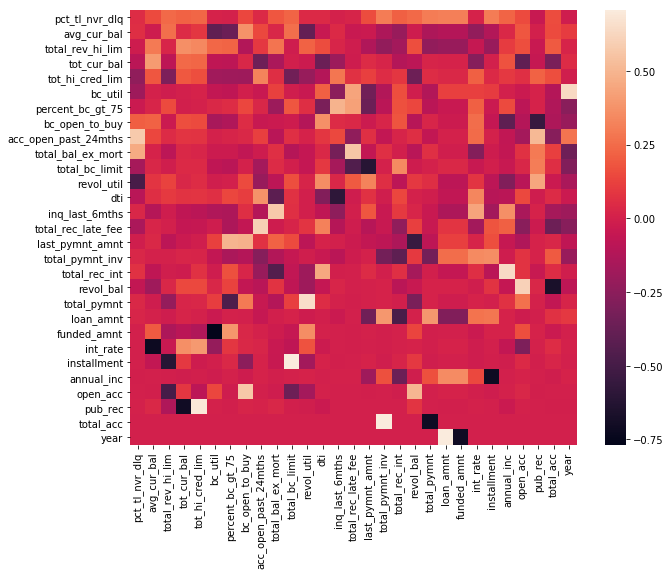

In [26]:
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]
# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort()
eig_pairs.reverse()
# Visually confirm that the list is correctly sorted by decreasing eigenvalues
#print('Eigenvalues in descending order:')
#for i in eig_pairs:
#    print(i[0])
eig_vals_sorted = [i[0] for i in eig_pairs]
eig_vec_sorted = [i[1] for i in eig_pairs]
loading_vectors = pd.DataFrame(data = eig_vec_sorted,index=numeric_columns)
#loading_vectors
#show eigen vector matrix
plt.figure(figsize=(10,8))
sns.heatmap(loading_vectors.values,
            xticklabels=numeric_columns,
            yticklabels=numeric_columns)

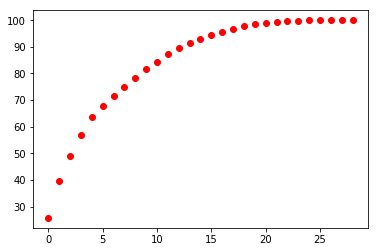

In [27]:
#scree plot of percent variance explained and PC
tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
plt.plot(cum_var_exp,'ro')
plt.show()
#removing outliers at contimnation level 5% allowed 90% varaiance to be exaplined by the first 12 PC's

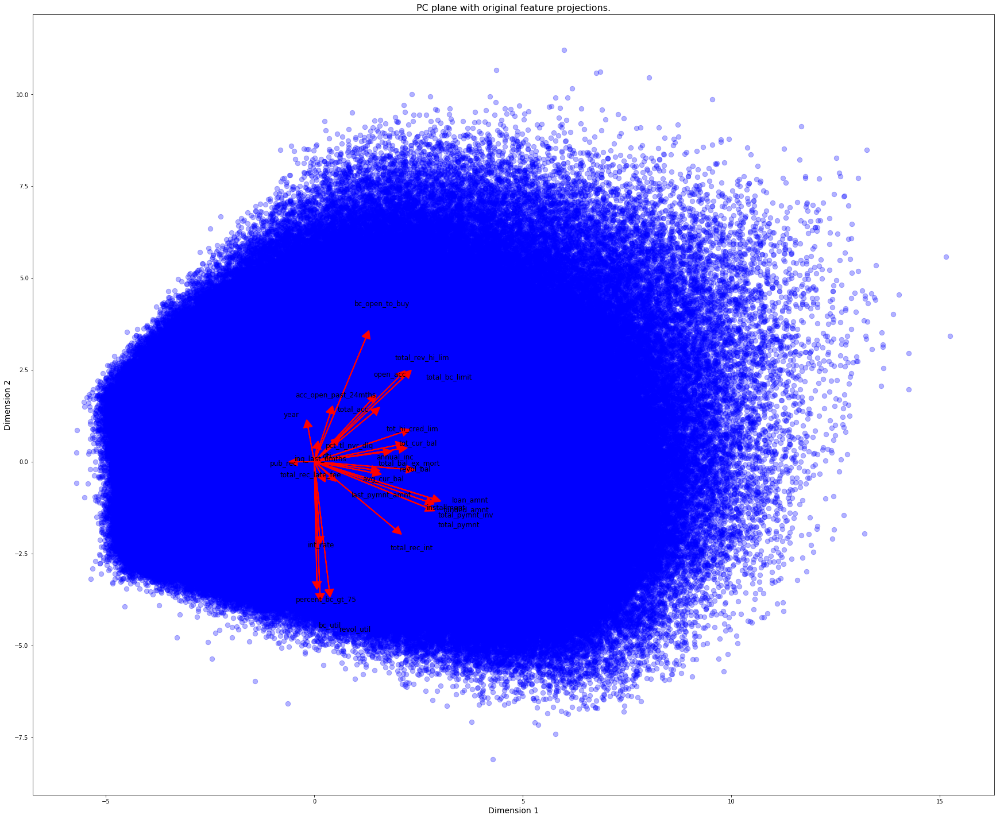

In [28]:
# creating a biplot
from sklearn.decomposition import PCA
pca = PCA(n_components=2).fit(lending_club_dropped_outliers_removed_std)
reduced_data = pca.transform(lending_club_dropped_outliers_removed_std)
pca_samples = pca.transform(lending_club_dropped_outliers_removed_std)
reduced_data = pd.DataFrame(reduced_data, columns = ['Dimension 1', 'Dimension 2'])

def biplot(data, reduced_data, pca):
    fig, ax = plt.subplots(figsize = (30,25))
    # scatterplot of the reduced data 
    ax.scatter(x=reduced_data.loc[:, 'Dimension 1'], y=reduced_data.loc[:, 'Dimension 2'], facecolors='b', edgecolors='b', s=70, alpha=0.3)
    feature_vectors = pca.components_.T
    # using scaling factors to make the arrows
    arrow_size, text_pos = 9.0, 11.0,
    # projections of the original features
    for i, v in enumerate(feature_vectors):
        ax.arrow(0, 0, arrow_size*v[0], arrow_size*v[1], head_width=0.2, head_length=0.2, linewidth=2, color='red')
        ax.text(v[0]*text_pos-np.random.normal()*.3, v[1]*text_pos+np.random.normal()*.3, numeric_columns[i], color='black', ha='center', va='center', fontsize=12)
        #ax.annotate(continous_variables[i], xy=(v[0]*text_pos, v[1]*text_pos), xytext=(v[0]+np.random.uniform(), v[1]+np.random.uniform()),
                    #arrowprops=dict(facecolor='black', shrink=0.05),)
    ax.set_xlabel("Dimension 1", fontsize=14)
    ax.set_ylabel("Dimension 2", fontsize=14)
    ax.set_title("PC plane with original feature projections.", fontsize=16);
    return ax
biplot(lending_club_std, reduced_data, pca)
#there are a shit ton of outliers!

In [29]:
#being clustering, transfrom data using 12 components
cum_var_exp

array([ 25.71962479,  39.60978275,  49.02499464,  56.85359346,
        63.56718083,  67.68243669,  71.42557509,  74.93903417,
        78.34779172,  81.51053364,  84.45897717,  87.14303512,
        89.48739296,  91.48176018,  93.07586024,  94.42200259,
        95.69487279,  96.73078232,  97.69566604,  98.44630831,
        98.90378142,  99.2707259 ,  99.59517387,  99.78626061,
        99.92724992,  99.98004671,  99.99999247, 100.        ,
       100.        ])

In [30]:
#reduce down to 14 PC
#getting ready for clustering using new PCA
#recall variables, notebook is getting too long
pca = PCA(n_components=15).fit(lending_club_dropped_outliers_removed_std)
pca_samples = pca.transform(lending_club_dropped_outliers_removed_std)
pca_samples.shape

(1614741, 15)

In [96]:
#create list of PC
list_PC_reduced_15 = ['PC {}'.format(i) for i in range(1,16)]
#make new dataframe 
PC_transformed_15 = pd.DataFrame(data=pca_samples, columns=list_PC_reduced_15,index=lending_club_dropped_outliers_removed.index)
print(PC_transformed_15.shape)
PC_transformed_15.head()

(1614741, 15)


,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,PC 9,PC 10,PC 11,PC 12,PC 13,PC 14,PC 15
0,-1.742851,-1.026284,0.094410,-0.499077,0.330612,-0.935587,0.248979,0.841885,-2.312139,0.017458,-0.891560,0.293398,0.123110,0.402213,0.841566
1,2.019340,0.086348,-1.031413,3.034515,-1.054032,-2.480268,0.279953,0.748908,-1.580959,-0.107220,0.744736,-0.108130,0.308527,-1.093966,0.070283
2,-3.017079,-0.586818,-0.451025,0.196952,0.380712,-0.827267,1.448636,0.282417,0.144326,2.185029,-0.125727,0.773526,-0.506004,-0.238987,-0.156397
3,8.440927,1.147034,4.203234,-3.652546,-2.495724,-2.206636,-0.652338,0.589503,-0.108154,0.828604,1.296003,-0.595277,-1.628818,2.574249,1.716160
4,-0.891052,-2.044823,-1.023623,2.151749,-0.285391,-0.910856,0.139455,-1.802579,0.289562,0.503588,-0.499189,-0.094794,1.642071,1.004575,0.826425


In [97]:
#try kmeans with 7clusters first
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=7)
#fit to PCA dataframe
kmeans.fit(PC_transformed_15)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=7, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [98]:
np.unique(kmeans.labels_,return_counts=True)
print(len(kmeans.labels_))
print(PC_transformed_15.shape)
#I don't want to run KMEANS onthe whole dataset to determing the number of clusters
#randomly sample from dataframe and get the inertia plot
PC_transformed_15_random = PC_transformed_15.sample(n=20000)
PC_transformed_15_random.shape


1614741
(1614741, 15)


(20000, 15)

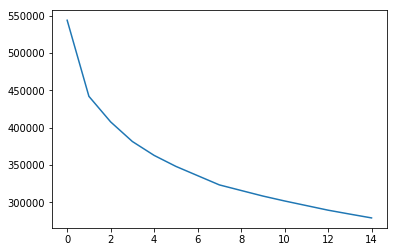

In [99]:
#use random sample to loop over clusters to determine cluster
clusters = 15
inertia_scores = np.zeros(clusters)
cluster_labels = []
for i in np.arange(1,clusters+1):
    #instantiate kmeans
    kmeans = KMeans(n_clusters=i,init='k-means++',n_init=10,max_iter=500)
    #fit to PCA dataframe
    kmeans.fit(PC_transformed_15_random)
    #get the intertia
    score = kmeans.inertia_
    #add score to intertia scores
    inertia_scores[i-1] = score
    #get the labels
    labels = kmeans.labels_
    #add the labels to the list
    cluster_labels.append(labels)
plt.plot(inertia_scores)
plt.show()
#test n_clusters 6,7,8,9

In [100]:
#start clustering
#determing the optimal number of clusters
from sklearn.cluster import KMeans
clusters = [6,7,8,9]
inertia_scores = []
cluster_labels = []
for i in clusters:
    #instantiate kmeans
    kmeans = KMeans(n_clusters=i,init='k-means++',n_init=10,max_iter=300)
    #fit to PCA dataframe
    kmeans.fit(PC_transformed_15)
    #get the intertia
    score = kmeans.inertia_
    #add score to intertia scores
    inertia_scores.append(score)
    #get the labels
    labels = kmeans.labels_
    #add the labels to the list
    cluster_labels.append(labels)

In [149]:
kmeans.cluster_centers_.shape

(9, 15)

In [104]:
#attach cluster labels back to the dataframe
for i in np.arange(len(clusters)):
    lending_club_dropped_outliers_removed['Label_for '+str(clusters[i])+' clusters'] = pd.Series(cluster_labels[i],
                                                                              index=lending_club_dropped_outliers_removed.index)
    
    
    

In [106]:
lending_club_dropped_outliers_removed.columns

Index(['pct_tl_nvr_dlq', 'avg_cur_bal', 'total_rev_hi_lim', 'tot_cur_bal', 'tot_hi_cred_lim', 'bc_util', 'percent_bc_gt_75', 'bc_open_to_buy', 'acc_open_past_24mths', 'total_bal_ex_mort', 'total_bc_limit', 'revol_util', 'dti', 'inq_last_6mths', 'total_rec_late_fee', 'last_pymnt_amnt', 'total_pymnt_inv', 'total_rec_int', 'revol_bal', 'total_pymnt', 'loan_amnt', 'funded_amnt', 'int_rate', 'installment', 'annual_inc', 'open_acc', 'pub_rec', 'total_acc', 'year', 'Label_for 6 clusters', 'Label_for 7 clusters', 'Label_for 8 clusters', 'Label_for 9 clusters'], dtype='object')

In [107]:
#now merge back on the original dataframe
#lets call back all necessary frames
PC_transformed_15
lending_club_dropped_outliers_removed_cluster_labels = lending_club_dropped_outliers_removed[['Label_for 6 clusters',
                                                                                              'Label_for 7 clusters',
                                                                                              'Label_for 8 clusters',
                                                                                              'Label_for 9 clusters']]
lending_club_outliers_labels = lending_club_dropped[['outlier label at0.02', 
                                                     'outlier label at0.027999999999999997', 
                                                     'outlier label at0.036', 'outlier label at0.044', 
                                                     'outlier label at0.05199999999999999', 
                                                     'outlier label at0.06']]
#create new columns with indexes
PC_transformed_15['index_labels'] = PC_transformed_15.index
lending_club_dropped_outliers_removed_cluster_labels['index_labels'] = lending_club_dropped_outliers_removed_cluster_labels.index
lending_club_outliers_labels['index_labels'] = lending_club_outliers_labels.index
print(PC_transformed_15.shape)
print(lending_club_dropped_outliers_removed_cluster_labels.shape)
print(lending_club_outliers_labels.shape)
PC_transformed_15.head()

(1614741, 16)
(1614741, 5)
(1675043, 7)


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,PC 9,PC 10,PC 11,PC 12,PC 13,PC 14,PC 15,index_labels
0,-1.742851,-1.026284,0.094410,-0.499077,0.330612,-0.935587,0.248979,0.841885,-2.312139,0.017458,-0.891560,0.293398,0.123110,0.402213,0.841566,0
1,2.019340,0.086348,-1.031413,3.034515,-1.054032,-2.480268,0.279953,0.748908,-1.580959,-0.107220,0.744736,-0.108130,0.308527,-1.093966,0.070283,1
2,-3.017079,-0.586818,-0.451025,0.196952,0.380712,-0.827267,1.448636,0.282417,0.144326,2.185029,-0.125727,0.773526,-0.506004,-0.238987,-0.156397,2
3,8.440927,1.147034,4.203234,-3.652546,-2.495724,-2.206636,-0.652338,0.589503,-0.108154,0.828604,1.296003,-0.595277,-1.628818,2.574249,1.716160,3
4,-0.891052,-2.044823,-1.023623,2.151749,-0.285391,-0.910856,0.139455,-1.802579,0.289562,0.503588,-0.499189,-0.094794,1.642071,1.004575,0.826425,4


In [111]:
#save files to hard disk before going on
PC_transformed_15.to_csv('PC_transformed_15.csv')
lending_club_dropped_outliers_removed_cluster_labels.to_csv('lending_club_dropped_outliers_removed_cluster_labels.csv')
lending_club_outliers_labels.to_csv('lending_club_outliers_labels.csv')




In [130]:
#merge these three back to the original lending club dataframe
list_frames_to_merge = [PC_transformed_15,lending_club_dropped_outliers_removed_cluster_labels,
                        lending_club_outliers_labels]

merged_frame1 = pd.merge(list_frames_to_merge[0],list_frames_to_merge[1],how="outer", on=['index_labels'])  
merged_frame2 = pd.merge(merged_frame1,list_frames_to_merge[2],how="outer", on=['index_labels']) 
merged_frame2.head()
##YES!!!!

,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,PC 9,PC 10,PC 11,PC 12,PC 13,PC 14,PC 15,index_labels,Label_for 6 clusters,Label_for 7 clusters,Label_for 8 clusters,Label_for 9 clusters,outlier label at0.02,outlier label at0.027999999999999997,outlier label at0.036,outlier label at0.044,outlier label at0.05199999999999999,outlier label at0.06
0,-1.742851,-1.026284,0.094410,-0.499077,0.330612,-0.935587,0.248979,0.841885,-2.312139,0.017458,-0.891560,0.293398,0.123110,0.402213,0.841566,0,0.0,6.0,6.0,5.0,1,1,1,1,1,1
1,2.019340,0.086348,-1.031413,3.034515,-1.054032,-2.480268,0.279953,0.748908,-1.580959,-0.107220,0.744736,-0.108130,0.308527,-1.093966,0.070283,1,5.0,4.0,2.0,6.0,1,1,1,1,1,1
2,-3.017079,-0.586818,-0.451025,0.196952,0.380712,-0.827267,1.448636,0.282417,0.144326,2.185029,-0.125727,0.773526,-0.506004,-0.238987,-0.156397,2,0.0,6.0,6.0,5.0,1,1,1,1,1,1
3,8.440927,1.147034,4.203234,-3.652546,-2.495724,-2.206636,-0.652338,0.589503,-0.108154,0.828604,1.296003,-0.595277,-1.628818,2.574249,1.716160,3,3.0,3.0,0.0,8.0,1,1,1,1,-1,-1
4,-0.891052,-2.044823,-1.023623,2.151749,-0.285391,-0.910856,0.139455,-1.802579,0.289562,0.503588,-0.499189,-0.094794,1.642071,1.004575,0.826425,4,5.0,5.0,4.0,3.0,1,1,1,1,1,1


In [133]:
#final tack on back to the original lending club frame
#make index
lending_club['index_labels'] = lending_club.index
final_frame = pd.merge(lending_club,merged_frame2,how='outer', on=['index_labels'])

In [135]:
#inspect head
final_frame.head()
final_frame.to_csv('lendingclub_final_attached_labels.csv')

In [136]:
final_frame.head()

,pct_tl_nvr_dlq,avg_cur_bal,total_rev_hi_lim,tot_cur_bal,tot_hi_cred_lim,bc_util,percent_bc_gt_75,bc_open_to_buy,acc_open_past_24mths,total_bal_ex_mort,total_bc_limit,revol_util,dti,zip_code,inq_last_6mths,total_rec_late_fee,Unnamed: 0,last_pymnt_amnt,application_type,total_pymnt_inv,total_rec_int,revol_bal,total_pymnt,home_ownership,loan_amnt,funded_amnt,term,int_rate,installment,grade,annual_inc,initial_list_status,issue_d,loan_status,addr_state,open_acc,pub_rec,total_acc,year,index_labels,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,PC 9,PC 10,PC 11,PC 12,PC 13,PC 14,PC 15,Label_for 6 clusters,Label_for 7 clusters,Label_for 8 clusters,Label_for 9 clusters,outlier label at0.02,outlier label at0.027999999999999997,outlier label at0.036,outlier label at0.044,outlier label at0.05199999999999999,outlier label at0.06
0,77.3,4349.0,22300.0,39143.0,58486.0,89.4,66.7,973.0,3.0,39143.0,9200.0,44.4%,15.55,027xx,0.0,0.0,0,320.91,Individual,11560.46,1560.46,9912.0,11560.462185,MORTGAGE,10000.0,10000.0,36 months,9.67%,321.13,B,102000.0,f,Dec-2013,Fully Paid,MA,9.0,0.0,22.0,2013,0,-1.742851,-1.026284,0.094410,-0.499077,0.330612,-0.935587,0.248979,0.841885,-2.312139,0.017458,-0.891560,0.293398,0.123110,0.402213,0.841566,0.0,6.0,6.0,5.0,1.0,1.0,1.0,1.0,1.0,1.0
1,90.2,869.0,43100.0,23473.0,43100.0,54.6,50.0,6811.0,9.0,23473.0,15000.0,54.5%,16.73,100xx,2.0,0.0,1,13334.93,Individual,23926.64,3126.64,23473.0,23926.640008,RENT,20800.0,20800.0,36 months,13.53%,706.16,B,81500.0,f,Dec-2013,Fully Paid,NY,29.0,0.0,41.0,2013,1,2.019340,0.086348,-1.031413,3.034515,-1.054032,-2.480268,0.279953,0.748908,-1.580959,-0.107220,0.744736,-0.108130,0.308527,-1.093966,0.070283,5.0,4.0,2.0,6.0,1.0,1.0,1.0,1.0,1.0,1.0
2,100.0,1772.0,20800.0,15949.0,33226.0,72.5,75.0,2255.0,2.0,15949.0,8200.0,34.6%,15.75,800xx,1.0,15.0,2,276.88,Individual,5622.50,1120.22,7203.0,5622.500000,MORTGAGE,8000.0,8000.0,36 months,10.99%,261.88,B,33000.0,f,Dec-2013,Charged Off,CO,9.0,1.0,16.0,2013,2,-3.017079,-0.586818,-0.451025,0.196952,0.380712,-0.827267,1.448636,0.282417,0.144326,2.185029,-0.125727,0.773526,-0.506004,-0.238987,-0.156397,0.0,6.0,6.0,5.0,1.0,1.0,1.0,1.0,1.0,1.0
3,100.0,53306.0,54200.0,799592.0,850886.0,67.1,16.7,13901.0,6.0,199739.0,42200.0,54.6%,18.55,945xx,1.0,0.0,3,23915.86,Individual,29150.98,1150.98,29581.0,29150.980000,MORTGAGE,28000.0,28000.0,36 months,7.62%,872.52,A,325000.0,w,Dec-2013,Fully Paid,CA,15.0,0.0,31.0,2013,3,8.440927,1.147034,4.203234,-3.652546,-2.495724,-2.206636,-0.652338,0.589503,-0.108154,0.828604,1.296003,-0.595277,-1.628818,2.574249,1.716160,3.0,3.0,0.0,8.0,1.0,1.0,1.0,1.0,-1.0,-1.0
4,100.0,2060.0,14100.0,24724.0,30891.0,70.1,50.0,2689.0,9.0,24724.0,9000.0,70.9%,27.06,937xx,0.0,0.0,4,4874.03,Individual,18786.25,7286.25,9996.0,18786.250257,RENT,11500.0,11500.0,60 months,22.90%,323.54,E,32760.0,f,Dec-2013,Fully Paid,CA,12.0,0.0,17.0,2013,4,-0.891052,-2.044823,-1.023623,2.151749,-0.285391,-0.910856,0.139455,-1.802579,0.289562,0.503588,-0.499189,-0.094794,1.642071,1.004575,0.826425,5.0,5.0,4.0,3.0,1.0,1.0,1.0,1.0,1.0,1.0


In [151]:
#examine across all years cluster labels by grouping
pd.crosstab(final_frame['grade'],final_frame['Label_for 8 clusters'])
#under the assumption, that A >B >C, ruling

Label_for 8 clusters,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0
grade,,,,,,,,
A,23117,78774,14679,6193,20165,32645,21771,65287
B,25161,123584,47748,21769,62616,51897,104697,39917
C,19957,92384,62589,44276,85365,41167,123693,18963
D,6618,33301,34314,33251,50253,13720,59838,4334
E,2482,11105,16039,22451,26945,4559,21511,1265
F,669,2793,5378,8859,9355,1092,5996,263
G,190,746,1675,2799,2748,261,1420,97


In [152]:
pd.crosstab(final_frame['loan_status'],final_frame['Label_for 8 clusters'])
#across yhear groupings

Label_for 8 clusters,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0
loan_status,,,,,,,,
Charged Off,7366,48900,44292,12928,42045,17614,68018,11959
Current,21184,80894,33303,27005,58943,34096,65986,34937
Default,0,4,0,2,4,2,1,0
Fully Paid,48960,209281,102586,97899,152955,92194,201597,82227
In Grace Period,228,875,638,597,1025,437,919,241
Late (16-30 days),71,379,238,157,366,156,337,120
Late (31-120 days),385,2354,1365,1010,2109,842,2068,642


In [161]:
#normalizd acriss years
pd.crosstab(final_frame['year'],final_frame['Label_for 8 clusters'],normalize="index")

Label_for 8 clusters,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0
year,,,,,,,,
2012,0.024568,0.137616,0.080677,0.099975,0.200863,0.083624,0.319638,0.053038
2013,0.032473,0.127974,0.085020,0.113449,0.220348,0.092038,0.271381,0.057317
2014,0.042574,0.161970,0.113173,0.110335,0.190739,0.085496,0.238352,0.057361
2015,0.052238,0.187281,0.121504,0.092466,0.177553,0.085063,0.209648,0.074248
2016,0.050229,0.231711,0.121875,0.082428,0.146177,0.090056,0.194966,0.082557
2017,0.052513,0.274857,0.106546,0.062496,0.116701,0.096885,0.183852,0.106149


In [167]:
cluster_columns = ['Label_for 6 clusters', 'Label_for 7 clusters', 'Label_for 8 clusters', 'Label_for 9 clusters', 'outlier label at0.02', 'outlier label at0.027999999999999997', 'outlier label at0.036', 'outlier label at0.044', 'outlier label at0.05199999999999999',
       'outlier label at0.06']
#function that converts float to object
def change_to_str(x):
    x = str(x)
    return(x)
for column in cluster_columns:
    final_frame[column] = final_frame[]



'0.0'